# Introducción

En el presente notebook se desarrollara todo el codigo relativo a la creación de un modelo de inteligencia artificial cuyo objetivo será la predicción del riesgo de enfermedad cardiovascular en base a una serie de datos obtenidos de conjuntos de pacientes.

El contenido del notebook está dividido en una serie de secciones. En primer lugar, se importan todos los datasets que se desean estudiar en el proyecto. Además para cada uno de ellos, se lleva a cabo un Análisis Exploratorio de datos (EDA), en este análisis se evalúa el contenido y se realiza un preprocesamiento para dejar los datos listos para su uso en los siguientes puntos. Un aspecto importante será la aplicación de técnicas de undersampling para corregir posibles desbalances entre un alto número de pacientes sin riesgo de enfermedades cardiovasculares y un menor número con riesgo de padecerlas.

Una vez completado el EDA, se procede al entrenamiento de modelos de Inteligencia Artificial (IA) de tipo Machine Learning (ML), que aprenderán por separado de cada conjunto de datos utilizando los algoritmos de DecisionTree, XGBoost, KNN y SVM. Posteriormente, se realizan diferentes evaluaciones de los modelos para obtener un punto de referencia (benchmark) con el cual comparar las técnicas de innovación y métodos que se pretenden aplicar para superar estas puntuaciones.

En este punto se comienzan a aplicar las técnicas cuyo uso queremos estudiar, en primer lugar, para corregir el desbalance, se probará el uso de redes generativas adversarias (GANS) mediante la técnica CTGAN para cada dataset, poniendo además foco en la manera de añadir muestras a estos datos mediante el valor de la métrica imbalanced ratio.

Una vez corregidos los desbalances de los datasets mediante redes GANs, se procederá al entrenamiento de un modelo para cada conjunto de datos utilizando la técnica basada en transformers llamada TabPFN, con el objetivo de realizar un entrenamiento con nuevas técnicas cuyo rendimiento se desea estudiar. Después de este entrenamiento, se aplicarán las diferentes métricas de evaluación utilizadas en los modelos anteriores para observar el nuevo rendimiento obtenido y realizar la comparación con el benchmark anterior.

Finalmente, se aplicarán las técnicas de interpretabilidad SHAP Y LIME para estudiar qué características han resultado más importantes para los modelos transformers entrenados con los datasets cuyo desbalance ha sido corregido mediante redes GANs. Esto permitirá dar sentido y una explicación razonable a las predicciones emitidas por los modelos, así como identificar qué consejos y en qué aspectos deberían poner una mayor atención los pacientes con este tipo de enfermedades.


#Ingesta

Debido a la dificultad de obtención de muestras de datos originales por la privacidad de su naturaleza, se utilizarán fuentes de datos públicas de calidad verificada, a continuación se detalla el listado de conjuntos de datos (CDs) que se emplearán:

* [CD1] Statlog (Heart): conjunto de datos de 13 características y 270 muestras que permite predecir la ausencia (0) o presencia (1) de cardiopatías. Pertenece a la colección de bases de datos de UCI Machine Learning Repository.
* [CD2] Cardiovascular Disease Dataset: conjunto de datos de 12 características y 1000 muestras que permite predecir la ausencia (0) o presencia (1) de cardiopatías. Procede de uno de los hospitales multiespecialidad de la India.
* [CD3] Heart Disease Dataset (Comprehensive): conjunto de datos de 11 características y 1190 muestras que permite predecir la ausencia (0) o presencia (1) de arteriopatías coronarias. Comprende 126 artículos y 68 conjuntos de datos extraídos de la literatura científica de 1992 a 2018.
* [CD4] Framingham Heart Study Dataset: conjunto de datos de 15 características y 4240 muestras que permite predecir la ausencia (0) o presencia (1) de riesgo de padecer una cardiopatía coronaria en un plazo de 10 años. El estudio Framingham comenzó en 1948 bajo el Servicio de Salud Pública de Estados Unidos y se transfirió al Instituto Nacional del Corazón en 1949, en él participaron hombres y mujeres de la localidad de Framingham en Massachusetts.
* [CD5] Heart Disease Health Indicators Dataset: conjunto de datos de 21 características y 253680 muestras que permite predecir la ausencia (0) o presencia (1) de cardiopatías. El Behavioral Risk Factor Surveillance System (BRFSS) es una encuesta telefónica que cada año recoge respuestas de más de 400.000 estadounidenses sobre aspectos relacionados con la salud, este conjunto de datos se trata de una muestra procesada de la edición del año 2015.
* [CD6] Cardiovascular Diseases Risk Prediction Dataset: conjunto de datos de 18 características y 308854 muestras que permite predecir la ausencia (0) o presencia (1) de cardiopatías. Del mismo modo que en el conjunto de datos anterior, este proviene de la encuesta BRFSS pero se trata de la edición del año 2021.

Todos estos conjuntos de datos se subieron a la plataforma google drive en un repositorio público, de manera que se pudieran descargar directamente desde el notebook sin necesidad de mantener copias en local, de este modo toda la información pasó a encontrarse disponible en el entorno de ejecución del código, tras lo cual se transformó en una estructura tabular de tipo Dataframe mediante la librería Pandas.

In [ ]:
# Se descarga el conjunto de datos
!wget "https://drive.google.com/uc?export=download&id=1epjdtfEV1d-taz0j6ojRa_JuIT9XjonH" -O 'dataset1.dat'
!wget "https://drive.google.com/uc?export=download&id=1Et552D8ep6jKTU9_r4z3qnjCVdNb6ZpX" -O 'dataset2.csv'
!wget "https://drive.google.com/uc?export=download&id=1qV_x84DfgXQhJYdl4sdc0nxgYEflnv4k" -O 'dataset3.csv'
!wget "https://drive.google.com/uc?export=download&id=1cfeQf6WeJLva0NtKCOuSPXqBow6DPLeg" -O 'dataset4.csv'
!wget "https://drive.google.com/uc?export=download&id=1jkqiLm97sz9AvcbKhAxu3pWyHqcMMhp-" -O 'dataset5.csv'
!wget "https://drive.google.com/uc?export=download&id=1UxYfHPofTNm70r4Q6ZVOFIhYSav-ftrn" -O 'dataset6.csv'


# Se importa pandas y se construye un dataframe a partir del dataset descargado
import pandas as pd

file_dataset1 = 'dataset1.dat'
columns_dataset1 = ['age', 'sex', 'chest_pain_type', 'resting_blood_pressure', 'serum_cholestoral', 'fasting_blood_sugar', 'resting_electrocardiographic_results',
                    'maximum_heart_rate_achieved', 'exercise_induced_angina', 'oldpeak', 'slope_of_the_peak_exercise', 'number_of_major_vessels', 'thal', 'heart_disease']
dataset1 = pd.read_csv(file_dataset1, sep=' ', names=columns_dataset1)

dataset2 = pd.read_csv('dataset2.csv')
dataset3 = pd.read_csv('dataset3.csv')
dataset4 = pd.read_csv('dataset4.csv')
dataset5 = pd.read_csv('dataset5.csv')
dataset6 = pd.read_csv('dataset6.csv')

--2024-09-04 14:22:17--  https://drive.google.com/uc?export=download&id=1epjdtfEV1d-taz0j6ojRa_JuIT9XjonH
Resolving drive.google.com (drive.google.com)... 172.253.122.138, 172.253.122.100, 172.253.122.139, ...
Connecting to drive.google.com (drive.google.com)|172.253.122.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1epjdtfEV1d-taz0j6ojRa_JuIT9XjonH&export=download [following]
--2024-09-04 14:22:17--  https://drive.usercontent.google.com/download?id=1epjdtfEV1d-taz0j6ojRa_JuIT9XjonH&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 142.251.167.132, 2607:f8b0:4004:c07::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|142.251.167.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16461 (16K) [application/octet-stream]
Saving to: ‘dataset1.dat’

dataset1.dat        100%[===================>]  16.08K  --.-KB/

# Análisis Exploratorio de Datos

Una vez realizada la adquisición de la información, se efectuó un análisis exploratorio de los datos con el propósito de obtener un mayor conocimiento sobre el dataset con el que se va a trabajar.

El análisis exploratorio de datos se apoyará en el módulo EDAModule desarrollado por mí, del cual se importará la clase ExploratoryDataAnalysis con todas las funcionalidades necesarias para llevar a cabo el estudio de la estructura y distribución de la información. Por tanto el primer paso será descargar dicho módulo desde un repositorio público ubicado en GitHub, importar su clase y seguidamente aplicar sus métodos a cada uno de los datasets importados en la sección anterior.

La clase importada permite estudiar los siguientes aspectos de cada dataset
* Dimensiones: número de filas y columnas del dataframe, así como número de datos totales
* Variables: listado de columnas del dataframe
* Tipos: tipo de cada una de las variables, principalmente si son numéricas o categóricas
* Valores únicos: número de valores distintos que almacena cada variable
* Estadísticas:diversas estadísticas sobre la distribución de los datos en las distintas variables numéricas del dataframe
* Valores nulos: datos faltantes en cualquier fila o columna, la ausencia de datos puede suponer un problema en los algoritmos de IA y análisis de ciencia de datos a la hora de comprender las distribuciones de las variables
* Outliers: los gráficos boxplots permiten apreciar la distribución de valores de las variables, en este punto se emplearán para identificar aquellas variables que presenten valores muy alejados del grueso de su distribución, estos valores extremadamente alejados de la media se denominan outliers.
* Histogramas: los histogramas son un tipo de gráfica que permiten observar con mayor claridad la distribución de los datos de una variables, en este punto se generará un histograma para cada variable numérica presente en los datasets


In [ ]:
# Se importa el módulo con todas las funciones auxiliares
!rm -r ExploratoryDataAnalysis/

!git clone https://github.com/jj-tena/ExploratoryDataAnalysis.git

!mv ExploratoryDataAnalysis/EDAModule.py ExploratoryDataAnalysis/../EDAModule.py

!rm -r ExploratoryDataAnalysis/

from EDAModule import ExploratoryDataAnalysis

def executeEDA(eda):
  # Se ejecuta la función getShape para obtener las dimensiones del dataframe
  print("1. Shape: ", eda.getShape())

  # Se ejecuta la función getSize para obtener el tamaño del dataframe
  print("\n2. Size:", eda.getSize())

  # Se ejecuta la función getHead para obtener una muestra del dataframe
  print("\n3. Head:")
  print(eda.getHead())

  # Se ejecuta la función getColumns para obtener el listado de columnas del dataframe
  print("\n4. Columns:", eda.getColumns())

  # Se ejecuta la función getTypes para obtener el tipo de cada variable del dataframe
  print("\n5. Data Types:")
  print(eda.getTypes())

  # Se ejecuta la función getUniques para mostrar los valores únicos de cada variable del dataframe
  print("\n6. List of Unique Values:")
  print(eda.getUniques())

  # Se ejecuta la función countUniques para mostrar el número de valores únicos de cada variable del dataframe
  print("\n7. Count of Unique Values:")
  print(eda.countUniques())

  # Se ejecuta la función getStatistics para obtener datos estadísticas de todas las columnas del dataframe
  print("\n8. Summary Statistics for Numerical Columns:")
  print(eda.getStatistics())

  # Se ejecuta la función getNulls para obtener el número de valores nulos de cada columna del dataframe
  print("\n9. Checking for Missing Values:")
  print(eda.getNulls())

  # Se ejecuta la función getBoxplots para mostrar un gráfico boxplot de cada variable del dataframe
  print("\n10. Boxplot visualization")
  eda.getBoxplots()

  # Se ejecuta la función getHistograms para mostrar un histograma de 10 bins para cada variable del dataframe
  print("\n11. Histogram visualization with 10 bins")
  eda.getHistograms()

rm: cannot remove 'ExploratoryDataAnalysis/': No such file or directory
Cloning into 'ExploratoryDataAnalysis'...
remote: Enumerating objects: 19, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 19 (delta 2), reused 15 (delta 1), pack-reused 0 (from 0)
Receiving objects: 100% (19/19), 4.85 KiB | 4.85 MiB/s, done.
Resolving deltas: 100% (2/2), done.


## Dataset 1

1. Shape:  (270, 14)

2. Size: 3780

3. Head:
    age  sex  chest_pain_type  resting_blood_pressure  serum_cholestoral  \
0  70.0  1.0              4.0                   130.0              322.0   
1  67.0  0.0              3.0                   115.0              564.0   
2  57.0  1.0              2.0                   124.0              261.0   
3  64.0  1.0              4.0                   128.0              263.0   
4  74.0  0.0              2.0                   120.0              269.0   

   fasting_blood_sugar  resting_electrocardiographic_results  \
0                  0.0                                   2.0   
1                  0.0                                   2.0   
2                  0.0                                   0.0   
3                  0.0                                   0.0   
4                  0.0                                   2.0   

   maximum_heart_rate_achieved  exercise_induced_angina  oldpeak  \
0                        109.0              

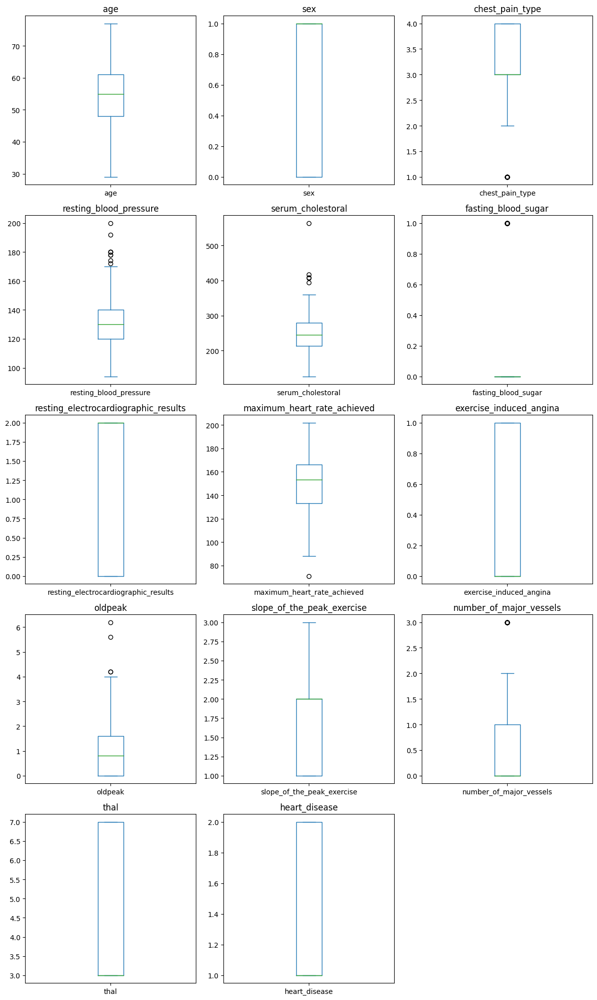


11. Histogram visualization with 10 bins


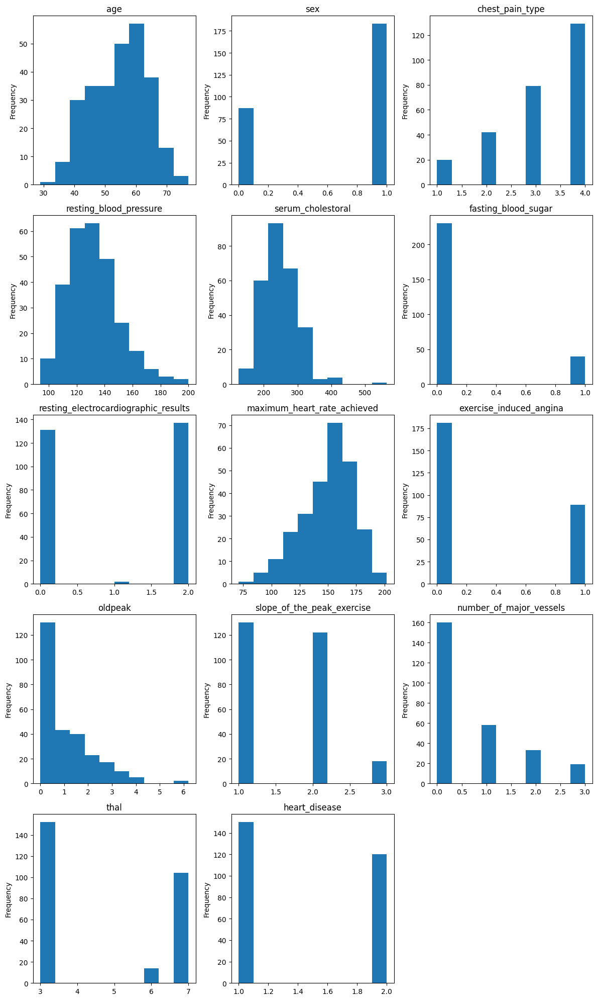

In [ ]:
# Se inicializa el módulo mediante el dataframe
eda1 = ExploratoryDataAnalysis(dataset=dataset1)

executeEDA(eda1)

## Dataset 2

1. Shape:  (1000, 14)

2. Size: 14000

3. Head:
   patientid  age  gender  chestpain  restingBP  serumcholestrol  \
0     103368   53       1          2        171                0   
1     119250   40       1          0         94              229   
2     119372   49       1          2        133              142   
3     132514   43       1          0        138              295   
4     146211   31       1          1        199                0   

   fastingbloodsugar  restingrelectro  maxheartrate  exerciseangia  oldpeak  \
0                  0                1           147              0      5.3   
1                  0                1           115              0      3.7   
2                  0                0           202              1      5.0   
3                  1                1           153              0      3.2   
4                  0                2           136              0      5.3   

   slope  noofmajorvessels  target  
0      3                 3     

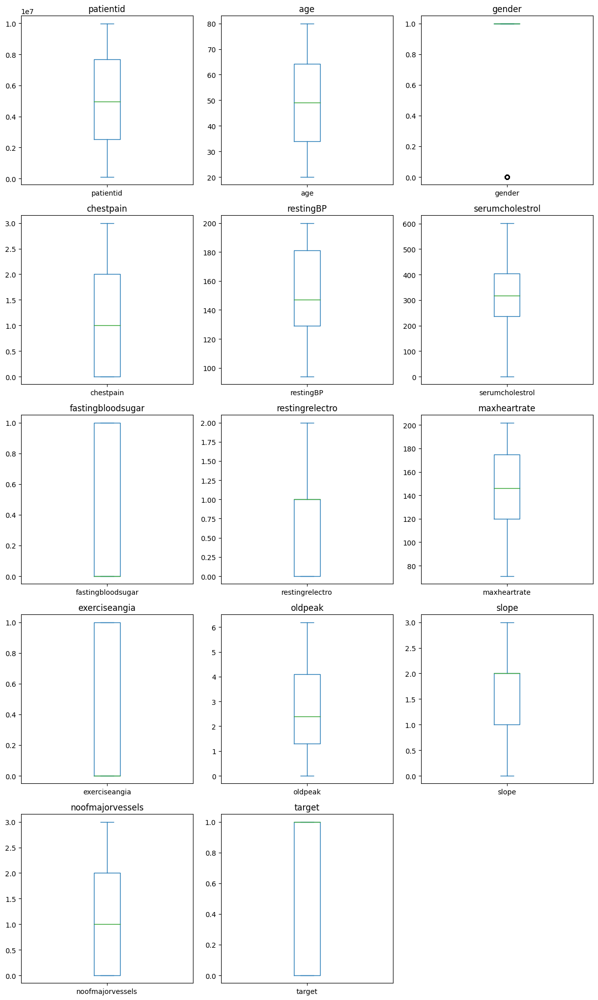


11. Histogram visualization with 10 bins


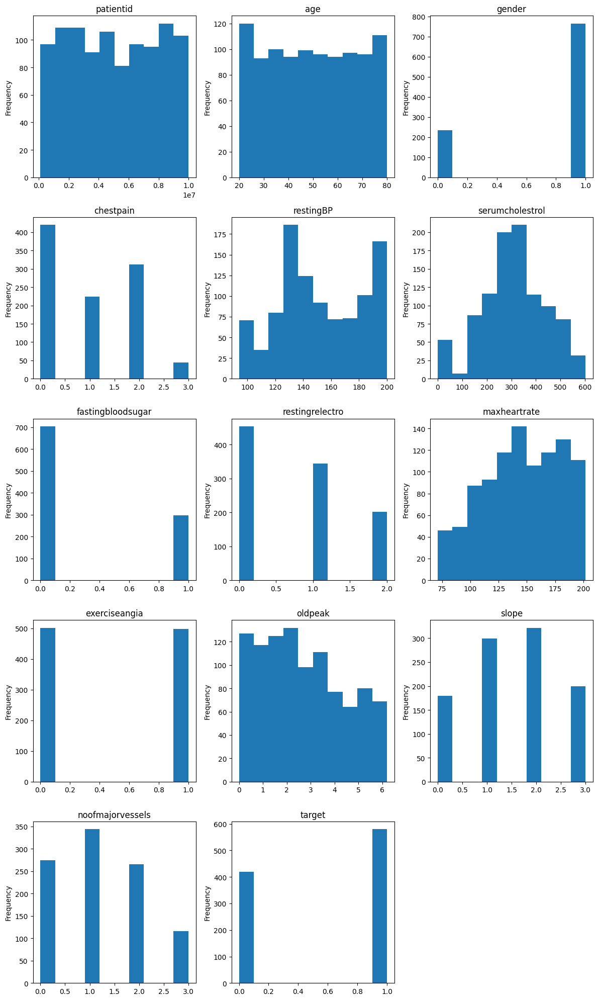

In [ ]:
eda2 = ExploratoryDataAnalysis(dataset=dataset2)

executeEDA(eda2)

## Dataset 3

1. Shape:  (1190, 12)

2. Size: 14280

3. Head:
   age  sex  chest pain type  resting bp s  cholesterol  fasting blood sugar  \
0   40    1                2           140          289                    0   
1   49    0                3           160          180                    0   
2   37    1                2           130          283                    0   
3   48    0                4           138          214                    0   
4   54    1                3           150          195                    0   

   resting ecg  max heart rate  exercise angina  oldpeak  ST slope  target  
0            0             172                0      0.0         1       0  
1            0             156                0      1.0         2       1  
2            1              98                0      0.0         1       0  
3            0             108                1      1.5         2       1  
4            0             122                0      0.0         1       0  

4. Colum

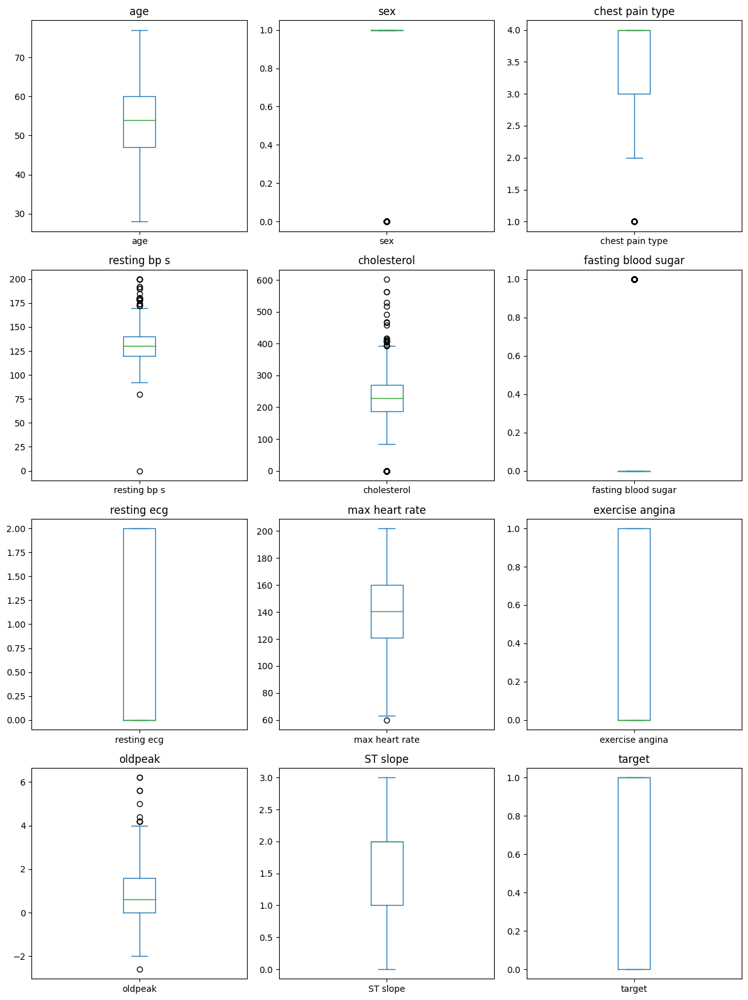


11. Histogram visualization with 10 bins


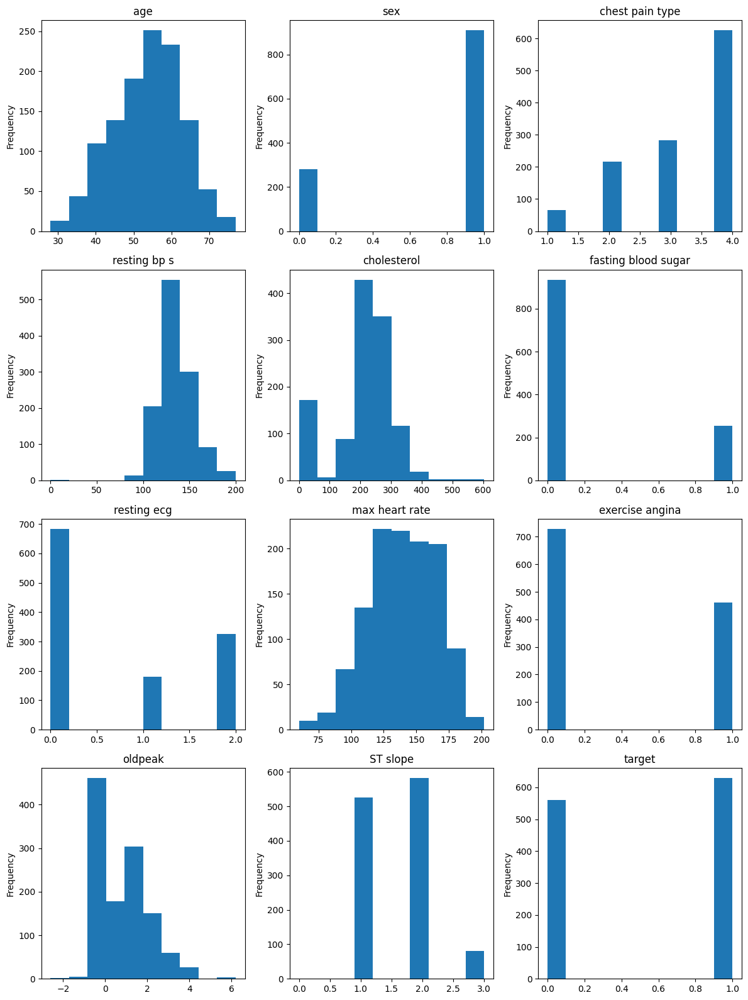

In [ ]:
eda3 = ExploratoryDataAnalysis(dataset=dataset3)

executeEDA(eda3)

## Dataset 4

1. Shape:  (4240, 16)

2. Size: 67840

3. Head:
   male  age  education  currentSmoker  cigsPerDay  BPMeds  prevalentStroke  \
0     1   39        4.0              0         0.0     0.0                0   
1     0   46        2.0              0         0.0     0.0                0   
2     1   48        1.0              1        20.0     0.0                0   
3     0   61        3.0              1        30.0     0.0                0   
4     0   46        3.0              1        23.0     0.0                0   

   prevalentHyp  diabetes  totChol  sysBP  diaBP    BMI  heartRate  glucose  \
0             0         0    195.0  106.0   70.0  26.97       80.0     77.0   
1             0         0    250.0  121.0   81.0  28.73       95.0     76.0   
2             0         0    245.0  127.5   80.0  25.34       75.0     70.0   
3             1         0    225.0  150.0   95.0  28.58       65.0    103.0   
4             0         0    285.0  130.0   84.0  23.10       85.0     85.0   

  

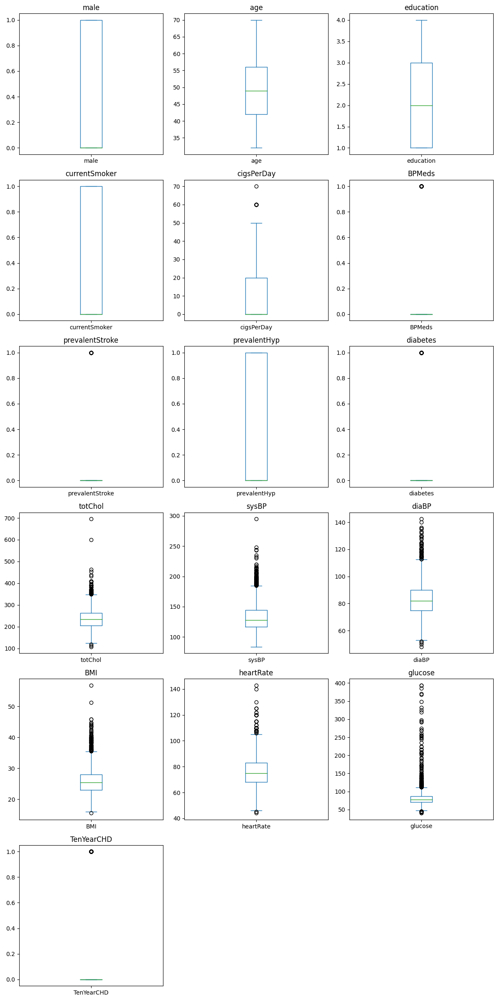


11. Histogram visualization with 10 bins


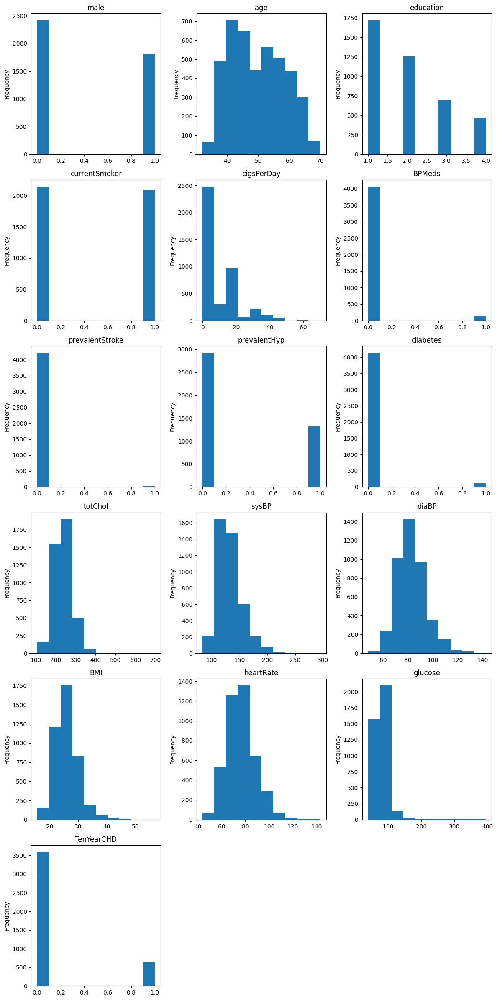

In [ ]:
eda4 = ExploratoryDataAnalysis(dataset=dataset4)

executeEDA(eda4)

## Dataset 5

1. Shape:  (253680, 22)

2. Size: 5580960

3. Head:
   HeartDiseaseorAttack  HighBP  HighChol  CholCheck   BMI  Smoker  Stroke  \
0                   0.0     1.0       1.0        1.0  40.0     1.0     0.0   
1                   0.0     0.0       0.0        0.0  25.0     1.0     0.0   
2                   0.0     1.0       1.0        1.0  28.0     0.0     0.0   
3                   0.0     1.0       0.0        1.0  27.0     0.0     0.0   
4                   0.0     1.0       1.0        1.0  24.0     0.0     0.0   

   Diabetes  PhysActivity  Fruits  ...  AnyHealthcare  NoDocbcCost  GenHlth  \
0       0.0           0.0     0.0  ...            1.0          0.0      5.0   
1       0.0           1.0     0.0  ...            0.0          1.0      3.0   
2       0.0           0.0     1.0  ...            1.0          1.0      5.0   
3       0.0           1.0     1.0  ...            1.0          0.0      2.0   
4       0.0           1.0     1.0  ...            1.0          0.0      2.0   

   M

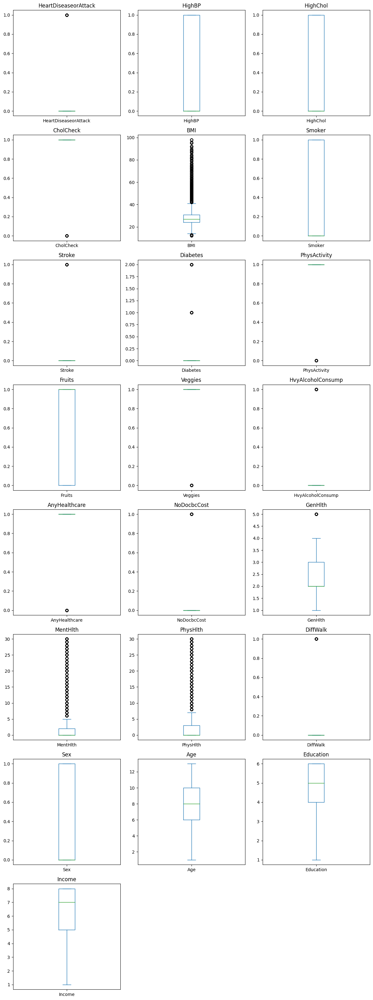


11. Histogram visualization with 10 bins


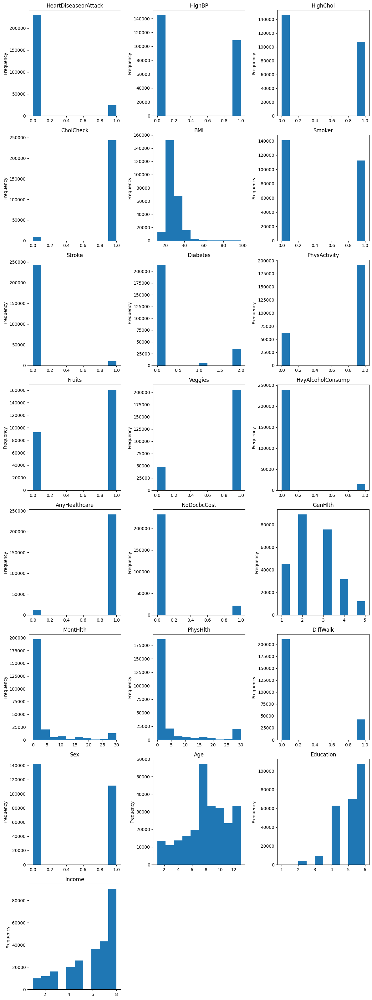

In [ ]:
eda5 = ExploratoryDataAnalysis(dataset=dataset5)

executeEDA(eda5)

## Dataset 6

1. Shape:  (308854, 19)

2. Size: 5868226

3. Head:
  General_Health                  Checkup Exercise Heart_Disease Skin_Cancer  \
0           Poor  Within the past 2 years       No            No          No   
1      Very Good     Within the past year       No           Yes          No   
2      Very Good     Within the past year      Yes            No          No   
3           Poor     Within the past year      Yes           Yes          No   
4           Good     Within the past year       No            No          No   

  Other_Cancer Depression Diabetes Arthritis     Sex Age_Category  \
0           No         No       No       Yes  Female        70-74   
1           No         No      Yes        No  Female        70-74   
2           No         No      Yes        No  Female        60-64   
3           No         No      Yes        No    Male        75-79   
4           No         No       No        No    Male          80+   

   Height_(cm)  Weight_(kg)    BMI Smoking_History  

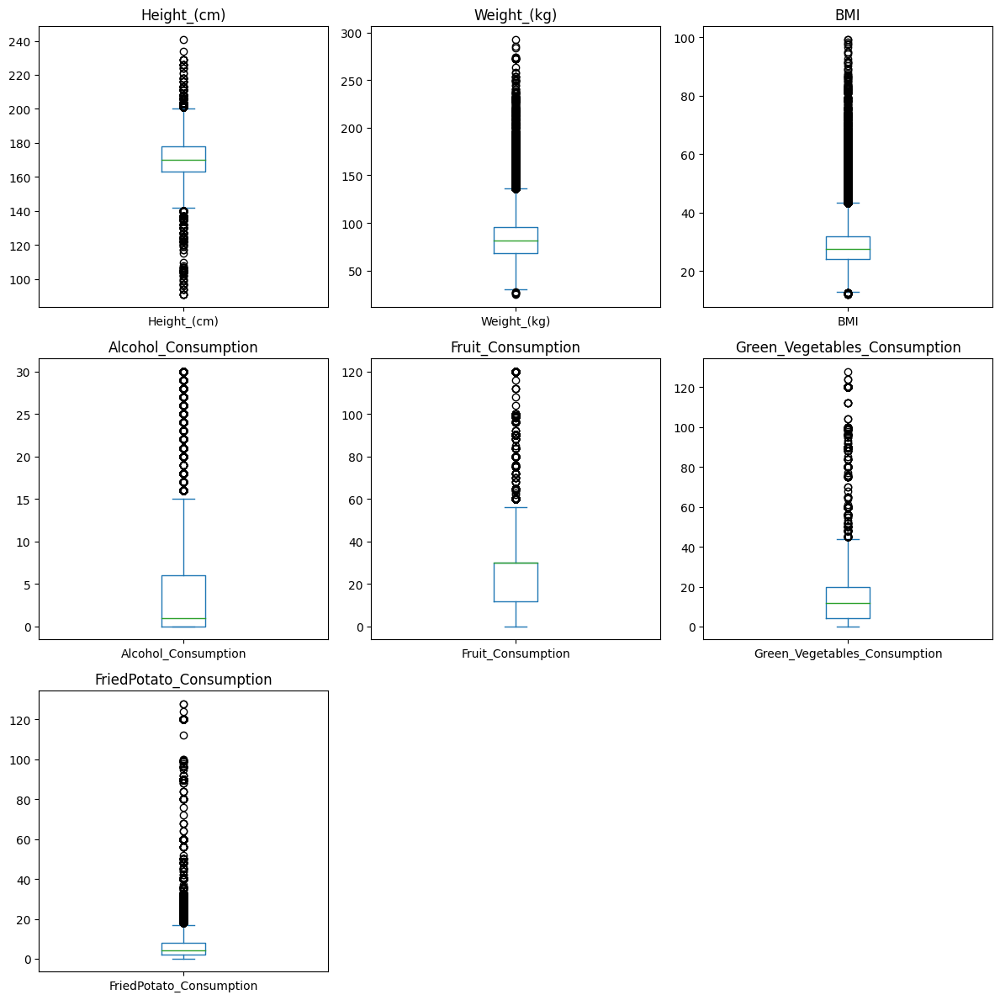


11. Histogram visualization with 10 bins


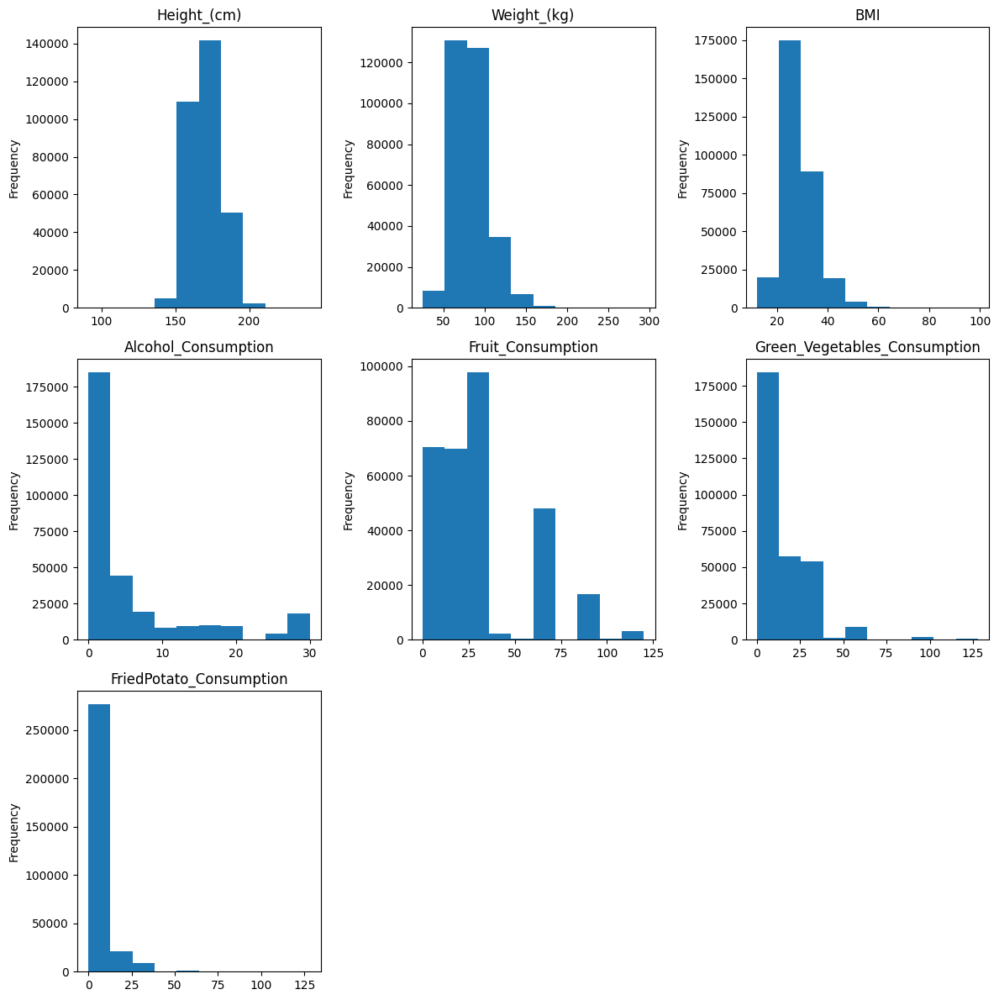

In [ ]:
eda6 = ExploratoryDataAnalysis(dataset=dataset6)

executeEDA(eda6)

# Limpieza y Preprocesamiento

El proceso de limpieza y preprocesado de un conjunto de datos tiene como objetivo prepararlo para su utilización en algoritmos de análisis y modelado. Se compone de una serie de pasos que buscan garantizar la calidad e los datos para su posterior manipulación por algoritmos de aprendizaje automático u otras técnicas.

La limpieza de datos implica la identificación y la corrección de posibles problemas en el conjunto de datos para asegurar que estén completos y coherentes, lo cual es fundamental para obtener resultados significativos en el análisis posterior. En este trabajo se evaluará la detección y eliminación de valores atípicos y la eliminación o imputación de valores faltantes.

El preprocesado de datos implica una serie de transformaciones y ajustes destinados a preparar los datos optimizando su calidad y utilidad de manera específica para su utilización en algoritmos de modelado. En este trabajo se evaluará la selección de características relevantes, la estandarización de variables numéricas y la codificación de variables categóricas.

**Detección y eliminación de valores atípicos**

La detección y eliminación de valores atípicos es un proceso en el que se identifican observaciones inusuales o extremas en un conjunto de datos y se toman medidas para eliminarlas o corregirlas. Los valores atípicos (outliers) pueden distorsionar los resultados del análisis y afectar negativamente el rendimiento de los modelos de aprendizaje automático.

Dado el foco en el uso de técnicas de aprendizaje no supervisado de este trabajo, se utilizarán dos algoritmos de este tipo para la detección de outliers, los cuales buscarán posibles datos anómalos sin la necesidad del entrenamiento con muestras etiquetadas, los algoritmos que se utilizarán son:

* Local Outlier Factor (LOF): se basa en la idea de que los valores atípicos tienen una densidad local significativamente menor que la de sus vecinos. LOF calcula un factor de atipicidad para cada instancia en función de la densidad local de sus vecinos, si un punto tiene un factor LOF alto, significa que está menos densamente rodeado que la mayoría de los puntos. Los valores atípicos se identifican como aquellos puntos con un factor LOF significativamente mayor que 1.

* Isolation Forest: se basa en el uso de árboles de decisión, se diferencia del método anterior en que no asume que los datos atípicos están necesariamente en áreas de baja densidad. El algoritmo funciona construyendo múltiples árboles de decisión de manera aleatoria, cada árbol divide recursivamente el espacio de características en subconjuntos, seleccionando al azar una característica y un valor de división para cada división. Los valores atípicos se identifican más rápidamente en el proceso de construcción del árbol, ya que necesitan menos divisiones para ser aislados. La puntuación de anomalía se calcula basándose en el promedio de la profundidad de los nodos donde se encuentran los datos, los valores atípicos tendrán puntuaciones de anomalía más bajas.

Después de ejecutar ambos algoritmos, se registra el número de valores atípicos detectados por cada uno y se procede a eliminar aquellos detectados por ambos.

In [ ]:
import pandas as pd
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
import numpy as np

# Crear el modelo de Local Outlier Factor (LOF)
clf_lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)

def deleteOutliers(dataset):
    # Ajustar el modelo LOF a los datos
    outliers_lof = clf_lof.fit_predict(dataset)

    # Identificar valores atípicos con LOF
    outliers_indices_lof = np.where(outliers_lof == -1)

    # Crear el modelo de Isolation Forest (IF)
    clf_if = IsolationForest(random_state=0)

    # Ajustar el modelo IF a los datos
    outliers_if = clf_if.fit_predict(dataset)

    # Identificar valores atípicos con IF
    outliers_indices_if = np.where(outliers_if == -1)

    # Encontrar valores atípicos en común
    common_outliers = np.intersect1d(outliers_indices_lof, outliers_indices_if)

    # Imprimir resultados
    print("Número de valores atípicos detectados por LOF:", len(outliers_indices_lof[0]))
    print("Número de valores atípicos detectados por IF:", len(outliers_indices_if[0]))

    if len(common_outliers) > 0:
        print("Número de valores atípicos en común:", len(common_outliers))
        # Convertir el arreglo de NumPy a DataFrame
        dataset = pd.DataFrame(dataset)
        # Eliminar valores atípicos en común del conjunto de datos original
        print("Número de entradas en el dataset original antes de eliminar valores atípicos en común:", dataset.shape[0])
        dataset = dataset.drop(common_outliers)
        print("Número de entradas en el dataset original después de eliminar valores atípicos en común:", dataset.shape[0])
    else:
        print("\nNo hay valores atípicos en común entre LOF y IF.")

**Eliminación o imputación de valores faltantes**

La eliminación o imputación de valores faltantes es un proceso utilizado en el análisis de datos para tratar con observaciones que tienen valores ausentes. Cuando se encuentran valores faltantes en un conjunto de datos, es necesario abordarlos para que no afecten negativamente al entrenamiento y evaluación del modelo.

In [ ]:
def deleteNulls(dataset):

    null_count_before = dataset.isnull().sum().sum()

    # Verificar si hay valores nulos
    if null_count_before > 0:
        # Mostrar el número de filas con valores nulos antes de eliminarlos
        print("Número de filas con valores nulos antes de eliminarlos:", null_count_before)

        # Eliminar filas con valores nulos
        dataset.dropna(inplace=True)

        # Mostrar el número de filas con valores nulos después de eliminarlos
        null_count_after = dataset.isnull().sum().sum()
        print("Número de filas con valores nulos después de eliminarlos:", null_count_after)
    else:
        print("No hay valores nulos en el DataFrame.")

    return dataset

**Estandarización de variables numéricas**

La estandarización de variables numéricas tiene como objetivo transformar las variables numéricas para que tengan una media de cero y una desviación estándar de uno. Esto significa que los valores de las variables transformadas estarán centrados alrededor de cero y tendrán una dispersión similar, lo que facilita la comparación y el análisis de las variables. La estandarización es útil en situaciones en las que las variables tienen diferentes escalas y unidades de medida, ya que ayuda a evitar que las variables con magnitudes más grandes dominen la contribución al modelo.

Para llevar a cabo este proceso se utilizará el algoritmo StandardScaler que implementa la estandarización escalando las características de tal manera que tengan una media de cero y una desviación estándar de uno.

**Codificación de variables categóricas**

La codificación de variables categóricas es un proceso que se utiliza para convertir variables categóricas en una forma numérica que los algoritmos de aprendizaje automático pueden entender y utilizar de manera efectiva.

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
import pandas as pd

def scaleEncode(dataset, column_to_encode):
    # Extraer la columna específica del DataFrame
    column_data = dataset[column_to_encode]
    dataset = dataset.drop(columns=[column_to_encode])

    # Obtener las columnas numéricas y categóricas restantes
    num_cols = dataset.select_dtypes(include=['int64', 'float64']).columns
    cat_cols = dataset.select_dtypes(include=['object']).columns

    # Definir los pipelines para las columnas numéricas y categóricas
    num_pipeline = Pipeline([
        ('scaler', StandardScaler())  # Escalar los valores numéricos
    ])

    cat_pipeline = Pipeline([
        ('encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))  # Codificar las variables categóricas
    ])

    # Crear el preprocesador utilizando ColumnTransformer
    preprocessor = ColumnTransformer([
        ('Numeric Columns', num_pipeline, num_cols),  # Aplicar el pipeline a las columnas numéricas
        ('Categorical Columns', cat_pipeline, cat_cols)  # Aplicar el pipeline a las columnas categóricas
    ])

    # Aplicar las transformaciones al DataFrame
    transformed_data = preprocessor.fit_transform(dataset)

    # Convertir el resultado de NumPy de vuelta a un DataFrame
    transformed_dataframe = pd.DataFrame(transformed_data, columns=num_cols.tolist() + cat_cols.tolist())

    # Agregar la columna específica nuevamente al DataFrame preprocesado
    transformed_dataframe[column_to_encode] = column_data

    return transformed_dataframe


Una vez se tienen definidos todos los puntos que se abordarán en la etapa de preprocesamiento y limpieza, se crea un método que permite la aplicación de manera consecutiva de todos los anteriores desde un único punto de acceso.

In [ ]:
def preprocess(dataframe, target):
  dataframe_without_nulls = deleteNulls(dataframe)
  dataframe_scaled_encoded = scaleEncode(dataframe_without_nulls, target)
  deleteOutliers(dataframe_scaled_encoded)
  return dataframe_scaled_encoded

def preprocessWithoutOutliers(dataframe, target):
  dataframe_without_nulls = deleteNulls(dataframe)
  dataframe_scaled_encoded = scaleEncode(dataframe_without_nulls, target)
  return dataframe_scaled_encoded

## Dataset 1

In [ ]:
dataset1['heart_disease'].replace({1: 0, 2: 1}, inplace=True)

dataset1_preprocessed = preprocess(dataset1, 'heart_disease')

No hay valores nulos en el DataFrame.
Número de valores atípicos detectados por LOF: 27
Número de valores atípicos detectados por IF: 85
Número de valores atípicos en común: 27
Número de entradas en el dataset original antes de eliminar valores atípicos en común: 270
Número de entradas en el dataset original después de eliminar valores atípicos en común: 243


## Dataset 2

In [ ]:
dataset2 = dataset2.drop(columns=['patientid'])

dataset2_preprocessed = preprocess(dataset2, 'target')

No hay valores nulos en el DataFrame.
Número de valores atípicos detectados por LOF: 100
Número de valores atípicos detectados por IF: 695
Número de valores atípicos en común: 99
Número de entradas en el dataset original antes de eliminar valores atípicos en común: 1000
Número de entradas en el dataset original después de eliminar valores atípicos en común: 901


## Dataset 3

In [ ]:
dataset3_preprocessed = preprocess(dataset3, 'target')

No hay valores nulos en el DataFrame.
Número de valores atípicos detectados por LOF: 119
Número de valores atípicos detectados por IF: 429
Número de valores atípicos en común: 93
Número de entradas en el dataset original antes de eliminar valores atípicos en común: 1190
Número de entradas en el dataset original después de eliminar valores atípicos en común: 1097


## Dataset 4

In [ ]:
dataset4_preprocessed = preprocessWithoutOutliers(dataset4, 'TenYearCHD')

Número de filas con valores nulos antes de eliminarlos: 645
Número de filas con valores nulos después de eliminarlos: 0


## Dataset 5

In [ ]:
dataset5_preprocessed = preprocess(dataset5, 'HeartDiseaseorAttack')

No hay valores nulos en el DataFrame.
Número de valores atípicos detectados por LOF: 25368
Número de valores atípicos detectados por IF: 79514
Número de valores atípicos en común: 5128
Número de entradas en el dataset original antes de eliminar valores atípicos en común: 253680
Número de entradas en el dataset original después de eliminar valores atípicos en común: 248552


## Dataset 6

In [ ]:
dataset6['Heart_Disease'].replace({'Yes': 1, 'No': 0}, inplace=True)

dataset6_preprocessed = preprocess(dataset6, 'Heart_Disease')

No hay valores nulos en el DataFrame.
Número de valores atípicos detectados por LOF: 30886
Número de valores atípicos detectados por IF: 94016
Número de valores atípicos en común: 16239
Número de entradas en el dataset original antes de eliminar valores atípicos en común: 308854
Número de entradas en el dataset original después de eliminar valores atípicos en común: 292615


# Undersampling

El undersampling es una técnica utilizada en problemas de clasificación desbalanceados para reducir el número de muestras de las clases mayoritarias (o más frecuentes) con el fin de igualarlas a la cantidad de muestras de las clases minoritarias (o menos frecuentes). Esto se logra eliminando muestras de las clases mayoritarias hasta que la proporción entre las clases sea más equilibrada.

Cuando se trabaja con conjuntos de datos desbalanceados, donde una clase es mucho más frecuente que las demás, los modelos de aprendizaje automático tienden a tener dificultades para aprender y generalizar correctamente sobre las clases minoritarias. Esto puede llevar a modelos sesgados que predigan predominantemente la clase mayoritaria, ignorando las clases minoritarias. Por lo tanto, es importante abordar este desbalance de clases para obtener modelos más equilibrados y precisos.

Al reducir el número de muestras de las clases mayoritarias, se pueden mitigar los efectos del desbalance, permitiendo que el modelo se entrene de manera más equilibrada en todas las clases y mejorando su capacidad para reconocer y clasificar las clases minoritarias.

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

def undersample_target(dataframe, target, seed=42):
    # Extraer la columna objetivo
    y = dataframe[target]

    # Crear un muestreador de undersampling
    undersampler = RandomUnderSampler(random_state=seed)

    # Aplicar undersampling a los datos
    X_resampled, y_resampled = undersampler.fit_resample(dataframe.drop(columns=[target]), y)

    # Reconstruir el DataFrame con los datos balanceados
    dataframe_resampled = pd.concat([pd.DataFrame(X_resampled, columns=dataframe.drop(columns=[target]).columns), pd.Series(y_resampled, name=target)], axis=1)

    return dataframe_resampled

## Dataset 1

In [ ]:
dataset1_undersampled = undersample_target(dataset1_preprocessed, 'heart_disease')

## Dataset 2

In [ ]:
dataset2_undersampled = undersample_target(dataset2_preprocessed, 'target')

## Dataset 3

In [ ]:
dataset3_undersampled = undersample_target(dataset3_preprocessed, 'target')

## Dataset 4

In [ ]:
dataset4_preprocessed.dropna(inplace=True)

dataset4_undersampled = undersample_target(dataset4_preprocessed, 'TenYearCHD')

## Dataset 5

In [ ]:
dataset5_undersampled = undersample_target(dataset5_preprocessed, 'HeartDiseaseorAttack')

## Dataset 6

In [ ]:
dataset6_undersampled = undersample_target(dataset6_preprocessed, 'Heart_Disease')

# Entrenamiento y Evaluación: Benchmark

Tras familiarizarse con los datos, el siguiente objetivo fue el entrenamiento del modelo predictivo, para ello se seleccionará el conjunto de algoritmos de aprendizaje supervisado que se compararán para cada uno de los datasets, dado que se trata de un problema de clasificación binaria, se han elegido los siguientes algoritmos:

* Decision Tree: este algoritmo de aprendizaje supervisado construye un árbol de decisiones a partir de los datos de entrenamiento. Cada nodo del árbol representa una característica, cada rama una decisión basada en esa característica, y cada hoja una etiqueta de clasificación. Es útil para problemas de clasificación y regresión, proporcionando una visualización clara y fácil de entender del proceso de toma de decisiones.
* KNN (K-Nearest Neighbors): este clasificador asigna una etiqueta a un punto de datos basándose en la mayoría de las etiquetas de sus k vecinos más cercanos. Es un algoritmo de aprendizaje supervisado simple y versátil que se adapta bien a conjuntos de datos con estructuras no lineales y cuando la localidad en la distribución de datos es importante. Sin embargo, puede ser computacionalmente costoso para grandes conjuntos de datos y puede requerir una normalización adecuada de los datos para funcionar correctamente.
* SVC (Support Vector Classifier): SVC es un algoritmo de aprendizaje supervisado que encuentra el hiperplano óptimo que maximiza el margen entre las clases en el espacio de características. Es útil para problemas de clasificación binaria y linealmente separables, pero también puede emplearse en problemas de regresión y clasificación no lineales mediante el uso de kernels. SVM es robusto frente a conjuntos de datos con alta dimensionalidad y es eficaz incluso en conjuntos de datos con un número pequeño de muestras.
* XGBoost: XGBoost es un algoritmo de aprendizaje supervisado basado en árboles de decisión que utiliza técnicas de boosting para mejorar el rendimiento predictivo. Es muy eficaz para problemas de clasificación y regresión, y es conocido por su velocidad y rendimiento en conjuntos de datos grandes y complejos. XGBoost también ofrece flexibilidad en el ajuste de hiperparámetros para optimizar el rendimiento del modelo.

Para cada uno de los algoritmos, se utiliza la técnica GridSearchCV que permite obtener los mejores hiperparámetros según el conjunto de datos con el que se esté trabajando. A continuación, se da una explicación de los hiperparámetros que se utilizarán para cada algoritmo:
* Decision Tree:
 * criterion: Gini y Entropy son los criterios para medir la calidad de una división. Gini mide la impureza y Entropy mide la desorganización de la información.
 * max_depth: Controla la profundidad máxima del árbol para evitar el sobreajuste. None permite que el árbol crezca sin limitaciones, mientras que valores como 10, 20, y 30 limitan su crecimiento.
* KNeighbors:
 * n_neighbors: Número de vecinos a considerar en la clasificación. Probar con 3, 5 y 7 ayuda a encontrar el balance entre considerar pocos o muchos vecinos.
weights: uniform da el mismo peso a todos los vecinos, mientras que distance da más peso a los vecinos más cercanos.
 * metric: métrica para medir la distancia entre puntos. euclidean y manhattan son las opciones probadas.
* SVC:
 * C: Parámetro de regularización. Un C bajo puede provocar un ajuste insuficiente, mientras que un C alto puede causar sobreajuste.
 * kernel: linear y rbf son tipos de kernel que transforman los datos. linear es una transformación lineal, mientras que rbf es una transformación no lineal basada en funciones radiales.
 * gamma: scale y auto son las opciones probadas para el coeficiente gamma en los kernels no lineales.
* XGBoost:
 * n_estimators: Número de árboles que se construirán en el modelo. Valores probados: 50, 100, 200.
 * max_depth: Profundidad máxima de cada árbol. Valores probados: 3, 6, 9.
 * learning_rate: Tasa de aprendizaje, que controla la contribución de cada árbol al modelo final. Valores probados: 0.01, 0.1, 0.2.
 * subsample: Proporción de muestras utilizadas para entrenar cada árbol. Valores probados: 0.8, 1.0.
 * colsample_bytree: Proporción de características utilizadas para entrenar cada árbol. Valores probados: 0.8, 1.0.

Para evaluar las distintas opciones de preprocesamiento, se empleará el método holdout, realizando varias particiones mediante el algoritmo train-test. Se dividirá el conjunto de datos en 5 particiones diferentes, controlando la reproducibilidad mediante una semilla. Para cada partición, se aplicará GridSearchCV para realizar una búsqueda exhaustiva de hiperparámetros, utilizando un pipeline que incluye el preprocesamiento y el modelo supervisado.

La evaluación del rendimiento del modelo se realizará utilizando múltiples métricas de evaluación para proporcionar una visión más completa de la capacidad predictiva de los modelos:
* Precision (Precisión): proporción de verdaderos positivos entre todas las instancias que fueron clasificadas como positivas. Una alta precisión indica que la mayoría de las predicciones positivas del modelo son correctas.
* Recall (Sensibilidad o Exhaustividad): proporción de verdaderos positivos entre todas las instancias que realmente son positivas. Un alto recall indica que el modelo es capaz de identificar la mayoría de las instancias positivas.
* F1-Score: media entre la precisión y la exhaustividad. Es especialmente útil en escenarios donde el balance entre precisión y recall es crucial, como en casos con clases desbalanceadas.
* AUC-ROC (Área bajo la curva ROC): mide la capacidad del modelo para distinguir entre las clases positivas y negativas.
 * La curva ROC (Receiver Operating Characteristic) muestra la relación entre la tasa de verdaderos positivos (TPR) y la tasa de falsos positivos (FPR) a varios umbrales de clasificación.
 * El área bajo la curva ROC (AUC) proporciona un valor agregado que mide la habilidad del modelo para distinguir entre clases. Un AUC cercano a 1 indica un excelente desempeño.

Para cada modelo entrenado, se registrará la puntuación F1 obtenida en cada partición, además de la media y la desviación estándar de estas puntuaciones, así como para las métricas Precisión, Recall, y AUC-ROC. Este proceso permite asegurar que los resultados son consistentes y que el modelo generaliza bien a diferentes subconjuntos de datos.

El código también incluye la visualización de la matriz de confusión y la curva ROC para cada partición en cada modelo, lo que proporciona una visión adicional sobre el rendimiento del modelo en la clasificación de las clases.

Finalmente, aunque se evaluarán todos los modelos, se seleccionará siempre el modelo entrenado con XGBoost como el modelo final debido a su eficacia para ser analizado por los algoritmos de interpretabilidad.

In [ ]:
df_results = pd.DataFrame({
    'DecisionTreeF1': [0]*6,
    'DecisionTreePrecision': [0]*6,
    'DecisionTreeRecall': [0]*6,
    'DecisionTreeAucRoc': [0]*6,
    'XGBoostF1': [0]*6,
    'XGBoostPrecision': [0]*6,
    'XGBoostRecall': [0]*6,
    'XGBoostAucRoc': [0]*6,
    'KNNF1': [0]*6,
    'KNNPrecision': [0]*6,
    'KNNRecall': [0]*6,
    'KNNAucRoc': [0]*6,
    'SVCF1': [0]*6,
    'SVCPrecision': [0]*6,
    'SVCRecall': [0]*6,
    'SVCAucRoc': [0]*6,
    'TabpfnF1': [0]*6,
    'TabpfnPrecision': [0]*6,
    'TabpfnRecall': [0]*6,
    'TabpfnAucRoc': [0]*6
})

# Mostrar el DataFrame
print(df_results)

   DecisionTreeF1  DecisionTreePrecision  DecisionTreeRecall  \
0               0                      0                   0   
1               0                      0                   0   
2               0                      0                   0   
3               0                      0                   0   
4               0                      0                   0   
5               0                      0                   0   

   DecisionTreeAucRoc  XGBoostF1  XGBoostPrecision  XGBoostRecall  \
0                   0          0                 0              0   
1                   0          0                 0              0   
2                   0          0                 0              0   
3                   0          0                 0              0   
4                   0          0                 0              0   
5                   0          0                 0              0   

   XGBoostAucRoc  KNNF1  KNNPrecision  KNNRecall  KNNAucRoc  SVCF1 

In [ ]:
!pip install xgboost

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score, precision_score, recall_score, roc_auc_score, roc_curve
import numpy as np
import matplotlib.pyplot as plt

# Definir los clasificadores y sus nombres
classifiers = {
    'DecisionTree': DecisionTreeClassifier(),
    'XGBoost': xgb.XGBClassifier(eval_metric='mlogloss'),
    'KNN': KNeighborsClassifier(),
    'SVC': SVC(probability=True)  # SVC con `probability=True` para poder usar predict_proba
}

# Definir los hiperparámetros para cada clasificador
param_grids = {
    'DecisionTree': {
        'decisiontreeclassifier__criterion': ['gini', 'entropy'],
        'decisiontreeclassifier__max_depth': [None, 10, 20, 30]
    },
    'XGBoost': {
        'xgbclassifier__n_estimators': [50, 100, 200],
        'xgbclassifier__max_depth': [3, 6, 9],
        'xgbclassifier__learning_rate': [0.01, 0.1, 0.2],
        'xgbclassifier__subsample': [0.8, 1.0],
        'xgbclassifier__colsample_bytree': [0.8, 1.0]
    },
    'KNN': {
        'kneighborsclassifier__n_neighbors': [3, 5, 7],
        'kneighborsclassifier__weights': ['uniform', 'distance'],
        'kneighborsclassifier__metric': ['euclidean', 'manhattan']
    },
    'SVC': {
        'svc__C': [0.1, 1, 10],
        'svc__kernel': ['linear', 'rbf', 'poly'],
        'svc__gamma': ['scale', 'auto']
    }
}

def test_model(name, model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]  # Obtener las probabilidades para la clase positiva

    cm = confusion_matrix(y_test, y_pred)

    # Imprimir la matriz de confusión
    print(f"Matriz de Confusión - {name}:\n")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot()
    plt.title(f"Matriz de Confusión - {name}")
    plt.gcf().set_size_inches(5, 3)
    plt.show()

    # Calcular e imprimir métricas adicionales
    f1 = f1_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    auc_roc = roc_auc_score(y_test, y_proba)
    print(f"Puntuación F1 (Weighted): {f1:.4f}")
    print(f"Precisión (Weighted): {precision:.4f}")
    print(f"Recall (Weighted): {recall:.4f}")
    print(f"AUC-ROC (Weighted): {auc_roc:.4f}\n")

    # Graficar la curva AUC-ROC
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {auc_roc:.4f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {name}')
    plt.legend(loc="lower right")
    plt.gcf().set_size_inches(5, 3)
    plt.show()

    return {'f1': f1, 'precision': precision, 'recall': recall, 'auc_roc': auc_roc, 'model': model}

def evaluate_models(dataframe, target, row_index):
    if target not in dataframe.columns:
        raise ValueError(f"La columna objetivo '{target}' no se encuentra en el DataFrame")

    print("Evaluación del Modelo:\n")

    features = dataframe.drop(columns=[target])
    labels = dataframe[target]

    seed = 42
    n_splits = 5
    holdout_results = {name: [] for name in classifiers.keys()}

    best_xgboost_model = None

    for split in range(n_splits):
        X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=seed + split)

        for name, classifier in classifiers.items():
            pipeline = make_pipeline(StandardScaler(), classifier)
            grid_search = GridSearchCV(pipeline, param_grids[name], cv=3, scoring='f1_weighted', n_jobs=-1)
            grid_search.fit(X_train, y_train)
            best_pipeline = grid_search.best_estimator_

            print(f"Split {split + 1} - {name}:\n")
            print("Mejores Hiperparámetros: ", grid_search.best_params_)
            results = test_model(name, best_pipeline, X_test, y_test)
            results['params'] = grid_search.best_params_
            holdout_results[name].append(results)

            if name == 'XGBoost':
                best_xgboost_model = best_pipeline

    summary_results = {}
    for name in classifiers.keys():
        print(f"Resultados generales para {name}:\n")
        f1_scores = [result['f1'] for result in holdout_results[name]]
        precision_scores = [result['precision'] for result in holdout_results[name]]
        recall_scores = [result['recall'] for result in holdout_results[name]]
        auc_roc_scores = [result['auc_roc'] for result in holdout_results[name]]

        summary_results[f'{name}F1'] = np.mean(f1_scores)
        summary_results[f'{name}Precision'] = np.mean(precision_scores)
        summary_results[f'{name}Recall'] = np.mean(recall_scores)
        summary_results[f'{name}AucRoc'] = np.mean(auc_roc_scores)

        print(f"Puntuación F1 Media: {summary_results[f'{name}F1']:.4f}")
        print(f"Desviación Estándar de F1: {np.std(f1_scores):.4f}")
        print(f"Precisión Media: {summary_results[f'{name}Precision']:.4f}")
        print(f"Desviación Estándar de Precisión: {np.std(precision_scores):.4f}")
        print(f"Recall Medio: {summary_results[f'{name}Recall']:.4f}")
        print(f"Desviación Estándar de Recall: {np.std(recall_scores):.4f}")
        print(f"AUC-ROC Medio: {summary_results[f'{name}AucRoc']:.4f}")
        print(f"Desviación Estándar de AUC-ROC: {np.std(auc_roc_scores):.4f}\n")

    # Crear DataFrame para almacenar resultados
    result_df = pd.DataFrame([summary_results])

    # Actualizar el DataFrame df_results con los nuevos resultados
    for key, value in summary_results.items():
        df_results.loc[row_index, key] = value

    # Mostrar el DataFrame actualizado
    print(df_results)

    # Devolver siempre el modelo XGBoost
    return best_xgboost_model

def evaluate_models_no_svc_hyperparams(dataframe, target, row_index):
    if target not in dataframe.columns:
        raise ValueError(f"La columna objetivo '{target}' no se encuentra en el DataFrame")

    print("Evaluación del Modelo:\n")

    features = dataframe.drop(columns=[target])
    labels = dataframe[target]

    seed = 42
    n_splits = 5
    holdout_results = {name: [] for name in classifiers.keys()}

    best_xgboost_model = None

    for split in range(n_splits):
        X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=seed + split)

        for name, classifier in classifiers.items():
            pipeline = make_pipeline(StandardScaler(), classifier)

            if name == 'SVC':
                # Entrenar SVC sin búsqueda de hiperparámetros
                pipeline.fit(X_train, y_train)
                best_pipeline = pipeline
                print(f"Split {split + 1} - {name}:\n")
                print("SVC se entrenó con los parámetros predeterminados.")
            else:
                # Realizar búsqueda de hiperparámetros para los otros modelos
                grid_search = GridSearchCV(pipeline, param_grids[name], cv=3, scoring='f1_weighted', n_jobs=-1)
                grid_search.fit(X_train, y_train)
                best_pipeline = grid_search.best_estimator_
                print(f"Split {split + 1} - {name}:\n")
                print("Mejores Hiperparámetros: ", grid_search.best_params_)

            results = test_model(name, best_pipeline, X_test, y_test)
            if name != 'SVC':
                results['params'] = grid_search.best_params_
            holdout_results[name].append(results)

            if name == 'XGBoost':
                best_xgboost_model = best_pipeline

    summary_results = {}
    for name in classifiers.keys():
        print(f"Resultados generales para {name}:\n")
        f1_scores = [result['f1'] for result in holdout_results[name]]
        precision_scores = [result['precision'] for result in holdout_results[name]]
        recall_scores = [result['recall'] for result in holdout_results[name]]
        auc_roc_scores = [result['auc_roc'] for result in holdout_results[name]]

        summary_results[f'{name}F1'] = np.mean(f1_scores)
        summary_results[f'{name}Precision'] = np.mean(precision_scores)
        summary_results[f'{name}Recall'] = np.mean(recall_scores)
        summary_results[f'{name}AucRoc'] = np.mean(auc_roc_scores)

        print(f"Puntuación F1 Media: {summary_results[f'{name}F1']:.4f}")
        print(f"Desviación Estándar de F1: {np.std(f1_scores):.4f}")
        print(f"Precisión Media: {summary_results[f'{name}Precision']:.4f}")
        print(f"Desviación Estándar de Precisión: {np.std(precision_scores):.4f}")
        print(f"Recall Medio: {summary_results[f'{name}Recall']:.4f}")
        print(f"Desviación Estándar de Recall: {np.std(recall_scores):.4f}")
        print(f"AUC-ROC Medio: {summary_results[f'{name}AucRoc']:.4f}")
        print(f"Desviación Estándar de AUC-ROC: {np.std(auc_roc_scores):.4f}\n")

    # Crear DataFrame para almacenar resultados
    result_df = pd.DataFrame([summary_results])

    # Actualizar el DataFrame df_results con los nuevos resultados
    for key, value in summary_results.items():
        df_results.loc[row_index, key] = value

    # Mostrar el DataFrame actualizado
    print(df_results)

    # Devolver siempre el modelo XGBoost
    return best_xgboost_model

## Dataset 1

Evaluación del Modelo:

Split 1 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 20}
Matriz de Confusión - DecisionTree:



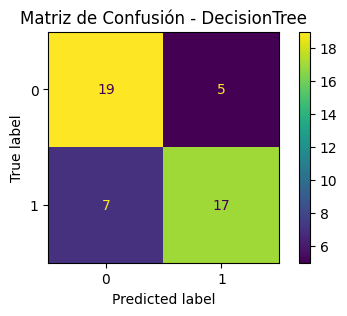

Puntuación F1 (Weighted): 0.7496
Precisión (Weighted): 0.7517
Recall (Weighted): 0.7500
AUC-ROC (Weighted): 0.7500



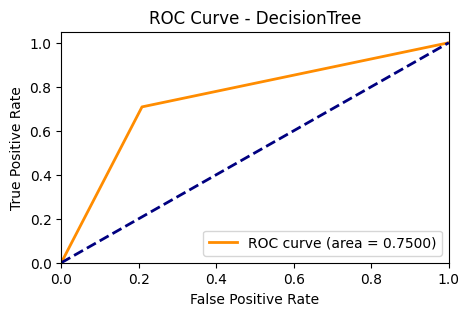

Split 1 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



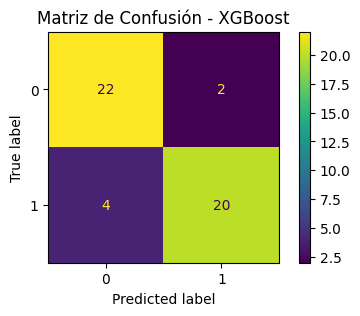

Puntuación F1 (Weighted): 0.8748
Precisión (Weighted): 0.8776
Recall (Weighted): 0.8750
AUC-ROC (Weighted): 0.9340



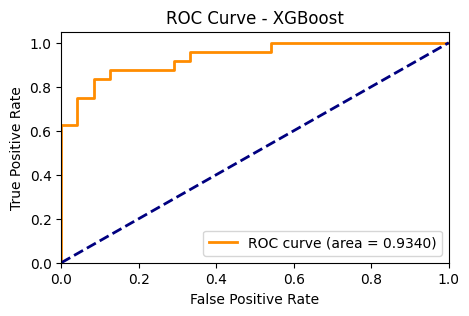

Split 1 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



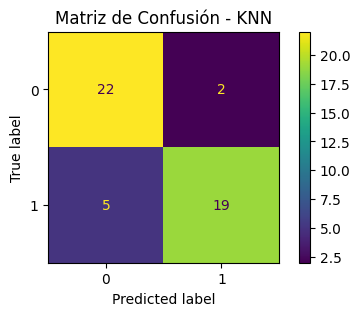

Puntuación F1 (Weighted): 0.8536
Precisión (Weighted): 0.8598
Recall (Weighted): 0.8542
AUC-ROC (Weighted): 0.9045



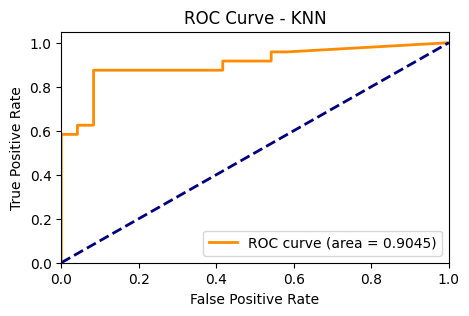

Split 1 - SVC:

Mejores Hiperparámetros:  {'svc__C': 0.1, 'svc__gamma': 'scale', 'svc__kernel': 'linear'}
Matriz de Confusión - SVC:



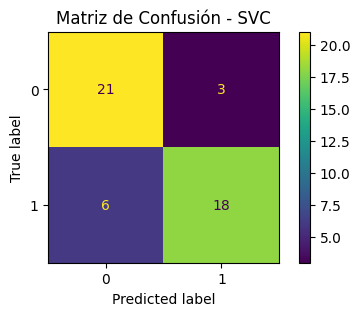

Puntuación F1 (Weighted): 0.8118
Precisión (Weighted): 0.8175
Recall (Weighted): 0.8125
AUC-ROC (Weighted): 0.8993



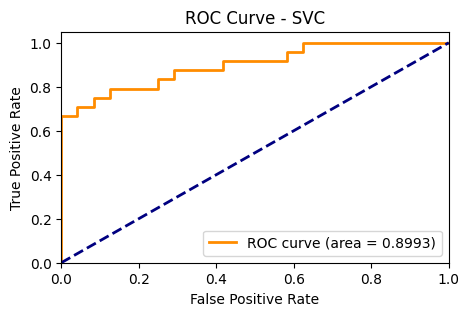

Split 2 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 30}
Matriz de Confusión - DecisionTree:



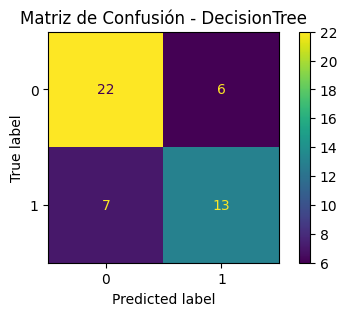

Puntuación F1 (Weighted): 0.7281
Precisión (Weighted): 0.7276
Recall (Weighted): 0.7292
AUC-ROC (Weighted): 0.7179



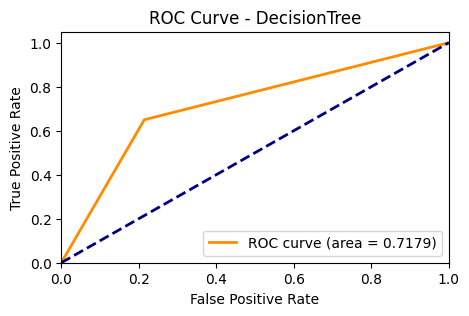

Split 2 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



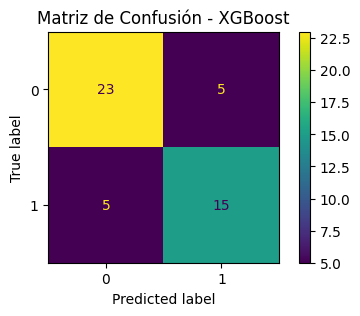

Puntuación F1 (Weighted): 0.7917
Precisión (Weighted): 0.7917
Recall (Weighted): 0.7917
AUC-ROC (Weighted): 0.8679



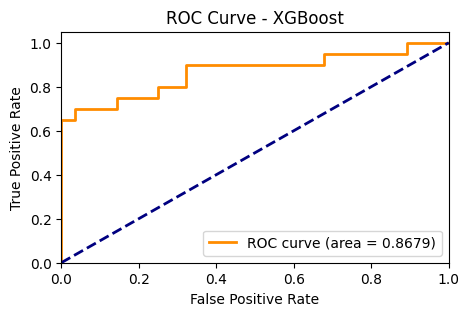

Split 2 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'euclidean', 'kneighborsclassifier__n_neighbors': 5, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



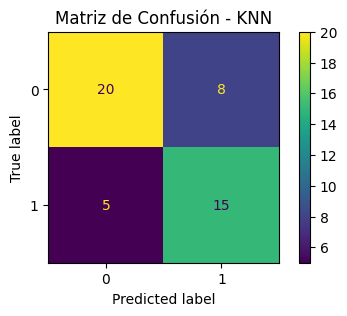

Puntuación F1 (Weighted): 0.7309
Precisión (Weighted): 0.7384
Recall (Weighted): 0.7292
AUC-ROC (Weighted): 0.8170



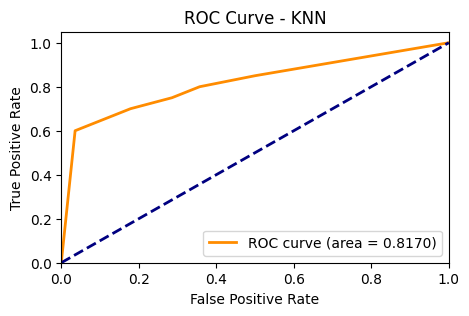

Split 2 - SVC:

Mejores Hiperparámetros:  {'svc__C': 1, 'svc__gamma': 'scale', 'svc__kernel': 'poly'}
Matriz de Confusión - SVC:



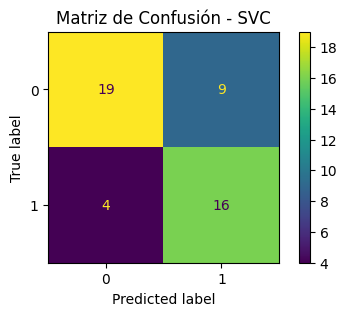

Puntuación F1 (Weighted): 0.7309
Precisión (Weighted): 0.7486
Recall (Weighted): 0.7292
AUC-ROC (Weighted): 0.8875



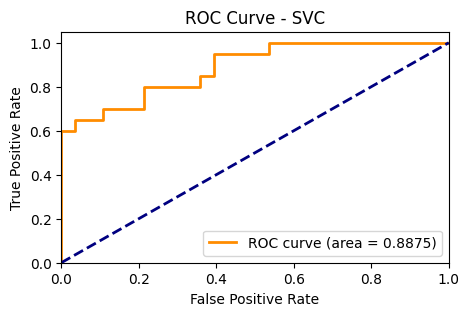

Split 3 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 30}
Matriz de Confusión - DecisionTree:



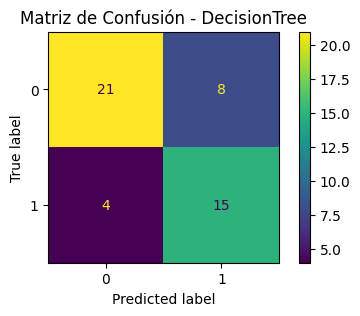

Puntuación F1 (Weighted): 0.7526
Precisión (Weighted): 0.7657
Recall (Weighted): 0.7500
AUC-ROC (Weighted): 0.7568



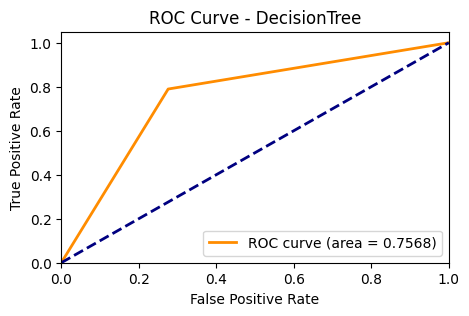

Split 3 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 1.0, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



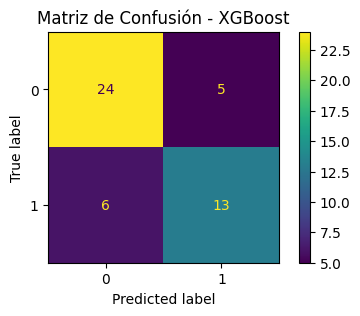

Puntuación F1 (Weighted): 0.7697
Precisión (Weighted): 0.7692
Recall (Weighted): 0.7708
AUC-ROC (Weighted): 0.8838



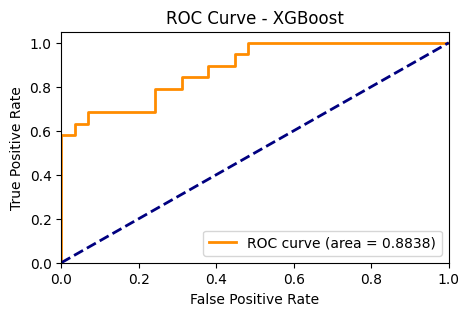

Split 3 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



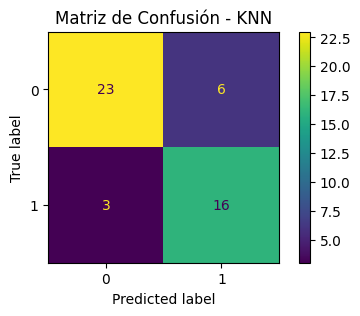

Puntuación F1 (Weighted): 0.8142
Precisión (Weighted): 0.8223
Recall (Weighted): 0.8125
AUC-ROC (Weighted): 0.9220



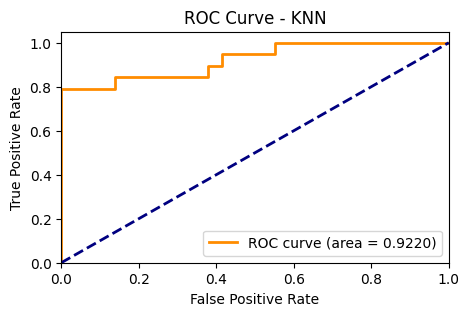

Split 3 - SVC:

Mejores Hiperparámetros:  {'svc__C': 1, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



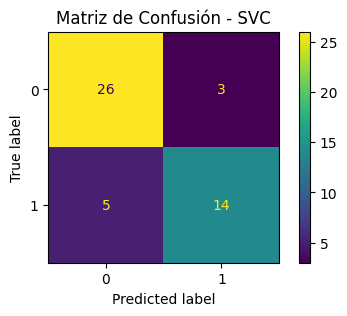

Puntuación F1 (Weighted): 0.8315
Precisión (Weighted): 0.8327
Recall (Weighted): 0.8333
AUC-ROC (Weighted): 0.9093



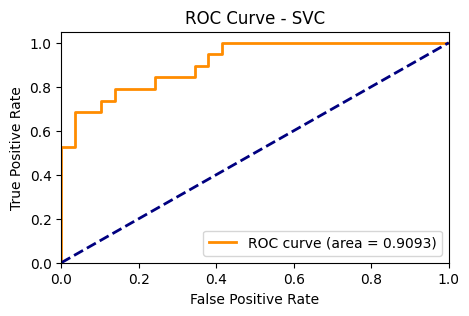

Split 4 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 30}
Matriz de Confusión - DecisionTree:



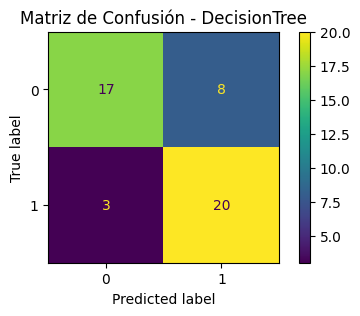

Puntuación F1 (Weighted): 0.7693
Precisión (Weighted): 0.7850
Recall (Weighted): 0.7708
AUC-ROC (Weighted): 0.7748



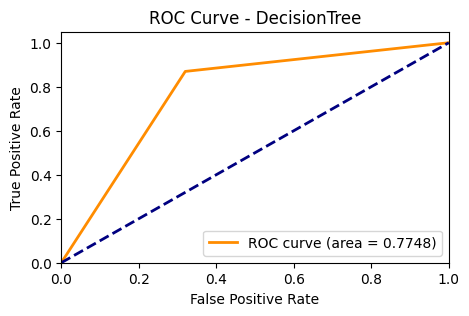

Split 4 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



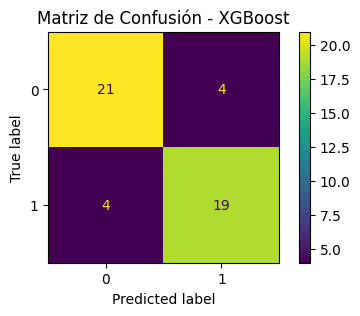

Puntuación F1 (Weighted): 0.8333
Precisión (Weighted): 0.8333
Recall (Weighted): 0.8333
AUC-ROC (Weighted): 0.8765



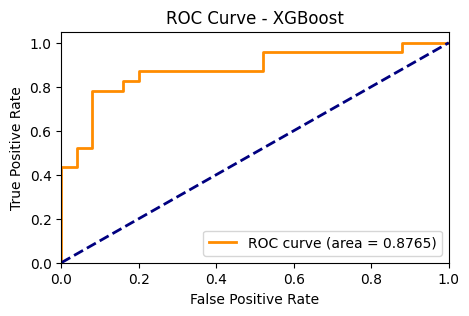

Split 4 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'euclidean', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



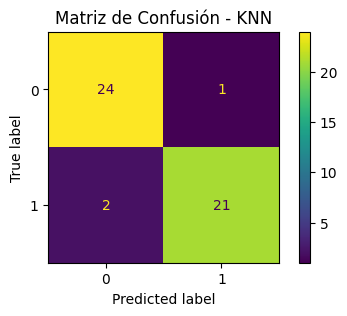

Puntuación F1 (Weighted): 0.9374
Precisión (Weighted): 0.9382
Recall (Weighted): 0.9375
AUC-ROC (Weighted): 0.9539



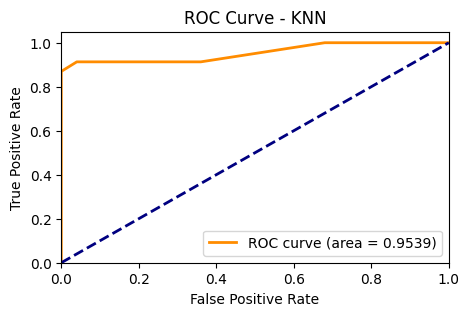

Split 4 - SVC:

Mejores Hiperparámetros:  {'svc__C': 1, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



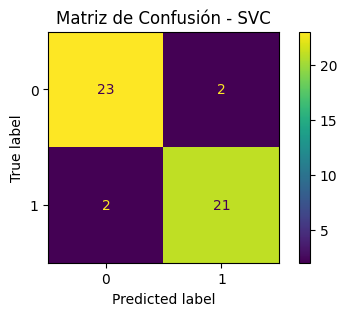

Puntuación F1 (Weighted): 0.9167
Precisión (Weighted): 0.9167
Recall (Weighted): 0.9167
AUC-ROC (Weighted): 0.9252



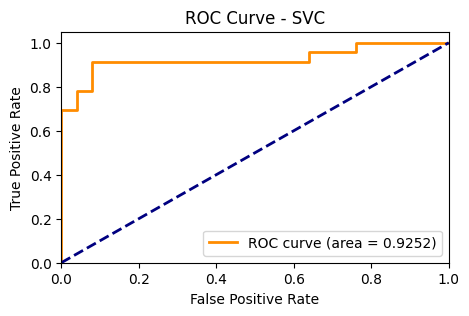

Split 5 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': None}
Matriz de Confusión - DecisionTree:



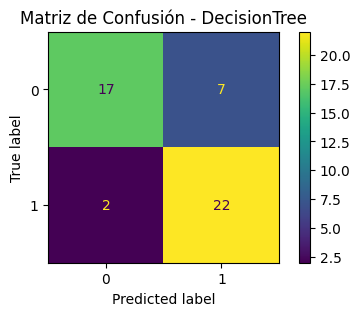

Puntuación F1 (Weighted): 0.8104
Precisión (Weighted): 0.8267
Recall (Weighted): 0.8125
AUC-ROC (Weighted): 0.8125



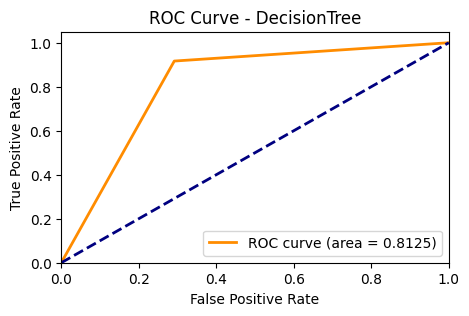

Split 5 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



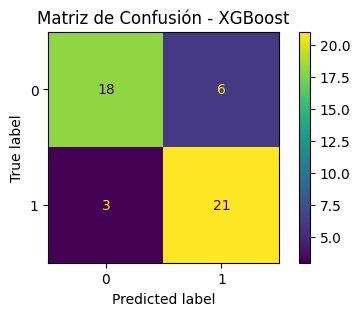

Puntuación F1 (Weighted): 0.8118
Precisión (Weighted): 0.8175
Recall (Weighted): 0.8125
AUC-ROC (Weighted): 0.8785



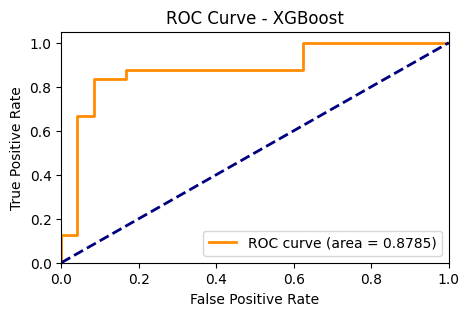

Split 5 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'euclidean', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



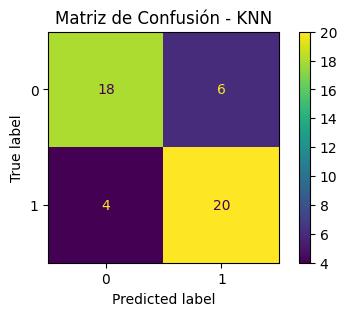

Puntuación F1 (Weighted): 0.7913
Precisión (Weighted): 0.7937
Recall (Weighted): 0.7917
AUC-ROC (Weighted): 0.8819



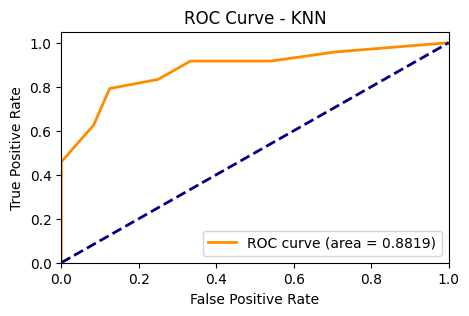

Split 5 - SVC:

Mejores Hiperparámetros:  {'svc__C': 0.1, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



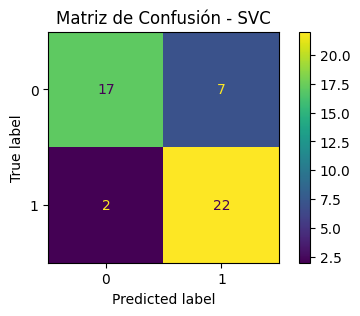

Puntuación F1 (Weighted): 0.8104
Precisión (Weighted): 0.8267
Recall (Weighted): 0.8125
AUC-ROC (Weighted): 0.9045



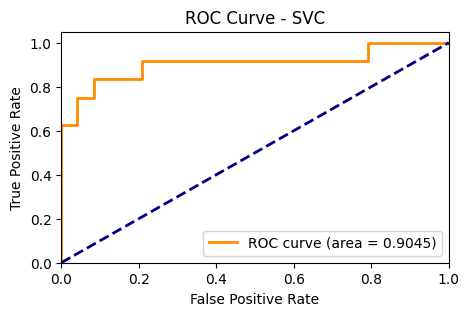

Resultados generales para DecisionTree:

Puntuación F1 Media: 0.7620
Desviación Estándar de F1: 0.0275
Precisión Media: 0.7713
Desviación Estándar de Precisión: 0.0334
Recall Medio: 0.7625
Desviación Estándar de Recall: 0.0283
AUC-ROC Medio: 0.7624
Desviación Estándar de AUC-ROC: 0.0311

Resultados generales para XGBoost:

Puntuación F1 Media: 0.8162
Desviación Estándar de F1: 0.0361
Precisión Media: 0.8179
Desviación Estándar de Precisión: 0.0371
Recall Medio: 0.8167
Desviación Estándar de Recall: 0.0358
AUC-ROC Medio: 0.8881
Desviación Estándar de AUC-ROC: 0.0235

Resultados generales para KNN:

Puntuación F1 Media: 0.8255
Desviación Estándar de F1: 0.0686
Precisión Media: 0.8305
Desviación Estándar de Precisión: 0.0669
Recall Medio: 0.8250
Desviación Estándar de Recall: 0.0692
AUC-ROC Medio: 0.8959
Desviación Estándar de AUC-ROC: 0.0459

Resultados generales para SVC:

Puntuación F1 Media: 0.8203
Desviación Estándar de F1: 0.0593
Precisión Media: 0.8284
Desviación Estándar de Precis

<ipython-input-10-4f61ceba55ee>:147: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.7620119168579836' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-10-4f61ceba55ee>:147: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.7713331769134361' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-10-4f61ceba55ee>:147: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.7625' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-10-4f61ceba55ee>:147: FutureWarning: Setting an item of incompatible dtype is deprecated

In [ ]:
dataset1_best_model = evaluate_models(dataset1_undersampled, 'heart_disease', 0)

## Dataset 2

Evaluación del Modelo:

Split 1 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 30}
Matriz de Confusión - DecisionTree:



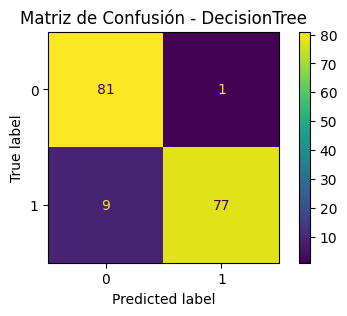

Puntuación F1 (Weighted): 0.9404
Precisión (Weighted): 0.9446
Recall (Weighted): 0.9405
AUC-ROC (Weighted): 0.9416



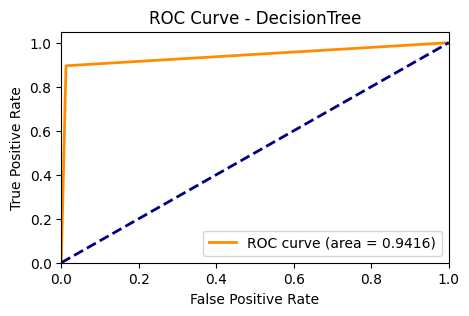

Split 1 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 1.0, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 6, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



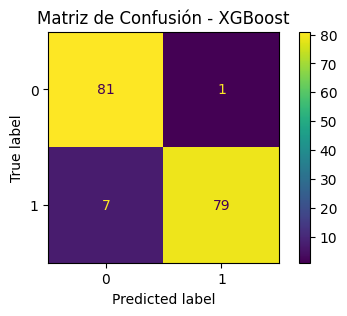

Puntuación F1 (Weighted): 0.9524
Precisión (Weighted): 0.9548
Recall (Weighted): 0.9524
AUC-ROC (Weighted): 0.9938



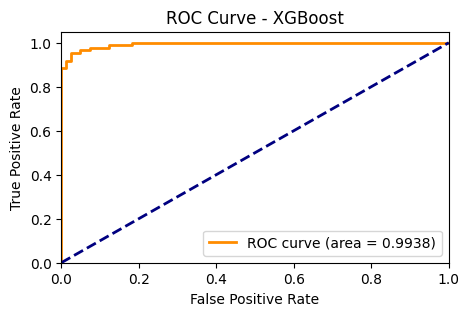

Split 1 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 5, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



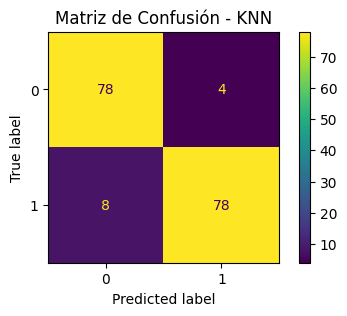

Puntuación F1 (Weighted): 0.9286
Precisión (Weighted): 0.9296
Recall (Weighted): 0.9286
AUC-ROC (Weighted): 0.9838



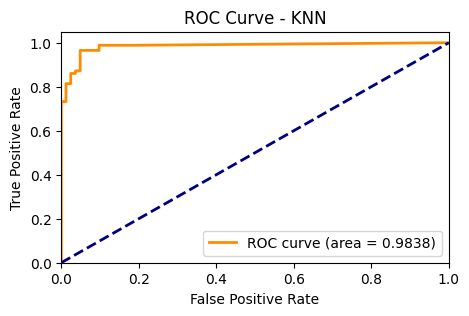

Split 1 - SVC:

Mejores Hiperparámetros:  {'svc__C': 1, 'svc__gamma': 'scale', 'svc__kernel': 'linear'}
Matriz de Confusión - SVC:



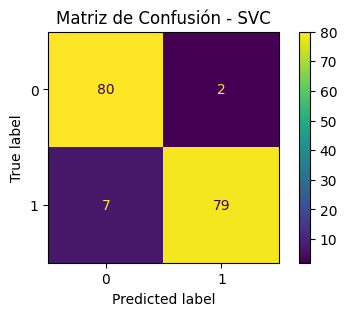

Puntuación F1 (Weighted): 0.9464
Precisión (Weighted): 0.9481
Recall (Weighted): 0.9464
AUC-ROC (Weighted): 0.9889



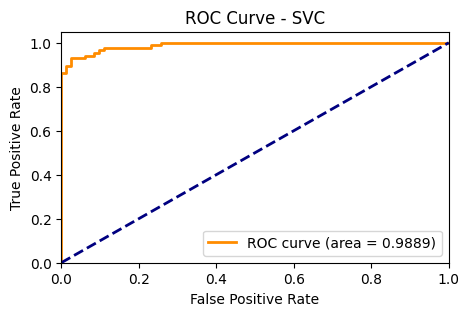

Split 2 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 30}
Matriz de Confusión - DecisionTree:



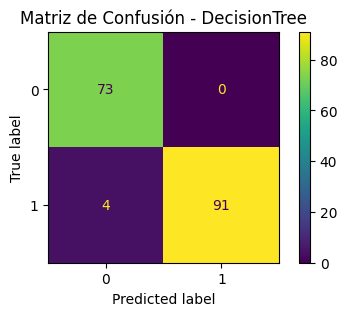

Puntuación F1 (Weighted): 0.9763
Precisión (Weighted): 0.9774
Recall (Weighted): 0.9762
AUC-ROC (Weighted): 0.9789



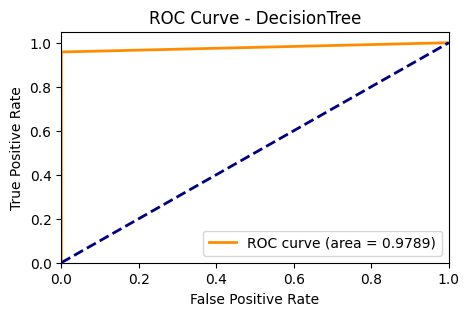

Split 2 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



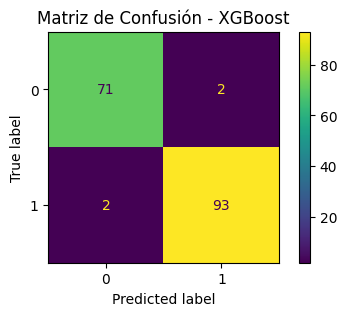

Puntuación F1 (Weighted): 0.9762
Precisión (Weighted): 0.9762
Recall (Weighted): 0.9762
AUC-ROC (Weighted): 0.9974



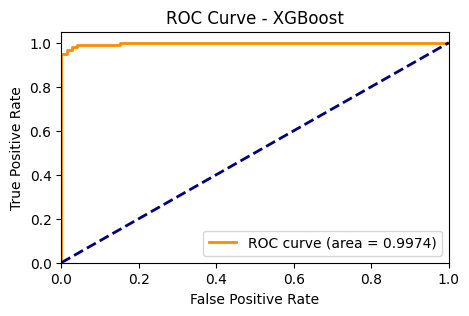

Split 2 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



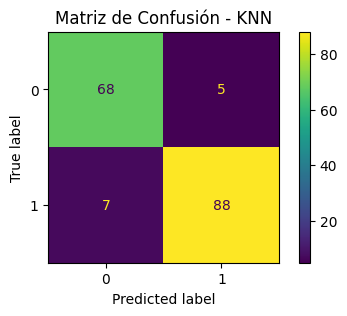

Puntuación F1 (Weighted): 0.9287
Precisión (Weighted): 0.9290
Recall (Weighted): 0.9286
AUC-ROC (Weighted): 0.9836



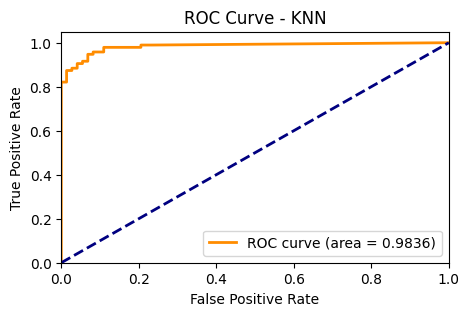

Split 2 - SVC:

Mejores Hiperparámetros:  {'svc__C': 10, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



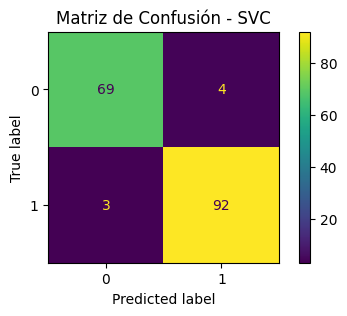

Puntuación F1 (Weighted): 0.9583
Precisión (Weighted): 0.9583
Recall (Weighted): 0.9583
AUC-ROC (Weighted): 0.9898



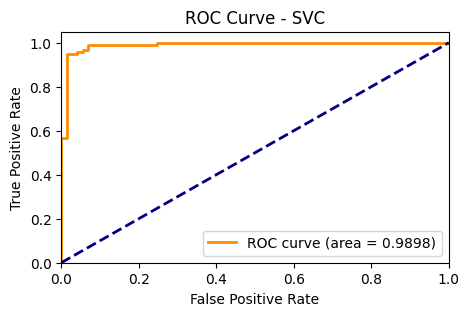

Split 3 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': None}
Matriz de Confusión - DecisionTree:



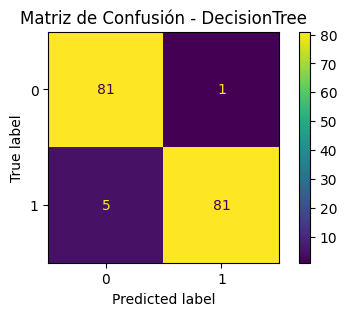

Puntuación F1 (Weighted): 0.9643
Precisión (Weighted): 0.9654
Recall (Weighted): 0.9643
AUC-ROC (Weighted): 0.9648



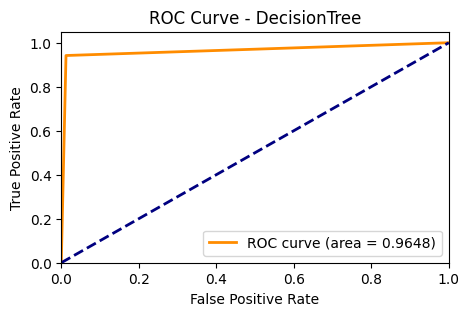

Split 3 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 9, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



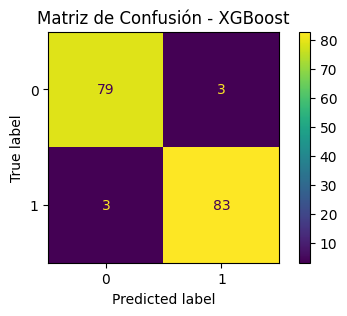

Puntuación F1 (Weighted): 0.9643
Precisión (Weighted): 0.9643
Recall (Weighted): 0.9643
AUC-ROC (Weighted): 0.9969



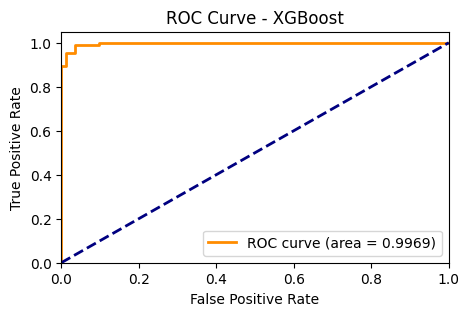

Split 3 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



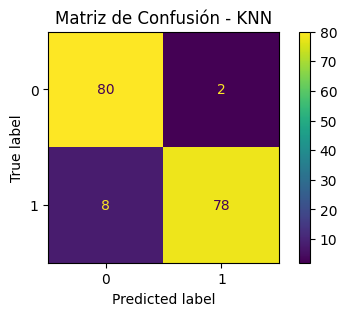

Puntuación F1 (Weighted): 0.9405
Precisión (Weighted): 0.9428
Recall (Weighted): 0.9405
AUC-ROC (Weighted): 0.9879



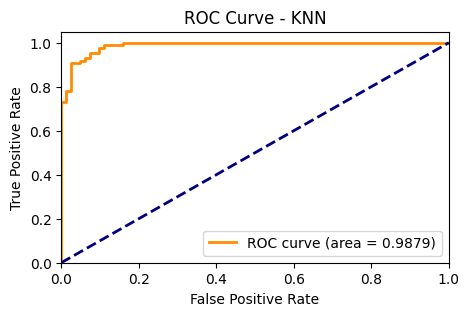

Split 3 - SVC:

Mejores Hiperparámetros:  {'svc__C': 0.1, 'svc__gamma': 'scale', 'svc__kernel': 'linear'}
Matriz de Confusión - SVC:



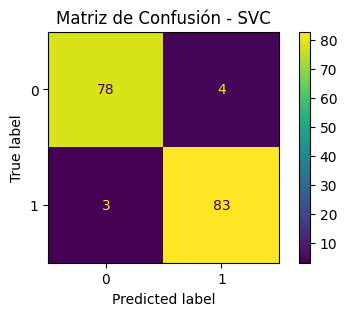

Puntuación F1 (Weighted): 0.9583
Precisión (Weighted): 0.9584
Recall (Weighted): 0.9583
AUC-ROC (Weighted): 0.9830



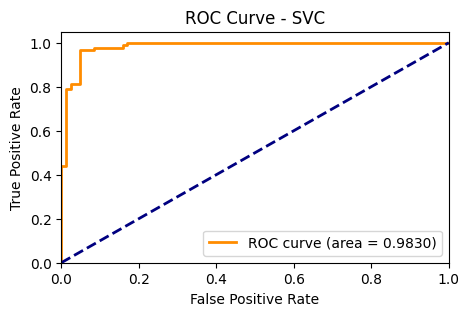

Split 4 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': None}
Matriz de Confusión - DecisionTree:



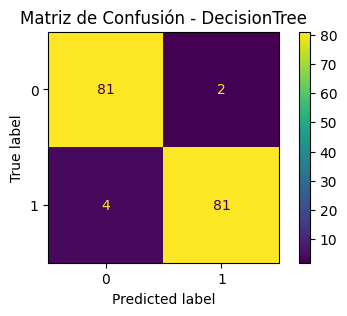

Puntuación F1 (Weighted): 0.9643
Precisión (Weighted): 0.9646
Recall (Weighted): 0.9643
AUC-ROC (Weighted): 0.9644



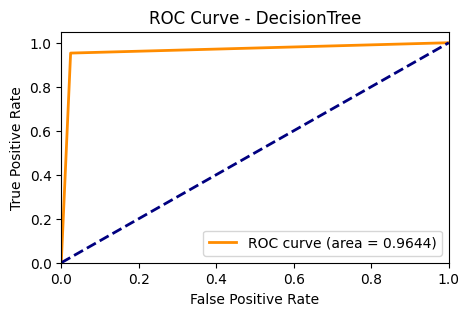

Split 4 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 6, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



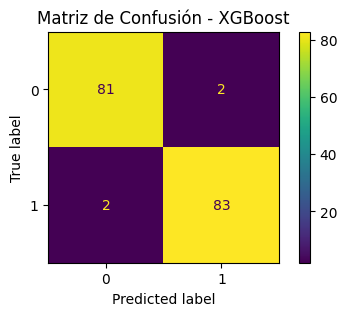

Puntuación F1 (Weighted): 0.9762
Precisión (Weighted): 0.9762
Recall (Weighted): 0.9762
AUC-ROC (Weighted): 0.9989



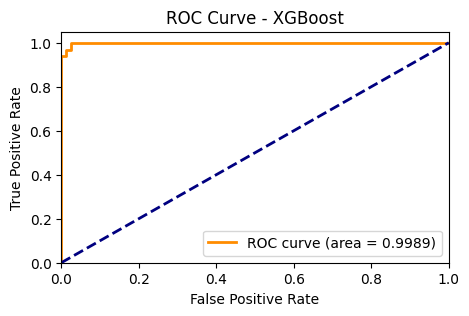

Split 4 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



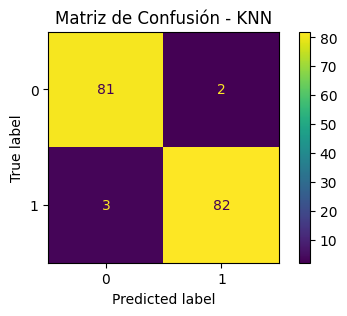

Puntuación F1 (Weighted): 0.9702
Precisión (Weighted): 0.9703
Recall (Weighted): 0.9702
AUC-ROC (Weighted): 0.9911



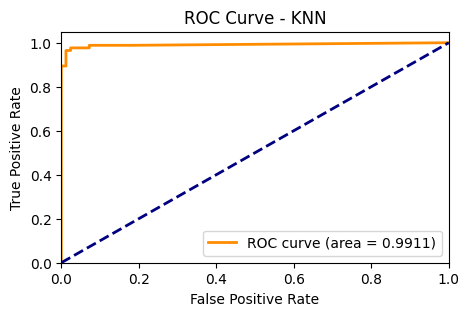

Split 4 - SVC:

Mejores Hiperparámetros:  {'svc__C': 0.1, 'svc__gamma': 'scale', 'svc__kernel': 'linear'}
Matriz de Confusión - SVC:



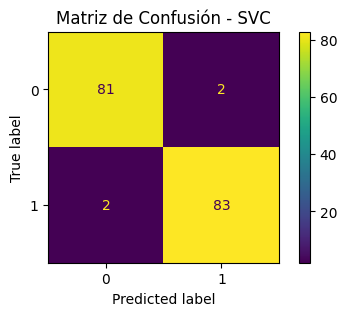

Puntuación F1 (Weighted): 0.9762
Precisión (Weighted): 0.9762
Recall (Weighted): 0.9762
AUC-ROC (Weighted): 0.9979



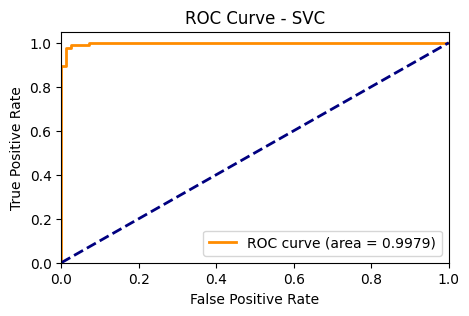

Split 5 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



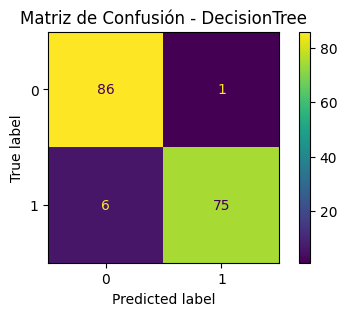

Puntuación F1 (Weighted): 0.9583
Precisión (Weighted): 0.9599
Recall (Weighted): 0.9583
AUC-ROC (Weighted): 0.9572



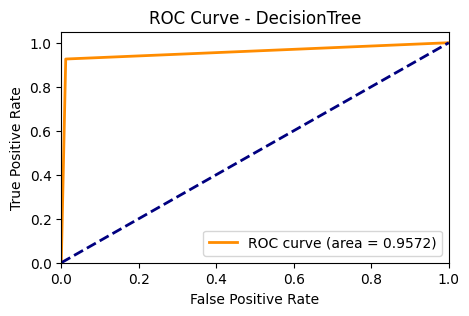

Split 5 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 1.0, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



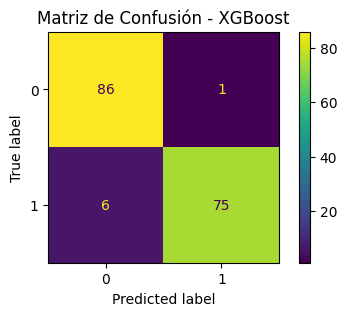

Puntuación F1 (Weighted): 0.9583
Precisión (Weighted): 0.9599
Recall (Weighted): 0.9583
AUC-ROC (Weighted): 0.9938



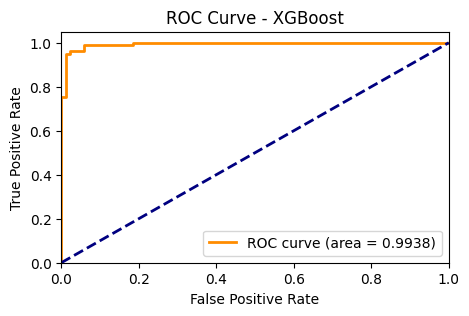

Split 5 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 3, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



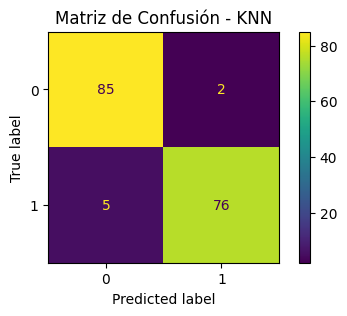

Puntuación F1 (Weighted): 0.9583
Precisión (Weighted): 0.9589
Recall (Weighted): 0.9583
AUC-ROC (Weighted): 0.9792



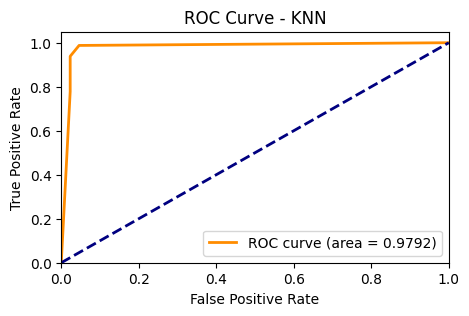

Split 5 - SVC:

Mejores Hiperparámetros:  {'svc__C': 1, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



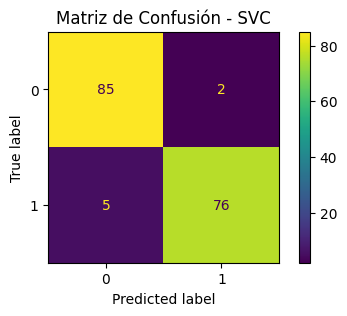

Puntuación F1 (Weighted): 0.9583
Precisión (Weighted): 0.9589
Recall (Weighted): 0.9583
AUC-ROC (Weighted): 0.9945



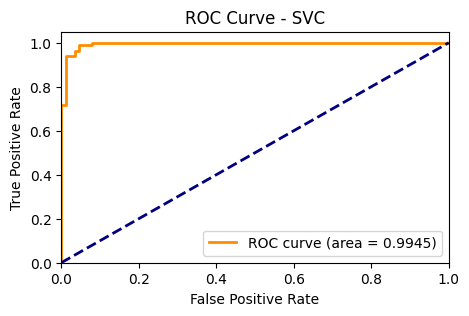

Resultados generales para DecisionTree:

Puntuación F1 Media: 0.9607
Desviación Estándar de F1: 0.0117
Precisión Media: 0.9624
Desviación Estándar de Precisión: 0.0106
Recall Medio: 0.9607
Desviación Estándar de Recall: 0.0117
AUC-ROC Medio: 0.9614
Desviación Estándar de AUC-ROC: 0.0122

Resultados generales para XGBoost:

Puntuación F1 Media: 0.9655
Desviación Estándar de F1: 0.0095
Precisión Media: 0.9663
Desviación Estándar de Precisión: 0.0086
Recall Medio: 0.9655
Desviación Estándar de Recall: 0.0095
AUC-ROC Medio: 0.9961
Desviación Estándar de AUC-ROC: 0.0020

Resultados generales para KNN:

Puntuación F1 Media: 0.9452
Desviación Estándar de F1: 0.0166
Precisión Media: 0.9461
Desviación Estándar de Precisión: 0.0163
Recall Medio: 0.9452
Desviación Estándar de Recall: 0.0166
AUC-ROC Medio: 0.9851
Desviación Estándar de AUC-ROC: 0.0041

Resultados generales para SVC:

Puntuación F1 Media: 0.9595
Desviación Estándar de F1: 0.0095
Precisión Media: 0.9600
Desviación Estándar de Precis

In [ ]:
dataset2_best_model = evaluate_models(dataset2_undersampled, 'target', 1)

## Dataset 3

Evaluación del Modelo:

Split 1 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': None}
Matriz de Confusión - DecisionTree:



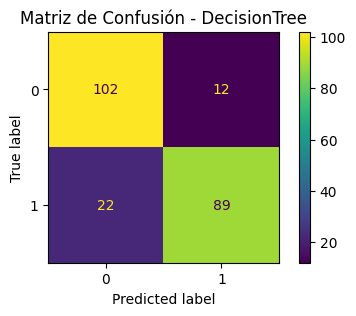

Puntuación F1 (Weighted): 0.8485
Precisión (Weighted): 0.8515
Recall (Weighted): 0.8489
AUC-ROC (Weighted): 0.8483



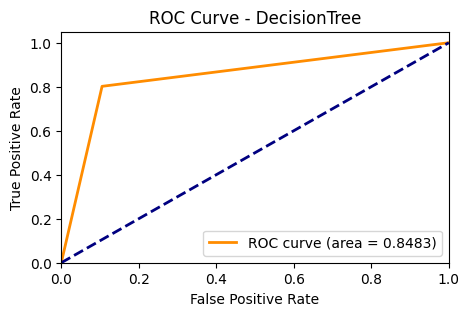

Split 1 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



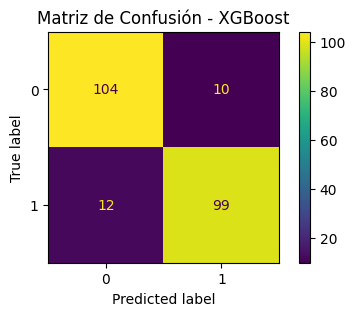

Puntuación F1 (Weighted): 0.9022
Precisión (Weighted): 0.9023
Recall (Weighted): 0.9022
AUC-ROC (Weighted): 0.9363



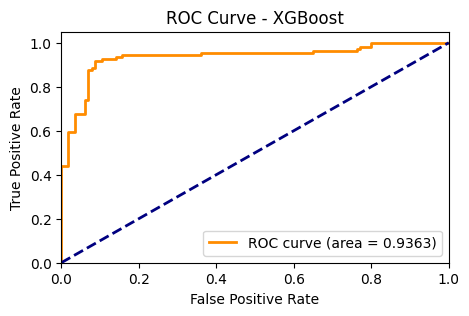

Split 1 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



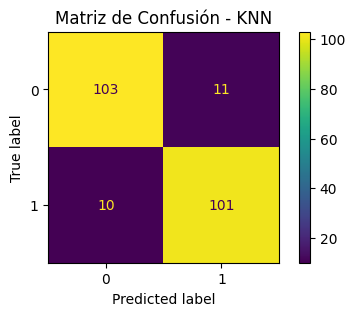

Puntuación F1 (Weighted): 0.9067
Precisión (Weighted): 0.9067
Recall (Weighted): 0.9067
AUC-ROC (Weighted): 0.9467



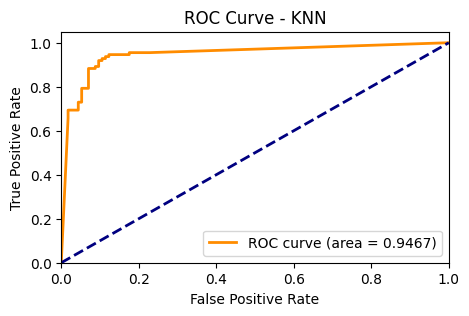

Split 1 - SVC:

Mejores Hiperparámetros:  {'svc__C': 10, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



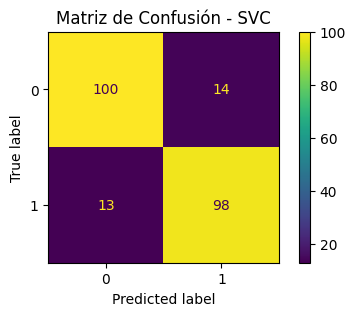

Puntuación F1 (Weighted): 0.8800
Precisión (Weighted): 0.8800
Recall (Weighted): 0.8800
AUC-ROC (Weighted): 0.9339



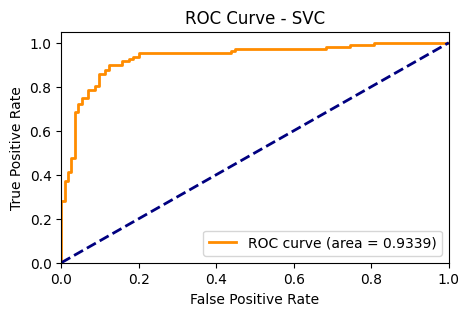

Split 2 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



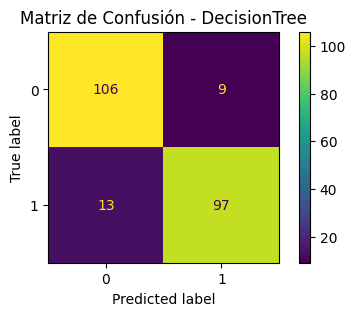

Puntuación F1 (Weighted): 0.9022
Precisión (Weighted): 0.9027
Recall (Weighted): 0.9022
AUC-ROC (Weighted): 0.9212



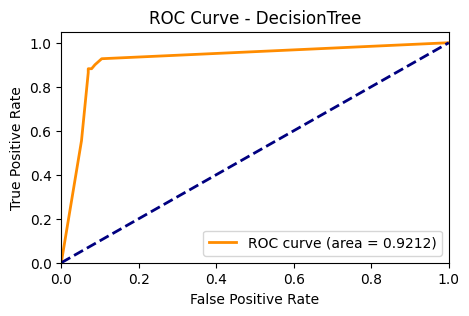

Split 2 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 9, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



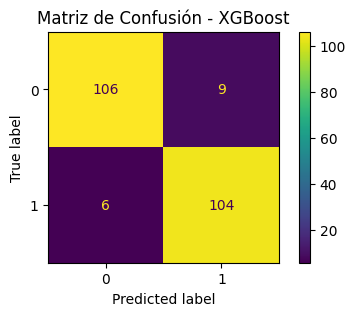

Puntuación F1 (Weighted): 0.9333
Precisión (Weighted): 0.9337
Recall (Weighted): 0.9333
AUC-ROC (Weighted): 0.9583



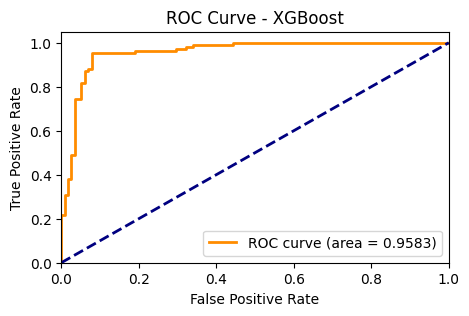

Split 2 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 5, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



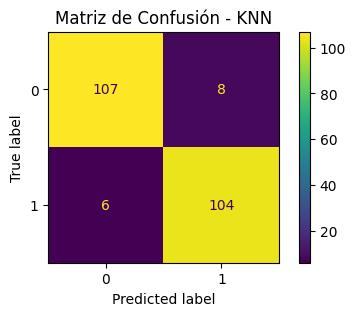

Puntuación F1 (Weighted): 0.9378
Precisión (Weighted): 0.9379
Recall (Weighted): 0.9378
AUC-ROC (Weighted): 0.9568



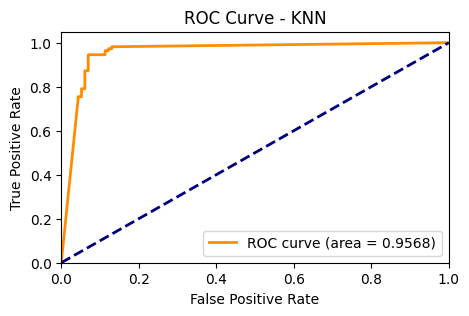

Split 2 - SVC:

Mejores Hiperparámetros:  {'svc__C': 10, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



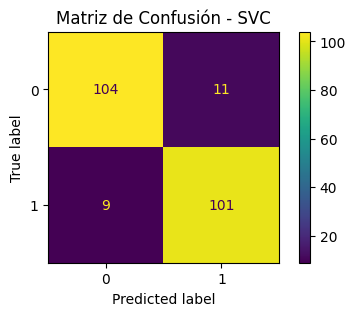

Puntuación F1 (Weighted): 0.9111
Precisión (Weighted): 0.9113
Recall (Weighted): 0.9111
AUC-ROC (Weighted): 0.9556



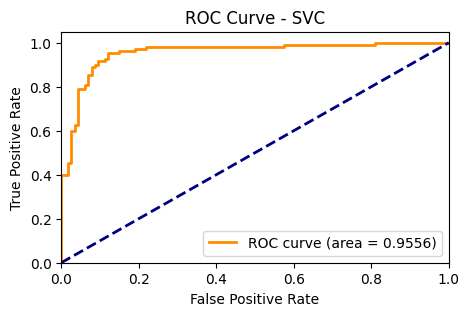

Split 3 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': None}
Matriz de Confusión - DecisionTree:



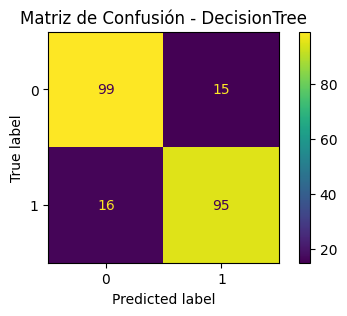

Puntuación F1 (Weighted): 0.8622
Precisión (Weighted): 0.8622
Recall (Weighted): 0.8622
AUC-ROC (Weighted): 0.8621



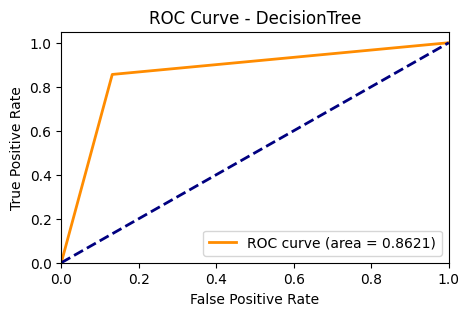

Split 3 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 9, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



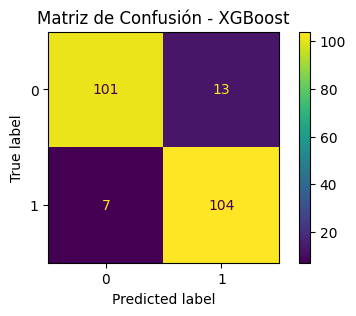

Puntuación F1 (Weighted): 0.9111
Precisión (Weighted): 0.9123
Recall (Weighted): 0.9111
AUC-ROC (Weighted): 0.9512



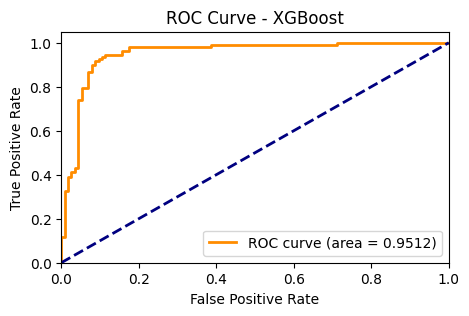

Split 3 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 5, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



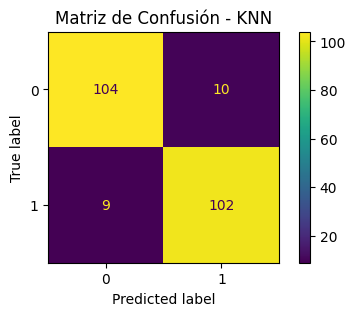

Puntuación F1 (Weighted): 0.9156
Precisión (Weighted): 0.9156
Recall (Weighted): 0.9156
AUC-ROC (Weighted): 0.9397



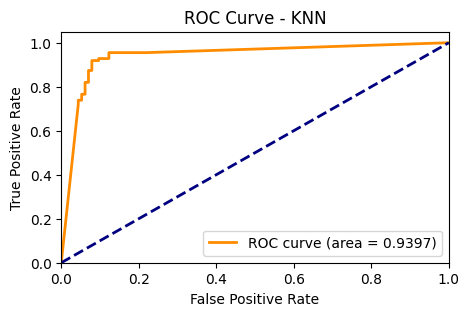

Split 3 - SVC:

Mejores Hiperparámetros:  {'svc__C': 10, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



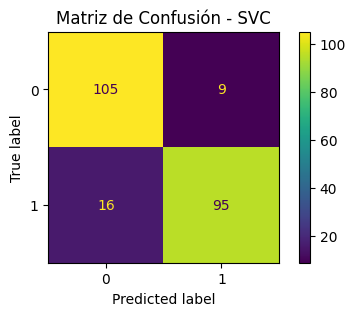

Puntuación F1 (Weighted): 0.8887
Precisión (Weighted): 0.8903
Recall (Weighted): 0.8889
AUC-ROC (Weighted): 0.9357



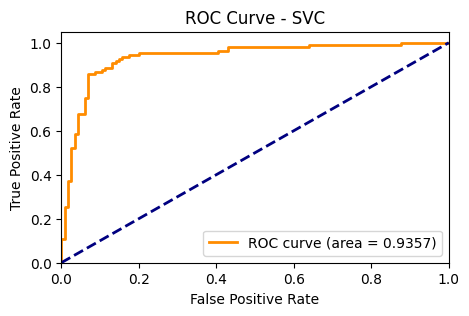

Split 4 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



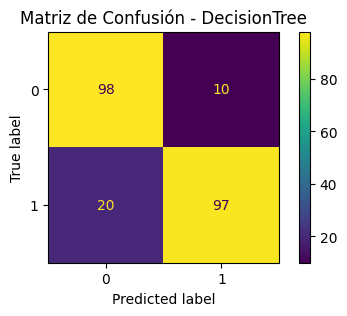

Puntuación F1 (Weighted): 0.8666
Precisión (Weighted): 0.8700
Recall (Weighted): 0.8667
AUC-ROC (Weighted): 0.8650



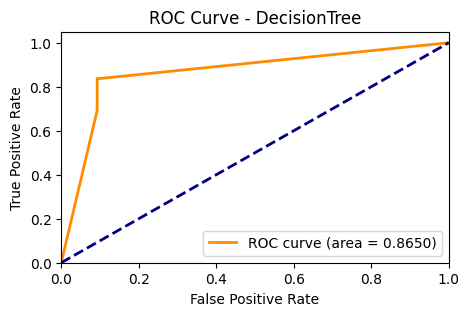

Split 4 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 1.0, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 9, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



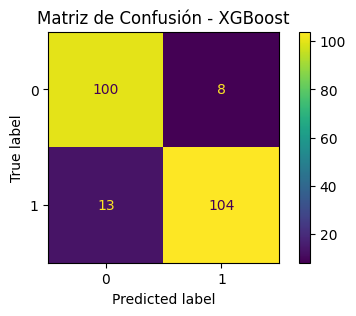

Puntuación F1 (Weighted): 0.9067
Precisión (Weighted): 0.9076
Recall (Weighted): 0.9067
AUC-ROC (Weighted): 0.9558



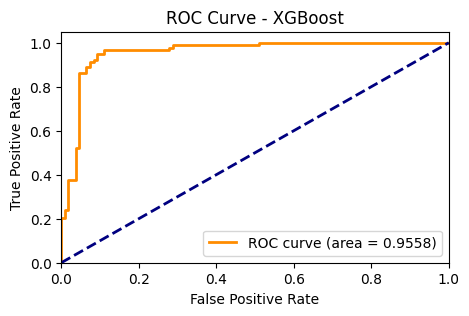

Split 4 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



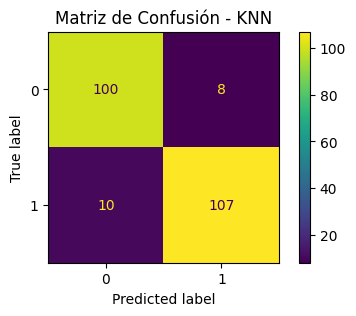

Puntuación F1 (Weighted): 0.9200
Precisión (Weighted): 0.9202
Recall (Weighted): 0.9200
AUC-ROC (Weighted): 0.9582



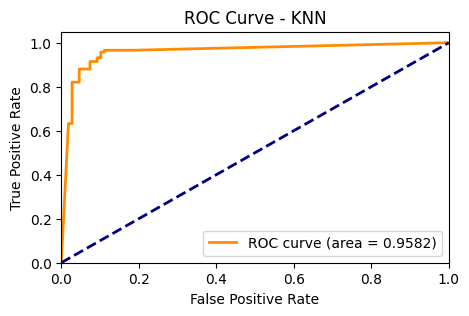

Split 4 - SVC:

Mejores Hiperparámetros:  {'svc__C': 10, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



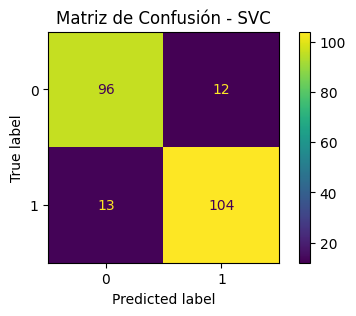

Puntuación F1 (Weighted): 0.8889
Precisión (Weighted): 0.8890
Recall (Weighted): 0.8889
AUC-ROC (Weighted): 0.9377



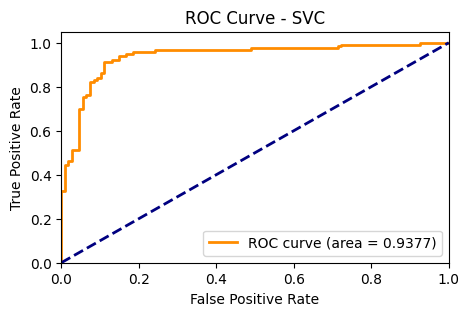

Split 5 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 30}
Matriz de Confusión - DecisionTree:



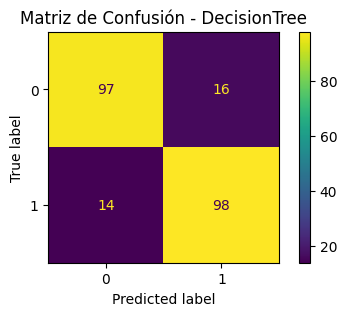

Puntuación F1 (Weighted): 0.8667
Precisión (Weighted): 0.8668
Recall (Weighted): 0.8667
AUC-ROC (Weighted): 0.8667



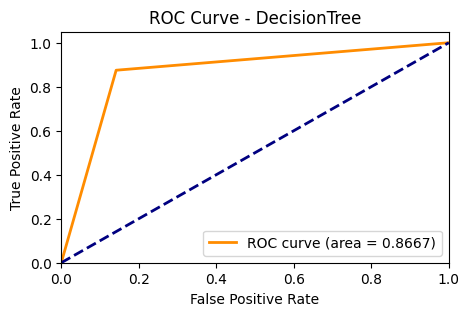

Split 5 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 9, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



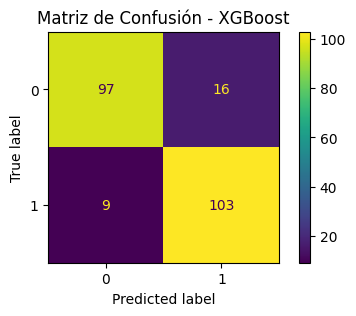

Puntuación F1 (Weighted): 0.8888
Precisión (Weighted): 0.8904
Recall (Weighted): 0.8889
AUC-ROC (Weighted): 0.9138



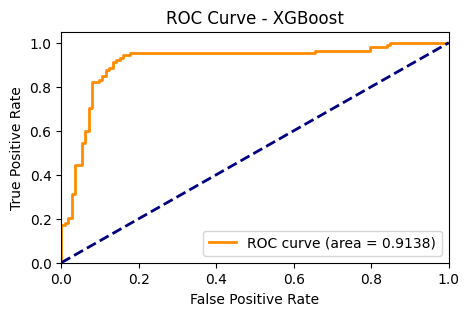

Split 5 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



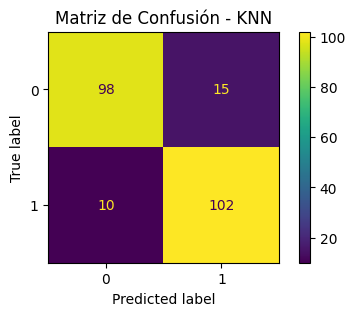

Puntuación F1 (Weighted): 0.8888
Precisión (Weighted): 0.8897
Recall (Weighted): 0.8889
AUC-ROC (Weighted): 0.9065



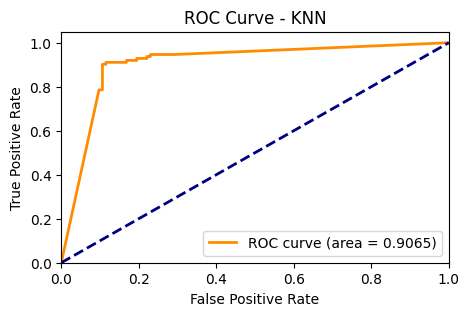

Split 5 - SVC:

Mejores Hiperparámetros:  {'svc__C': 1, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



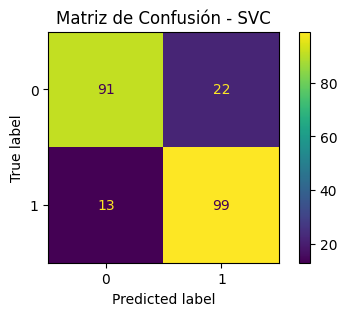

Puntuación F1 (Weighted): 0.8442
Precisión (Weighted): 0.8467
Recall (Weighted): 0.8444
AUC-ROC (Weighted): 0.8961



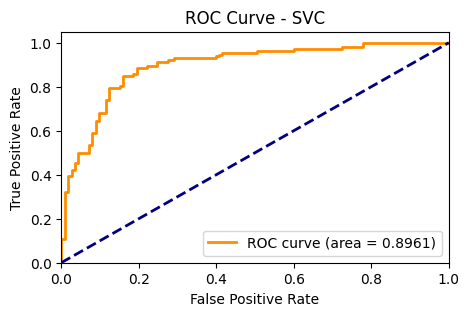

Resultados generales para DecisionTree:

Puntuación F1 Media: 0.8692
Desviación Estándar de F1: 0.0178
Precisión Media: 0.8706
Desviación Estándar de Precisión: 0.0172
Recall Medio: 0.8693
Desviación Estándar de Recall: 0.0177
AUC-ROC Medio: 0.8727
Desviación Estándar de AUC-ROC: 0.0251

Resultados generales para XGBoost:

Puntuación F1 Media: 0.9084
Desviación Estándar de F1: 0.0145
Precisión Media: 0.9093
Desviación Estándar de Precisión: 0.0142
Recall Medio: 0.9084
Desviación Estándar de Recall: 0.0145
AUC-ROC Medio: 0.9431
Desviación Estándar de AUC-ROC: 0.0165

Resultados generales para KNN:

Puntuación F1 Media: 0.9138
Desviación Estándar de F1: 0.0161
Precisión Media: 0.9140
Desviación Estándar de Precisión: 0.0159
Recall Medio: 0.9138
Desviación Estándar de Recall: 0.0160
AUC-ROC Medio: 0.9416
Desviación Estándar de AUC-ROC: 0.0188

Resultados generales para SVC:

Puntuación F1 Media: 0.8826
Desviación Estándar de F1: 0.0218
Precisión Media: 0.8835
Desviación Estándar de Precis

In [ ]:
dataset3_best_model = evaluate_models(dataset3_undersampled, 'target', 2)

## Dataset 4

Evaluación del Modelo:

Split 1 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 20}
Matriz de Confusión - DecisionTree:



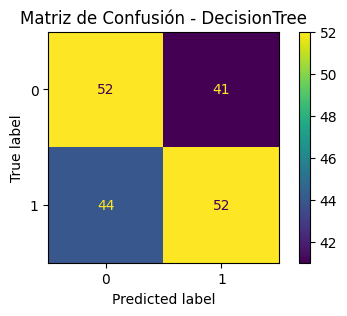

Puntuación F1 (Weighted): 0.5503
Precisión (Weighted): 0.5505
Recall (Weighted): 0.5503
AUC-ROC (Weighted): 0.5483



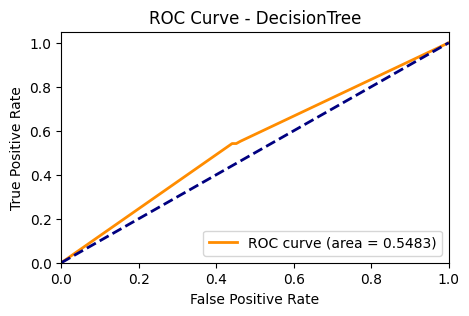

Split 1 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.01, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



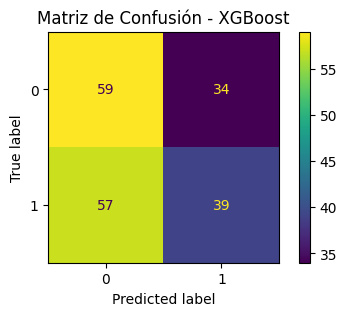

Puntuación F1 (Weighted): 0.5122
Precisión (Weighted): 0.5216
Recall (Weighted): 0.5185
AUC-ROC (Weighted): 0.5590



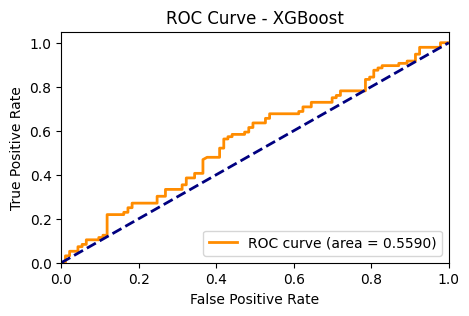

Split 1 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 3, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



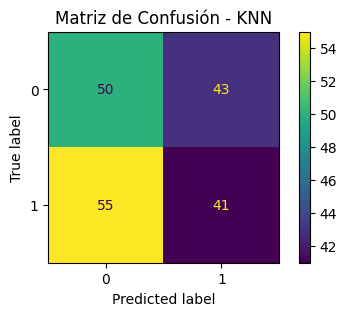

Puntuación F1 (Weighted): 0.4799
Precisión (Weighted): 0.4822
Recall (Weighted): 0.4815
AUC-ROC (Weighted): 0.4766



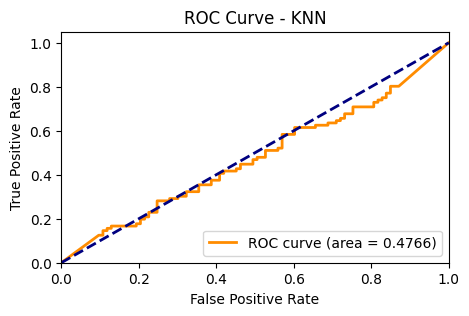

Split 1 - SVC:

Mejores Hiperparámetros:  {'svc__C': 1, 'svc__gamma': 'scale', 'svc__kernel': 'poly'}
Matriz de Confusión - SVC:



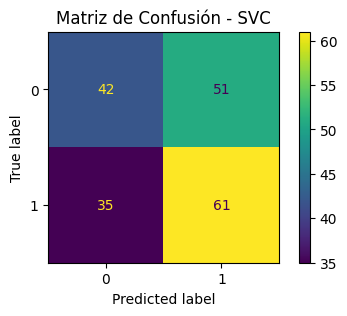

Puntuación F1 (Weighted): 0.5411
Precisión (Weighted): 0.5450
Recall (Weighted): 0.5450
AUC-ROC (Weighted): 0.4803



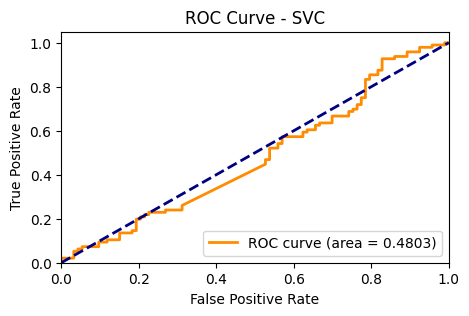

Split 2 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



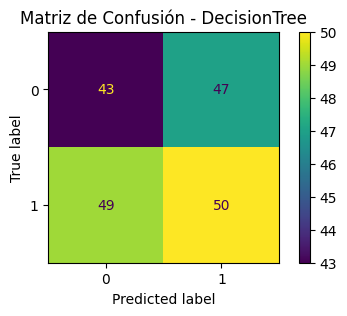

Puntuación F1 (Weighted): 0.4923
Precisión (Weighted): 0.4926
Recall (Weighted): 0.4921
AUC-ROC (Weighted): 0.4606



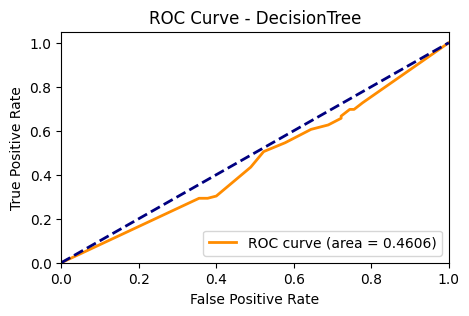

Split 2 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 1.0, 'xgbclassifier__learning_rate': 0.01, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



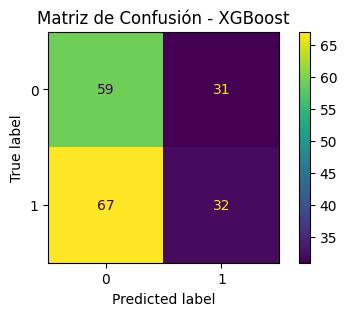

Puntuación F1 (Weighted): 0.4671
Precisión (Weighted): 0.4890
Recall (Weighted): 0.4815
AUC-ROC (Weighted): 0.4498



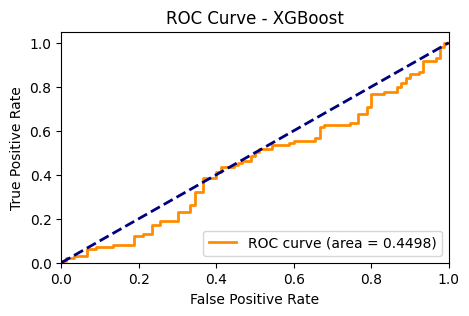

Split 2 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 5, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



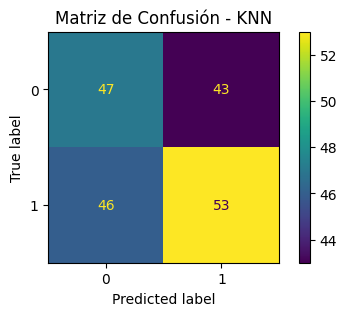

Puntuación F1 (Weighted): 0.5293
Precisión (Weighted): 0.5298
Recall (Weighted): 0.5291
AUC-ROC (Weighted): 0.5367



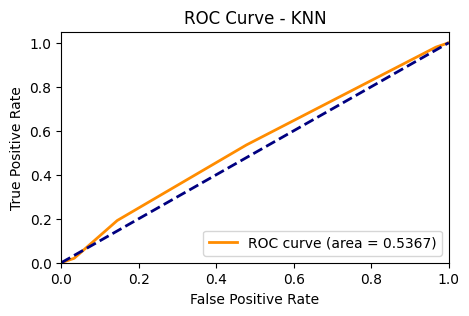

Split 2 - SVC:

Mejores Hiperparámetros:  {'svc__C': 10, 'svc__gamma': 'scale', 'svc__kernel': 'linear'}
Matriz de Confusión - SVC:



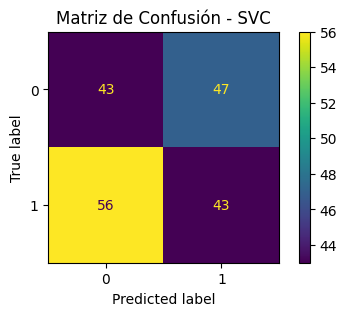

Puntuación F1 (Weighted): 0.4550
Precisión (Weighted): 0.4571
Recall (Weighted): 0.4550
AUC-ROC (Weighted): 0.4258



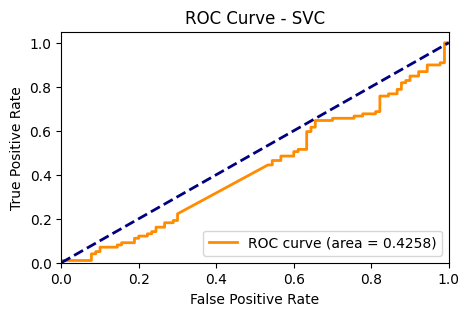

Split 3 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 30}
Matriz de Confusión - DecisionTree:



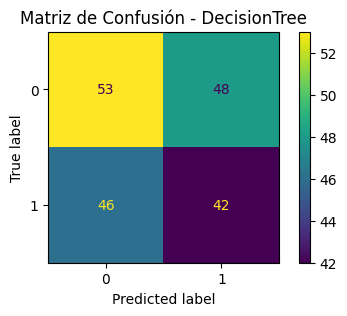

Puntuación F1 (Weighted): 0.5030
Precisión (Weighted): 0.5034
Recall (Weighted): 0.5026
AUC-ROC (Weighted): 0.5010



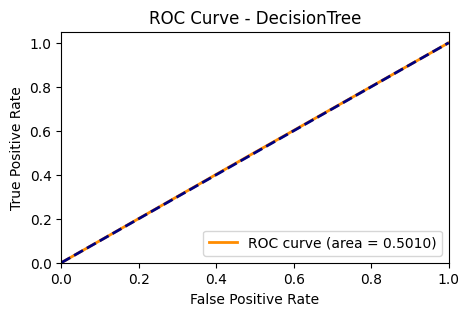

Split 3 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 1.0, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



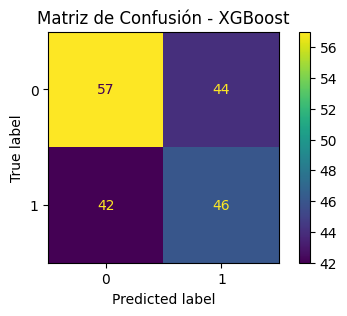

Puntuación F1 (Weighted): 0.5453
Precisión (Weighted): 0.5457
Recall (Weighted): 0.5450
AUC-ROC (Weighted): 0.5547



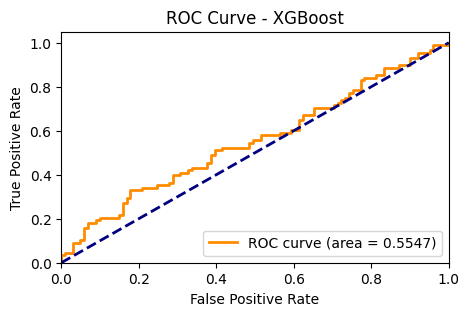

Split 3 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'euclidean', 'kneighborsclassifier__n_neighbors': 5, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



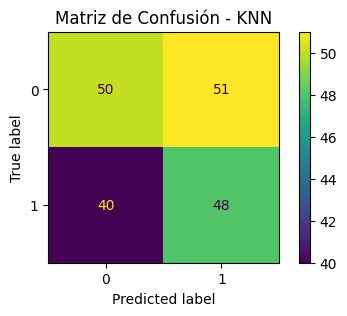

Puntuación F1 (Weighted): 0.5188
Precisión (Weighted): 0.5226
Recall (Weighted): 0.5185
AUC-ROC (Weighted): 0.5314



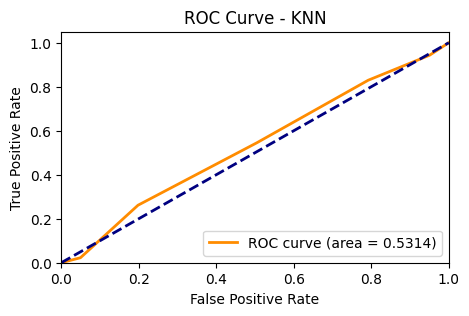

Split 3 - SVC:

Mejores Hiperparámetros:  {'svc__C': 10, 'svc__gamma': 'scale', 'svc__kernel': 'poly'}
Matriz de Confusión - SVC:



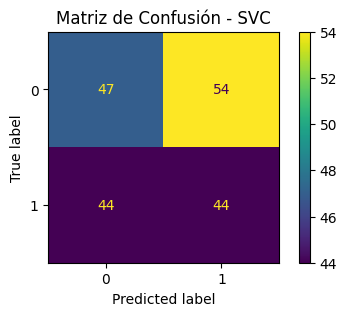

Puntuación F1 (Weighted): 0.4819
Precisión (Weighted): 0.4851
Recall (Weighted): 0.4815
AUC-ROC (Weighted): 0.4830



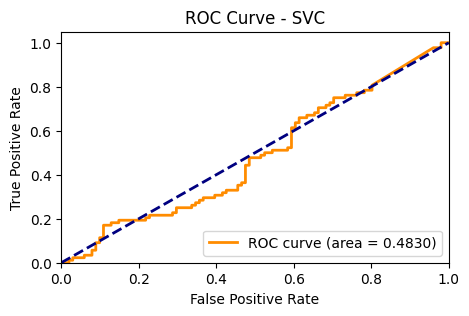

Split 4 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



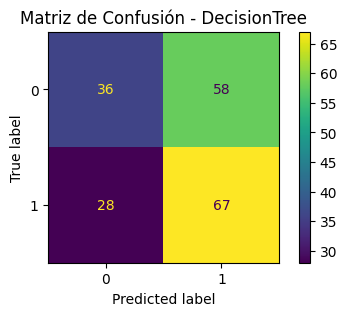

Puntuación F1 (Weighted): 0.5328
Precisión (Weighted): 0.5492
Recall (Weighted): 0.5450
AUC-ROC (Weighted): 0.5429



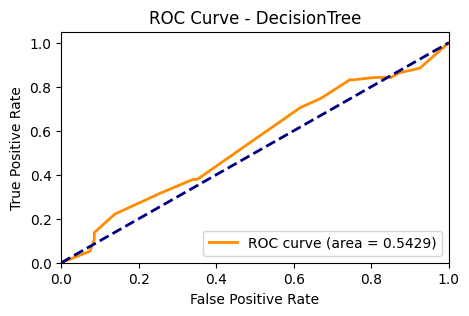

Split 4 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.01, 'xgbclassifier__max_depth': 6, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



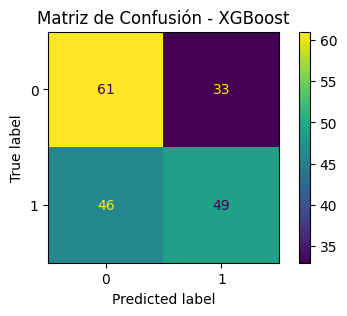

Puntuación F1 (Weighted): 0.5802
Precisión (Weighted): 0.5839
Recall (Weighted): 0.5820
AUC-ROC (Weighted): 0.5913



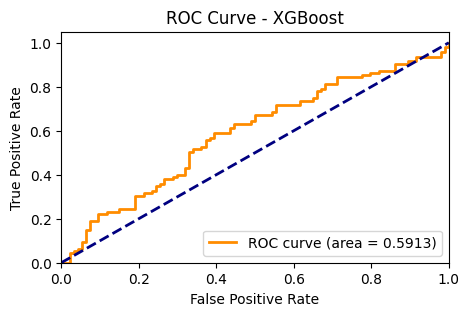

Split 4 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'euclidean', 'kneighborsclassifier__n_neighbors': 3, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



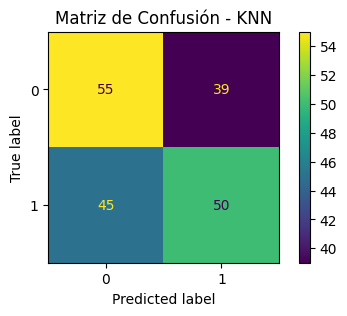

Puntuación F1 (Weighted): 0.5552
Precisión (Weighted): 0.5559
Recall (Weighted): 0.5556
AUC-ROC (Weighted): 0.5379



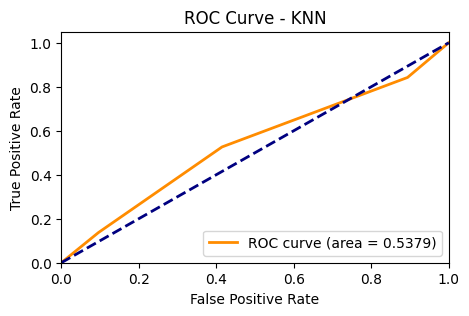

Split 4 - SVC:

Mejores Hiperparámetros:  {'svc__C': 10, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Matriz de Confusión - SVC:



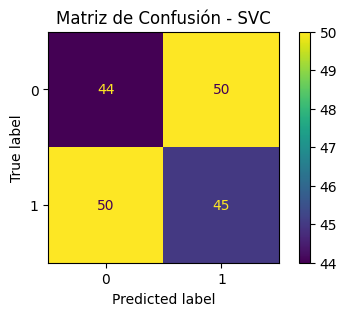

Puntuación F1 (Weighted): 0.4709
Precisión (Weighted): 0.4709
Recall (Weighted): 0.4709
AUC-ROC (Weighted): 0.4895



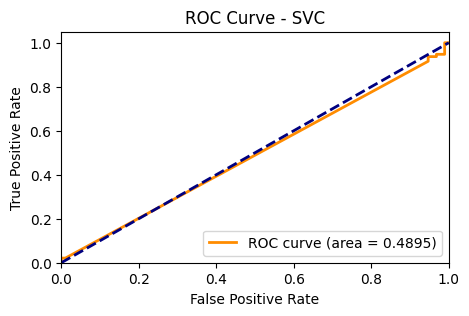

Split 5 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 30}
Matriz de Confusión - DecisionTree:



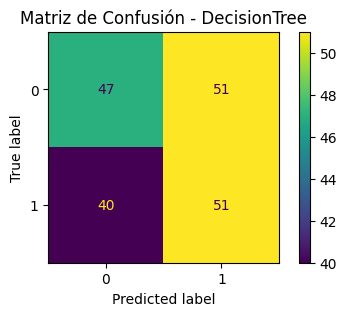

Puntuación F1 (Weighted): 0.5179
Precisión (Weighted): 0.5209
Recall (Weighted): 0.5185
AUC-ROC (Weighted): 0.5200



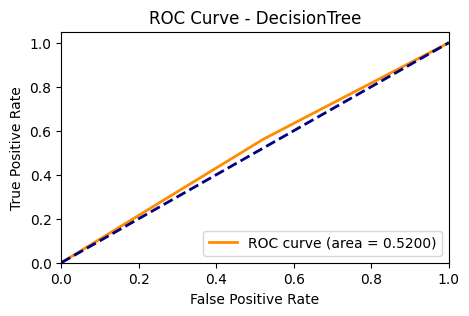

Split 5 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



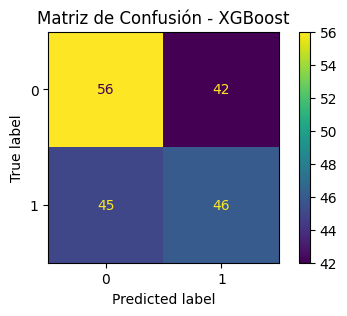

Puntuación F1 (Weighted): 0.5393
Precisión (Weighted): 0.5392
Recall (Weighted): 0.5397
AUC-ROC (Weighted): 0.5059



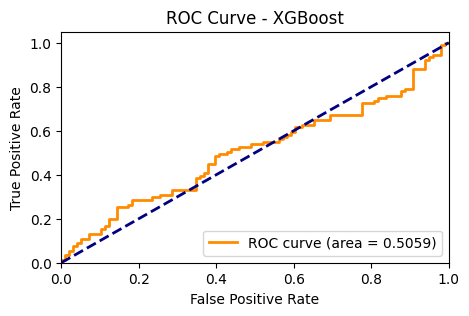

Split 5 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 5, 'kneighborsclassifier__weights': 'distance'}
Matriz de Confusión - KNN:



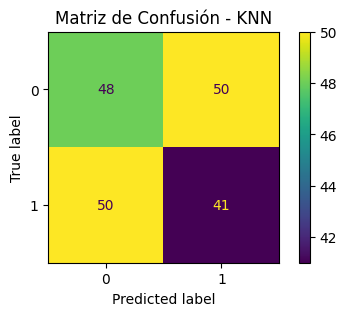

Puntuación F1 (Weighted): 0.4709
Precisión (Weighted): 0.4709
Recall (Weighted): 0.4709
AUC-ROC (Weighted): 0.4794



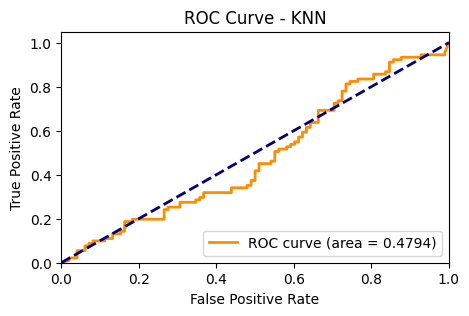

Split 5 - SVC:

Mejores Hiperparámetros:  {'svc__C': 10, 'svc__gamma': 'scale', 'svc__kernel': 'linear'}
Matriz de Confusión - SVC:



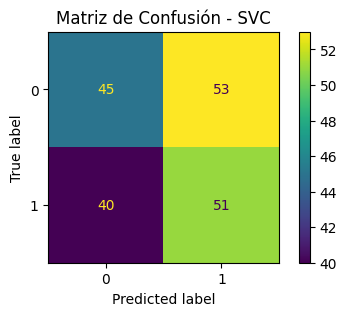

Puntuación F1 (Weighted): 0.5069
Precisión (Weighted): 0.5106
Recall (Weighted): 0.5079
AUC-ROC (Weighted): 0.4965



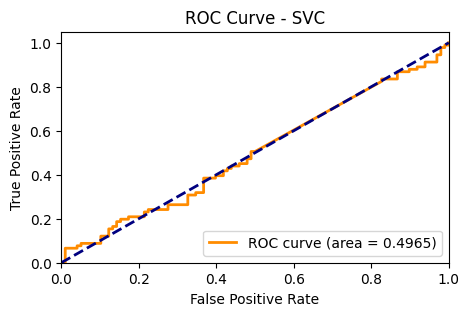

Resultados generales para DecisionTree:

Puntuación F1 Media: 0.5192
Desviación Estándar de F1: 0.0207
Precisión Media: 0.5233
Desviación Estándar de Precisión: 0.0235
Recall Medio: 0.5217
Desviación Estándar de Recall: 0.0228
AUC-ROC Medio: 0.5146
Desviación Estándar de AUC-ROC: 0.0318

Resultados generales para XGBoost:

Puntuación F1 Media: 0.5288
Desviación Estándar de F1: 0.0377
Precisión Media: 0.5359
Desviación Estándar de Precisión: 0.0310
Recall Medio: 0.5333
Desviación Estándar de Recall: 0.0330
AUC-ROC Medio: 0.5321
Desviación Estándar de AUC-ROC: 0.0494

Resultados generales para KNN:

Puntuación F1 Media: 0.5108
Desviación Estándar de F1: 0.0314
Precisión Media: 0.5123
Desviación Estándar de Precisión: 0.0314
Recall Medio: 0.5111
Desviación Estándar de Recall: 0.0311
AUC-ROC Medio: 0.5124
Desviación Estándar de AUC-ROC: 0.0282

Resultados generales para SVC:

Puntuación F1 Media: 0.4912
Desviación Estándar de F1: 0.0301
Precisión Media: 0.4937
Desviación Estándar de Precis

In [ ]:
dataset4_best_model = evaluate_models(dataset4_undersampled, 'TenYearCHD', 3)

## Dataset 5

Evaluación del Modelo:

Split 1 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



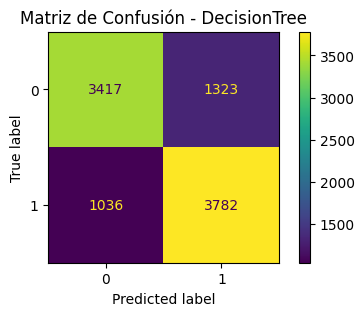

Puntuación F1 (Weighted): 0.7529
Precisión (Weighted): 0.7540
Recall (Weighted): 0.7532
AUC-ROC (Weighted): 0.8197



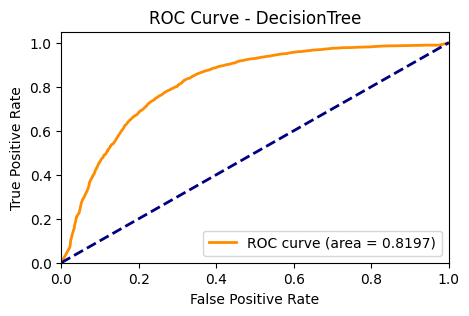

Split 1 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



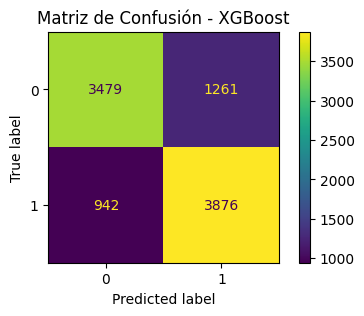

Puntuación F1 (Weighted): 0.7692
Precisión (Weighted): 0.7706
Recall (Weighted): 0.7695
AUC-ROC (Weighted): 0.8462



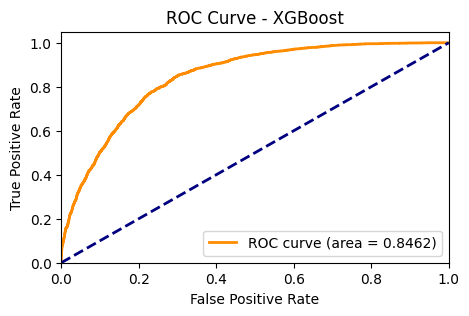

Split 1 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



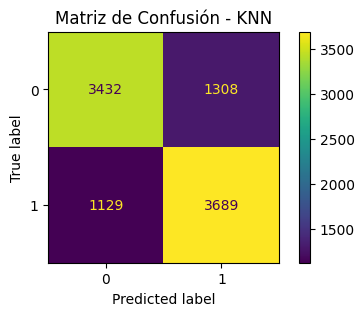

Puntuación F1 (Weighted): 0.7449
Precisión (Weighted): 0.7453
Recall (Weighted): 0.7450
AUC-ROC (Weighted): 0.8047



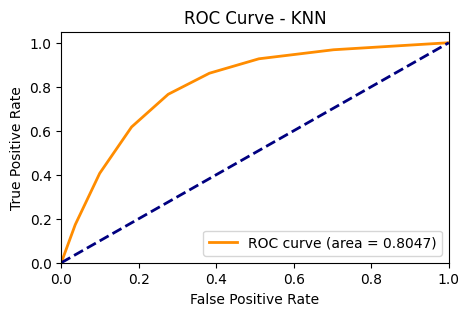

Split 1 - SVC:

SVC se entrenó con los parámetros predeterminados.
Matriz de Confusión - SVC:



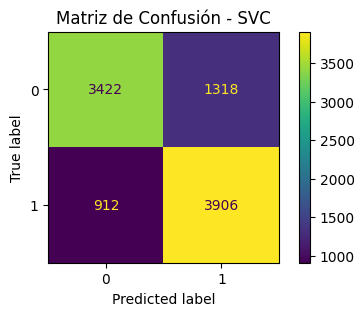

Puntuación F1 (Weighted): 0.7662
Precisión (Weighted): 0.7685
Recall (Weighted): 0.7667
AUC-ROC (Weighted): 0.8310



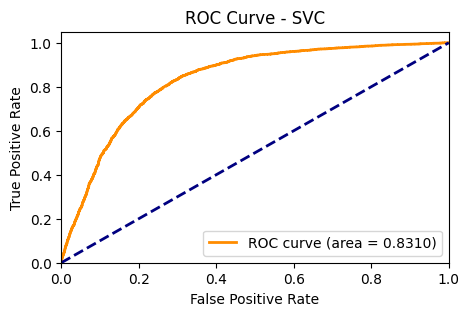

Split 2 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



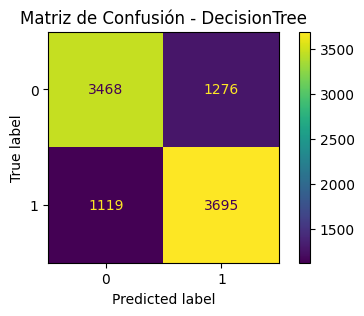

Puntuación F1 (Weighted): 0.7493
Precisión (Weighted): 0.7496
Recall (Weighted): 0.7494
AUC-ROC (Weighted): 0.8129



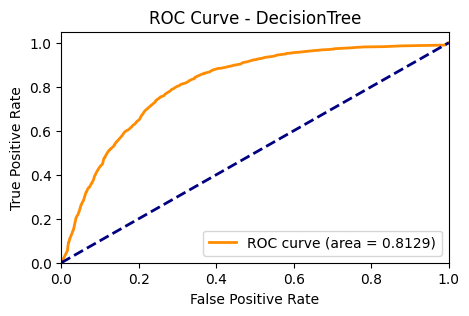

Split 2 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



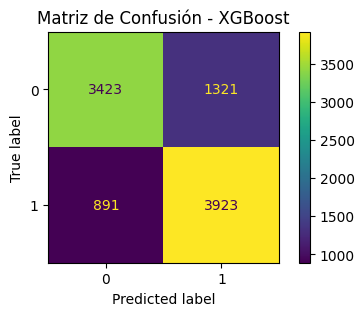

Puntuación F1 (Weighted): 0.7680
Precisión (Weighted): 0.7706
Recall (Weighted): 0.7686
AUC-ROC (Weighted): 0.8449



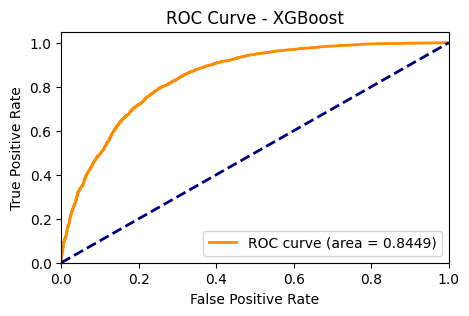

Split 2 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



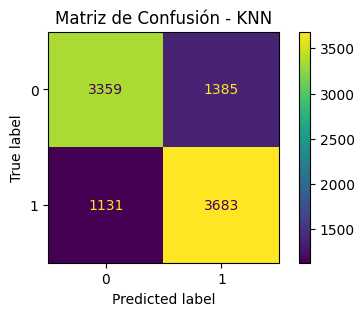

Puntuación F1 (Weighted): 0.7365
Precisión (Weighted): 0.7373
Recall (Weighted): 0.7368
AUC-ROC (Weighted): 0.8013



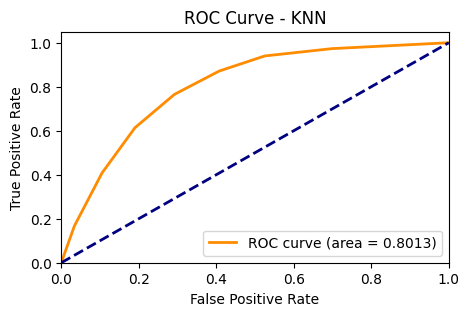

Split 2 - SVC:

SVC se entrenó con los parámetros predeterminados.
Matriz de Confusión - SVC:



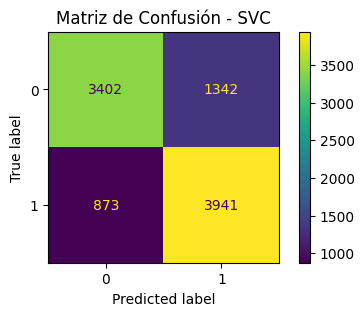

Puntuación F1 (Weighted): 0.7676
Precisión (Weighted): 0.7707
Recall (Weighted): 0.7683
AUC-ROC (Weighted): 0.8328



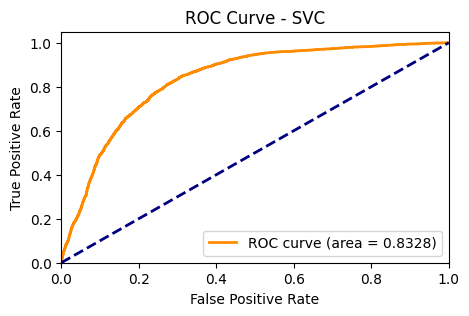

Split 3 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



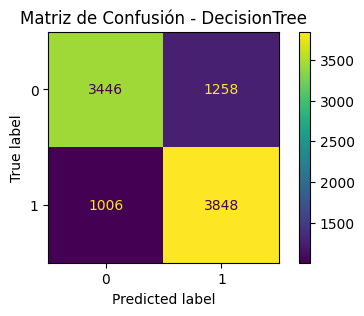

Puntuación F1 (Weighted): 0.7629
Precisión (Weighted): 0.7637
Recall (Weighted): 0.7631
AUC-ROC (Weighted): 0.8187



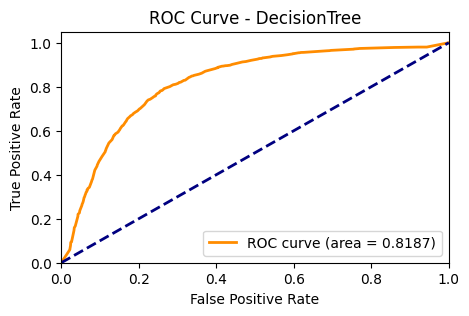

Split 3 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



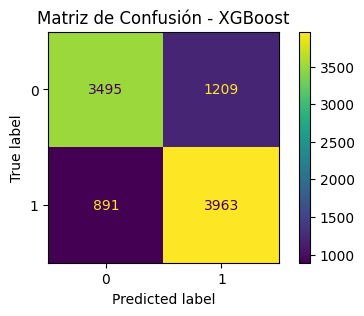

Puntuación F1 (Weighted): 0.7799
Precisión (Weighted): 0.7813
Recall (Weighted): 0.7803
AUC-ROC (Weighted): 0.8537



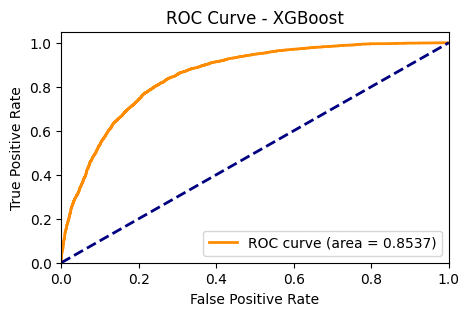

Split 3 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



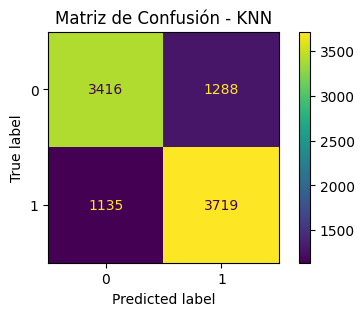

Puntuación F1 (Weighted): 0.7464
Precisión (Weighted): 0.7466
Recall (Weighted): 0.7465
AUC-ROC (Weighted): 0.8060



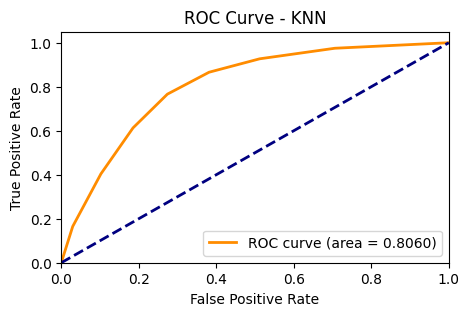

Split 3 - SVC:

SVC se entrenó con los parámetros predeterminados.
Matriz de Confusión - SVC:



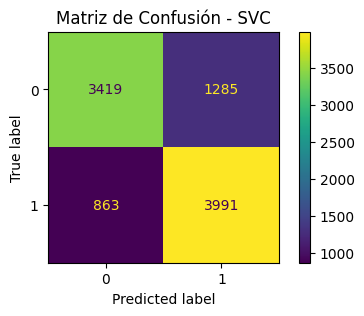

Puntuación F1 (Weighted): 0.7747
Precisión (Weighted): 0.7771
Recall (Weighted): 0.7753
AUC-ROC (Weighted): 0.8385



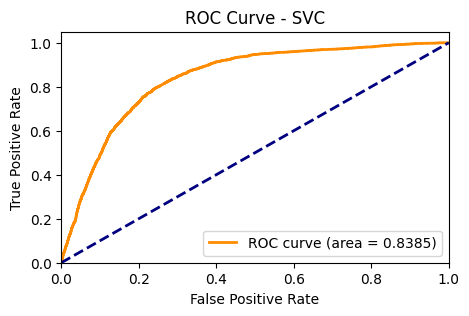

Split 4 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



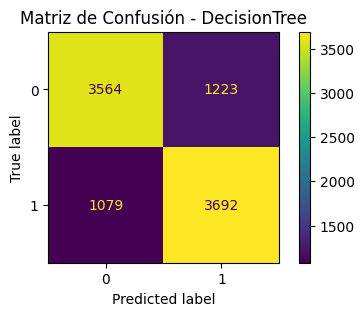

Puntuación F1 (Weighted): 0.7591
Precisión (Weighted): 0.7594
Recall (Weighted): 0.7592
AUC-ROC (Weighted): 0.8208



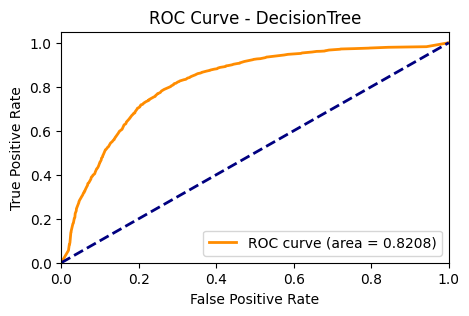

Split 4 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 1.0, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



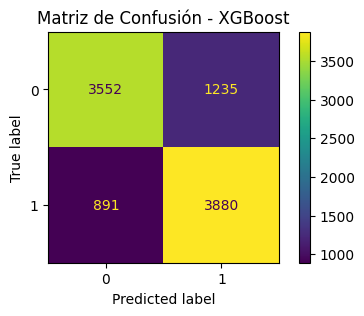

Puntuación F1 (Weighted): 0.7773
Precisión (Weighted): 0.7790
Recall (Weighted): 0.7776
AUC-ROC (Weighted): 0.8537



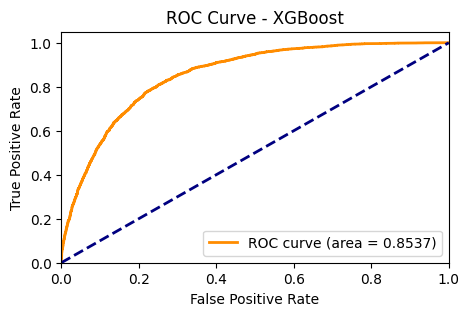

Split 4 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



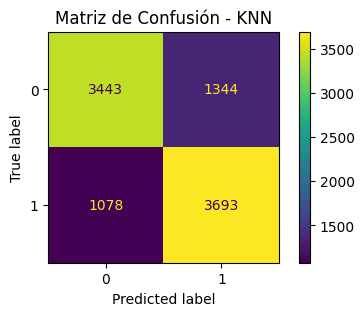

Puntuación F1 (Weighted): 0.7464
Precisión (Weighted): 0.7474
Recall (Weighted): 0.7466
AUC-ROC (Weighted): 0.8116



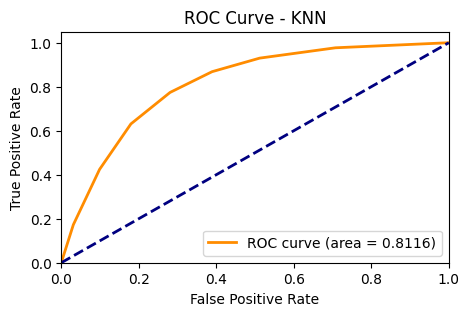

Split 4 - SVC:

SVC se entrenó con los parámetros predeterminados.
Matriz de Confusión - SVC:



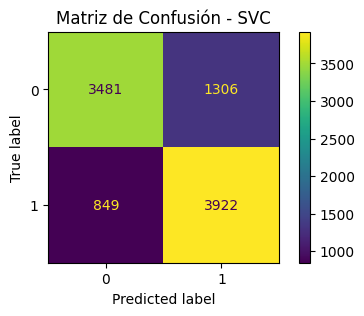

Puntuación F1 (Weighted): 0.7740
Precisión (Weighted): 0.7771
Recall (Weighted): 0.7745
AUC-ROC (Weighted): 0.8399



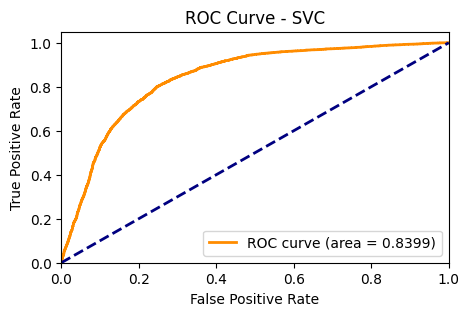

Split 5 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



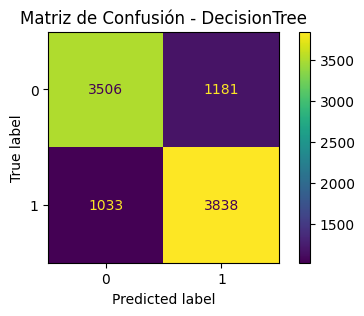

Puntuación F1 (Weighted): 0.7682
Precisión (Weighted): 0.7685
Recall (Weighted): 0.7684
AUC-ROC (Weighted): 0.8273



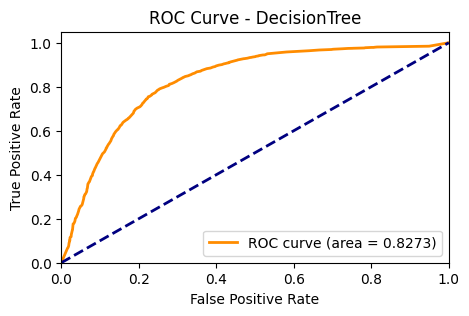

Split 5 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 6, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



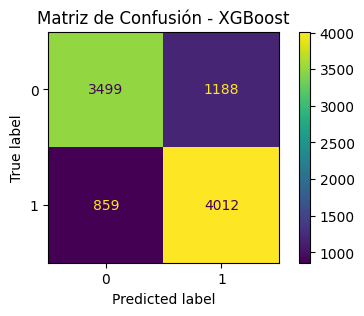

Puntuación F1 (Weighted): 0.7854
Precisión (Weighted): 0.7869
Recall (Weighted): 0.7858
AUC-ROC (Weighted): 0.8559



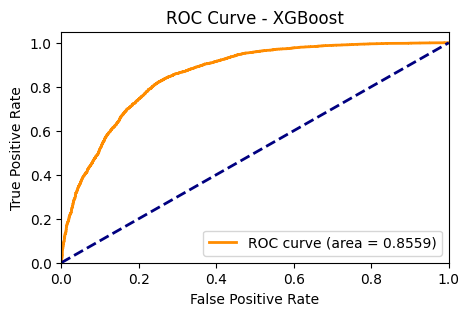

Split 5 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



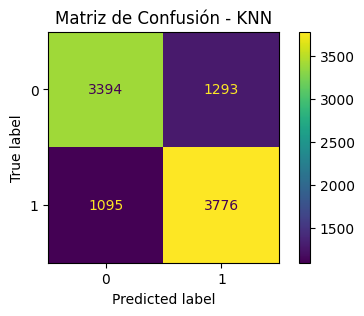

Puntuación F1 (Weighted): 0.7499
Precisión (Weighted): 0.7504
Recall (Weighted): 0.7502
AUC-ROC (Weighted): 0.8129



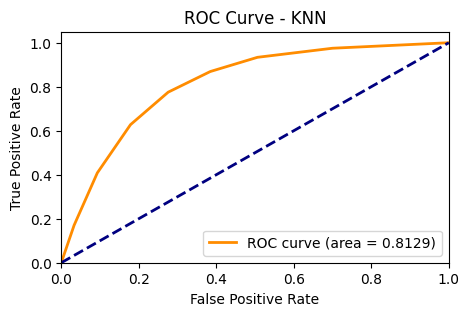

Split 5 - SVC:

SVC se entrenó con los parámetros predeterminados.
Matriz de Confusión - SVC:



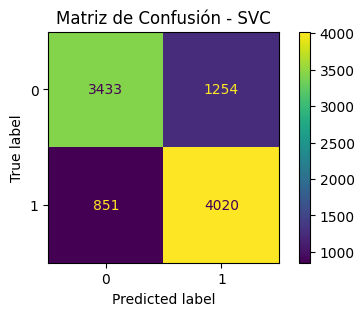

Puntuación F1 (Weighted): 0.7792
Precisión (Weighted): 0.7814
Recall (Weighted): 0.7798
AUC-ROC (Weighted): 0.8415



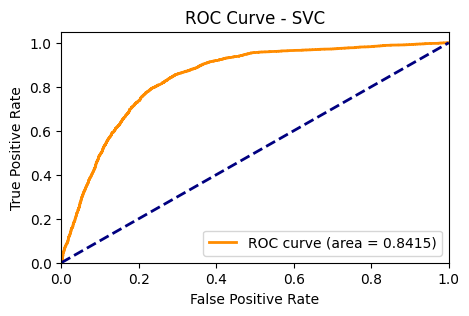

Resultados generales para DecisionTree:

Puntuación F1 Media: 0.7585
Desviación Estándar de F1: 0.0068
Precisión Media: 0.7590
Desviación Estándar de Precisión: 0.0067
Recall Medio: 0.7587
Desviación Estándar de Recall: 0.0068
AUC-ROC Medio: 0.8199
Desviación Estándar de AUC-ROC: 0.0046

Resultados generales para XGBoost:

Puntuación F1 Media: 0.7760
Desviación Estándar de F1: 0.0066
Precisión Media: 0.7777
Desviación Estándar de Precisión: 0.0063
Recall Medio: 0.7764
Desviación Estándar de Recall: 0.0065
AUC-ROC Medio: 0.8509
Desviación Estándar de AUC-ROC: 0.0044

Resultados generales para KNN:

Puntuación F1 Media: 0.7448
Desviación Estándar de F1: 0.0045
Precisión Media: 0.7454
Desviación Estándar de Precisión: 0.0044
Recall Medio: 0.7450
Desviación Estándar de Recall: 0.0045
AUC-ROC Medio: 0.8073
Desviación Estándar de AUC-ROC: 0.0043

Resultados generales para SVC:

Puntuación F1 Media: 0.7723
Desviación Estándar de F1: 0.0048
Precisión Media: 0.7750
Desviación Estándar de Precis

<ipython-input-10-af88e64a9257>:225: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.7584888972992154' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-10-af88e64a9257>:225: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.759034536867993' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-10-af88e64a9257>:225: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.758652437748483' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-10-af88e64a9257>:225: FutureWarning: Setting an item of incompatible dtype is 

In [ ]:
dataset5_best_model = evaluate_models_no_svc_hyperparams(dataset5_undersampled, 'HeartDiseaseorAttack', 4)

## Dataset 6

Evaluación del Modelo:

Split 1 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



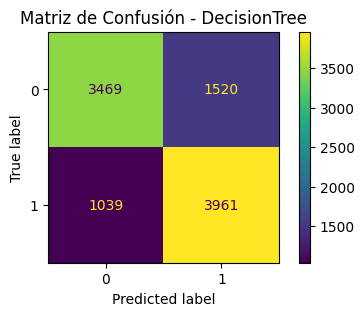

Puntuación F1 (Weighted): 0.7432
Precisión (Weighted): 0.7461
Recall (Weighted): 0.7438
AUC-ROC (Weighted): 0.8050



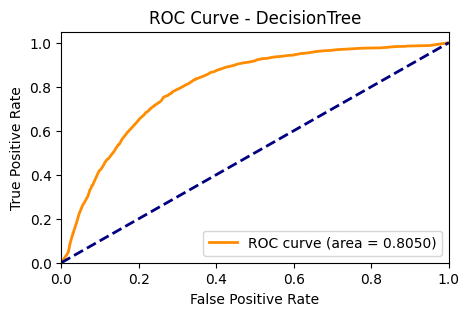

Split 1 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



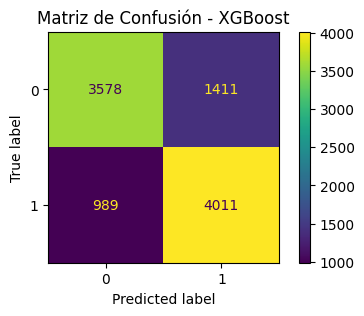

Puntuación F1 (Weighted): 0.7593
Precisión (Weighted): 0.7616
Recall (Weighted): 0.7597
AUC-ROC (Weighted): 0.8325



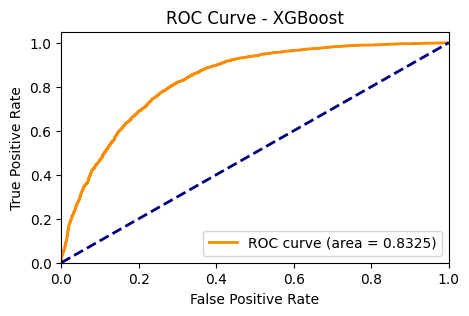

Split 2 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



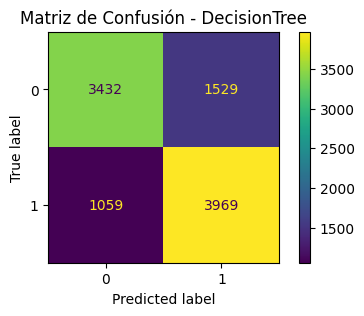

Puntuación F1 (Weighted): 0.7403
Precisión (Weighted): 0.7429
Recall (Weighted): 0.7409
AUC-ROC (Weighted): 0.7974



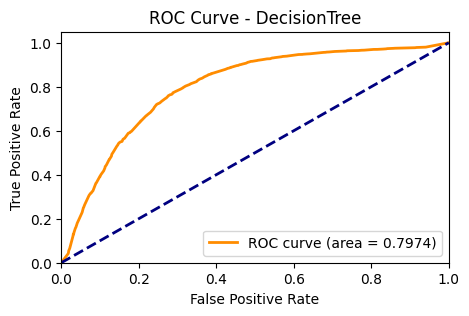

Split 2 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



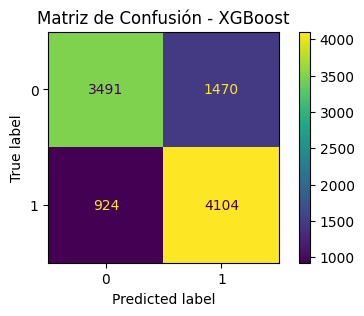

Puntuación F1 (Weighted): 0.7595
Precisión (Weighted): 0.7633
Recall (Weighted): 0.7603
AUC-ROC (Weighted): 0.8294



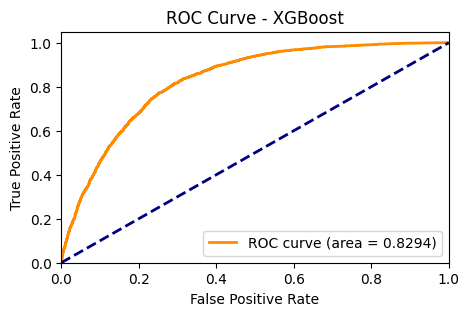

Split 3 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



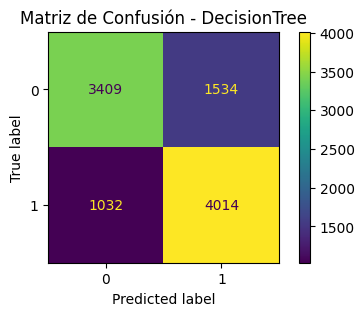

Puntuación F1 (Weighted): 0.7423
Precisión (Weighted): 0.7453
Recall (Weighted): 0.7431
AUC-ROC (Weighted): 0.7968



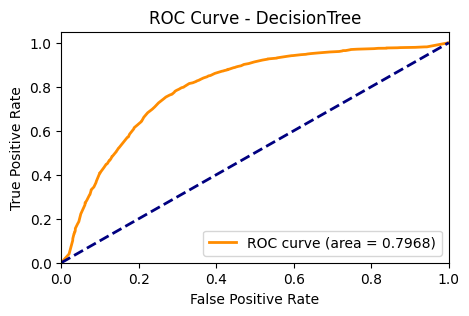

Split 3 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



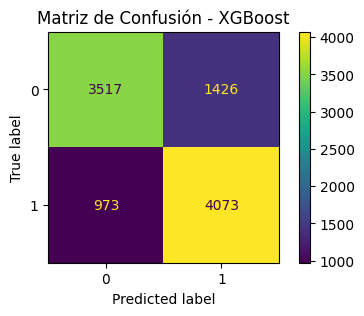

Puntuación F1 (Weighted): 0.7592
Precisión (Weighted): 0.7618
Recall (Weighted): 0.7598
AUC-ROC (Weighted): 0.8340



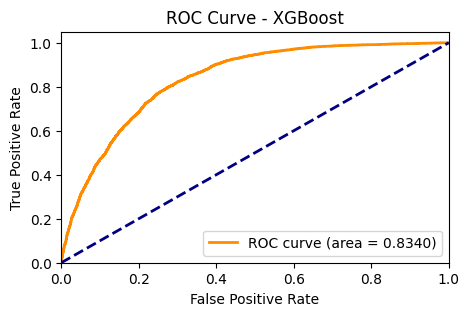

Split 4 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



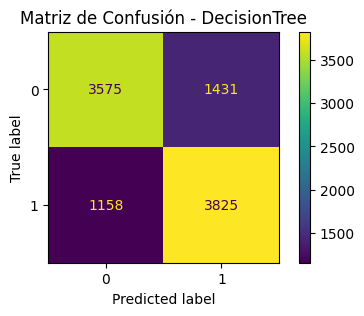

Puntuación F1 (Weighted): 0.7406
Precisión (Weighted): 0.7416
Recall (Weighted): 0.7408
AUC-ROC (Weighted): 0.7962



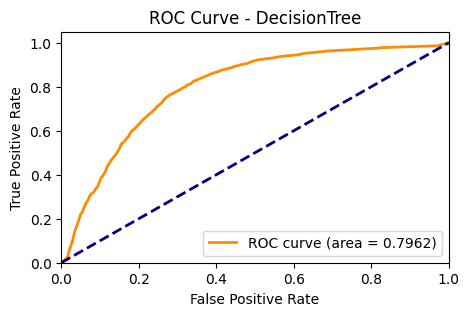

Split 4 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



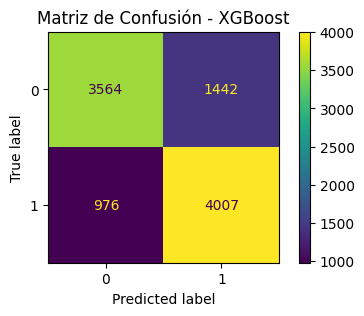

Puntuación F1 (Weighted): 0.7574
Precisión (Weighted): 0.7603
Recall (Weighted): 0.7579
AUC-ROC (Weighted): 0.8309



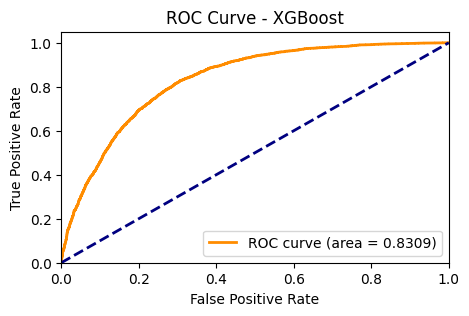

Split 5 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



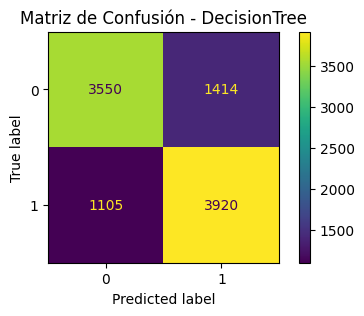

Puntuación F1 (Weighted): 0.7475
Precisión (Weighted): 0.7487
Recall (Weighted): 0.7478
AUC-ROC (Weighted): 0.8055



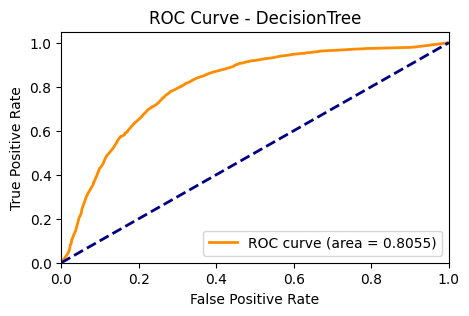

Split 5 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



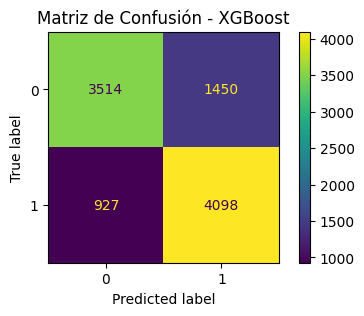

Puntuación F1 (Weighted): 0.7613
Precisión (Weighted): 0.7648
Recall (Weighted): 0.7620
AUC-ROC (Weighted): 0.8382



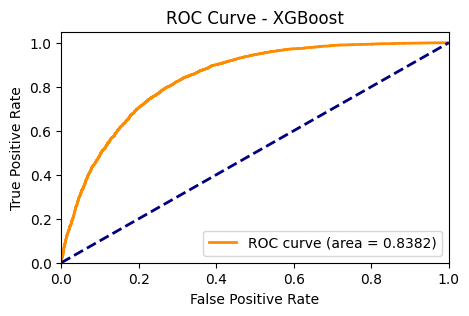

Resultados generales para DecisionTree:

Puntuación F1 Media: 0.7428
Desviación Estándar de F1: 0.0026
Precisión Media: 0.7449
Desviación Estándar de Precisión: 0.0025
Recall Medio: 0.7433
Desviación Estándar de Recall: 0.0026
AUC-ROC Medio: 0.8002
Desviación Estándar de AUC-ROC: 0.0042

Resultados generales para XGBoost:

Puntuación F1 Media: 0.7594
Desviación Estándar de F1: 0.0012
Precisión Media: 0.7623
Desviación Estándar de Precisión: 0.0016
Recall Medio: 0.7600
Desviación Estándar de Recall: 0.0013
AUC-ROC Medio: 0.8330
Desviación Estándar de AUC-ROC: 0.0030

   DecisionTreeF1  DecisionTreePrecision  DecisionTreeRecall  \
0        0.762126               0.768282            0.762500   
1        0.960700               0.961810            0.960714   
2        0.872851               0.873661            0.872889   
3        0.513871               0.517461            0.516402   
4        0.758346               0.758878            0.758506   
5        0.742794               0.744912   

In [ ]:
dataset6_best_model = evaluate_models(dataset6_undersampled, 'Heart_Disease', 5)

Evaluación del Modelo:

Split 1 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



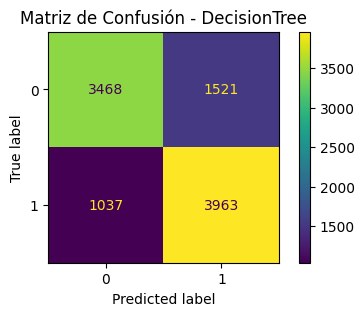

Puntuación F1 (Weighted): 0.7433
Precisión (Weighted): 0.7462
Recall (Weighted): 0.7439
AUC-ROC (Weighted): 0.8052



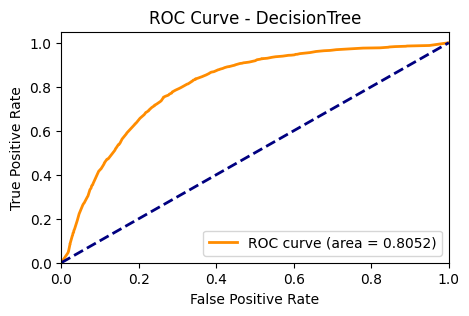

Split 1 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



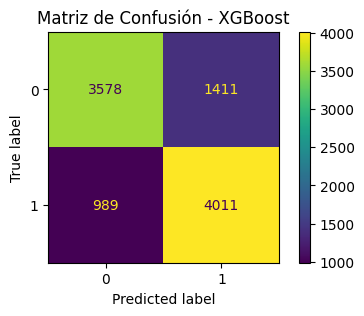

Puntuación F1 (Weighted): 0.7593
Precisión (Weighted): 0.7616
Recall (Weighted): 0.7597
AUC-ROC (Weighted): 0.8325



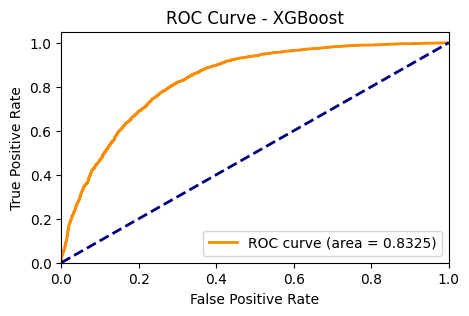

Split 1 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



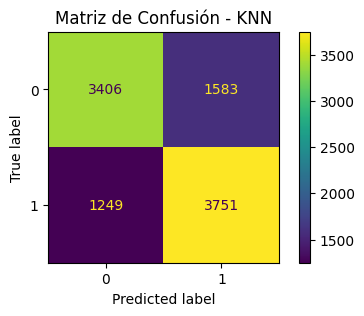

Puntuación F1 (Weighted): 0.7162
Precisión (Weighted): 0.7174
Recall (Weighted): 0.7165
AUC-ROC (Weighted): 0.7735



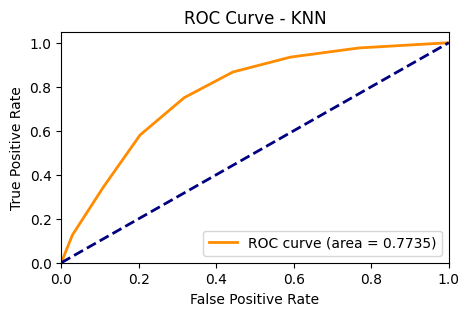

Split 1 - SVC:

SVC se entrenó con los parámetros predeterminados.
Matriz de Confusión - SVC:



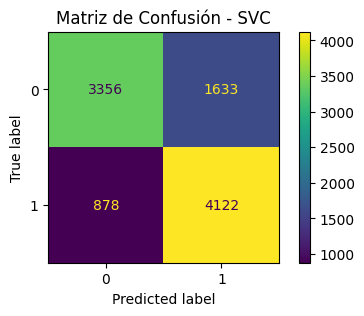

Puntuación F1 (Weighted): 0.7472
Precisión (Weighted): 0.7544
Recall (Weighted): 0.7486
AUC-ROC (Weighted): 0.8105



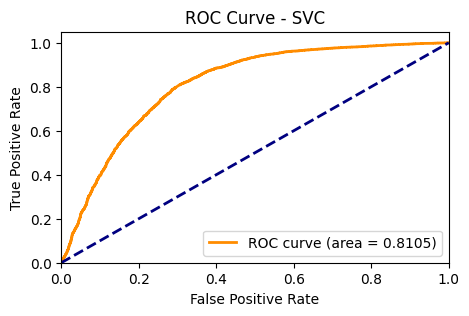

Split 2 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



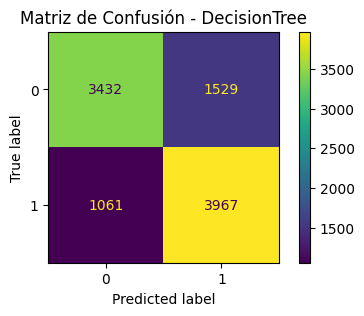

Puntuación F1 (Weighted): 0.7401
Precisión (Weighted): 0.7427
Recall (Weighted): 0.7407
AUC-ROC (Weighted): 0.7967



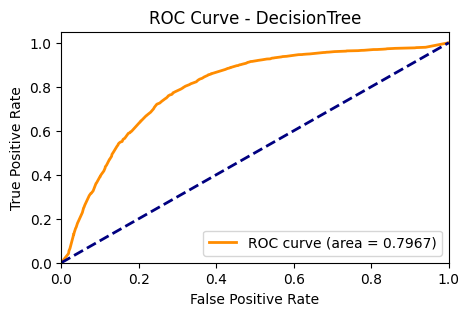

Split 2 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 0.8}
Matriz de Confusión - XGBoost:



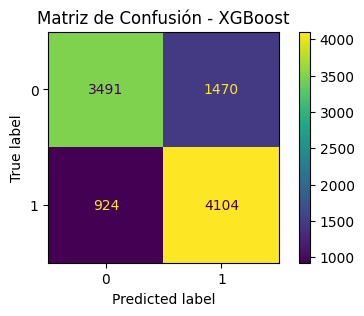

Puntuación F1 (Weighted): 0.7595
Precisión (Weighted): 0.7633
Recall (Weighted): 0.7603
AUC-ROC (Weighted): 0.8294



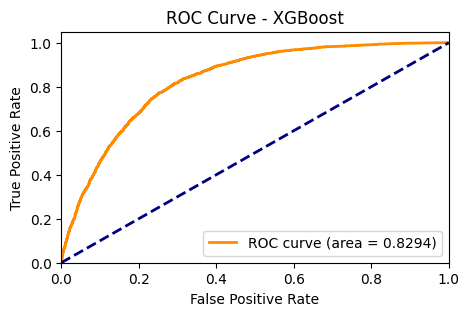

Split 2 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



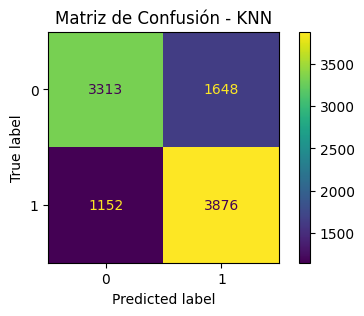

Puntuación F1 (Weighted): 0.7189
Precisión (Weighted): 0.7217
Recall (Weighted): 0.7197
AUC-ROC (Weighted): 0.7751



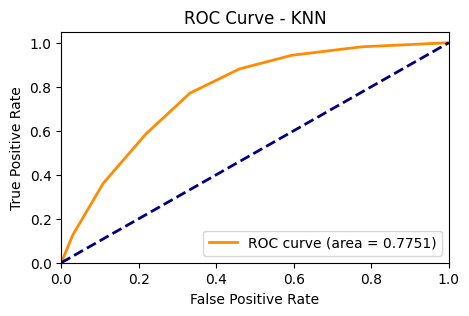

Split 2 - SVC:

SVC se entrenó con los parámetros predeterminados.
Matriz de Confusión - SVC:



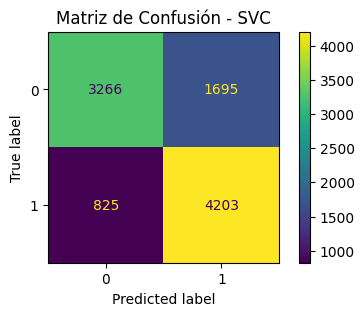

Puntuación F1 (Weighted): 0.7456
Precisión (Weighted): 0.7552
Recall (Weighted): 0.7477
AUC-ROC (Weighted): 0.8095



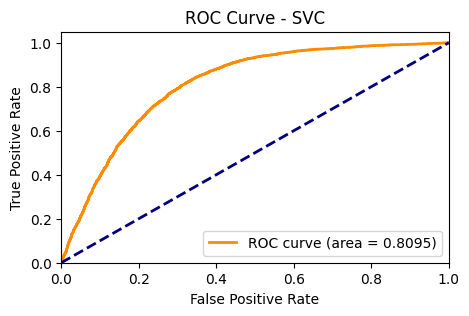

Split 3 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



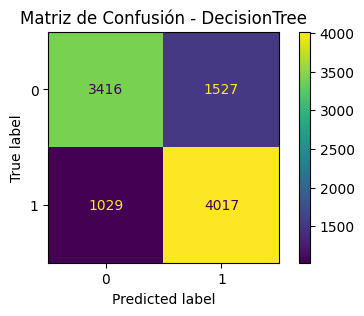

Puntuación F1 (Weighted): 0.7433
Precisión (Weighted): 0.7463
Recall (Weighted): 0.7441
AUC-ROC (Weighted): 0.7984



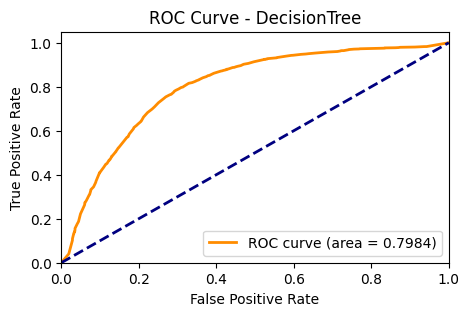

Split 3 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



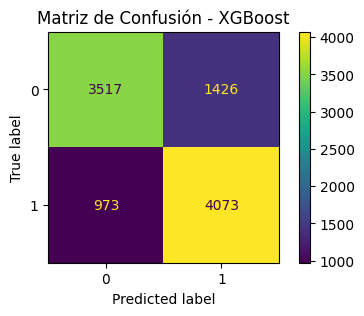

Puntuación F1 (Weighted): 0.7592
Precisión (Weighted): 0.7618
Recall (Weighted): 0.7598
AUC-ROC (Weighted): 0.8340



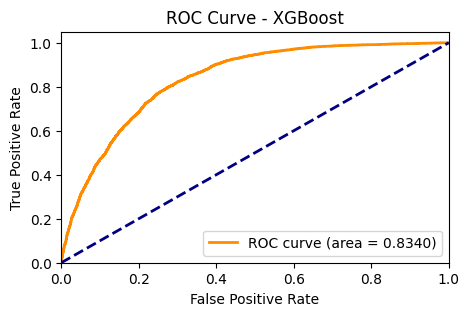

Split 3 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



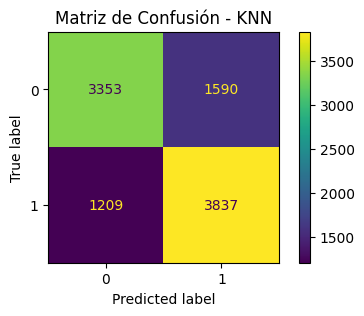

Puntuación F1 (Weighted): 0.7193
Precisión (Weighted): 0.7209
Recall (Weighted): 0.7198
AUC-ROC (Weighted): 0.7771



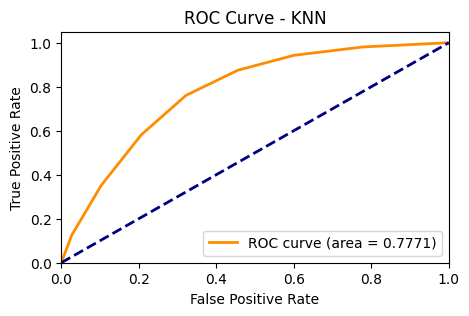

Split 3 - SVC:

SVC se entrenó con los parámetros predeterminados.
Matriz de Confusión - SVC:



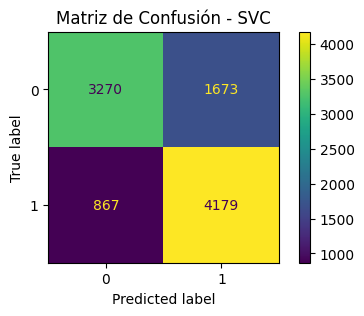

Puntuación F1 (Weighted): 0.7438
Precisión (Weighted): 0.7519
Recall (Weighted): 0.7457
AUC-ROC (Weighted): 0.8134



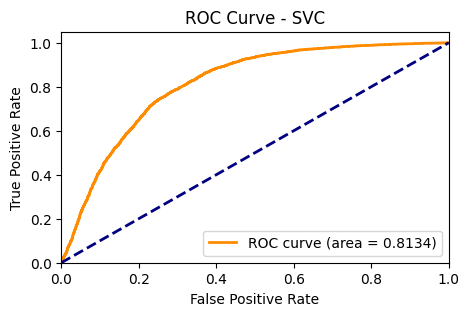

Split 4 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



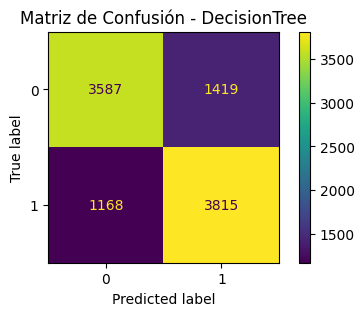

Puntuación F1 (Weighted): 0.7409
Precisión (Weighted): 0.7417
Recall (Weighted): 0.7410
AUC-ROC (Weighted): 0.7961



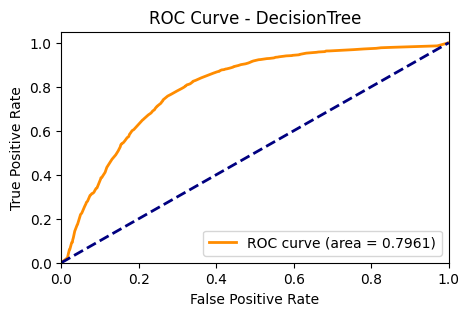

Split 4 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



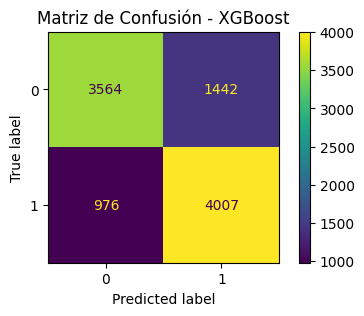

Puntuación F1 (Weighted): 0.7574
Precisión (Weighted): 0.7603
Recall (Weighted): 0.7579
AUC-ROC (Weighted): 0.8309



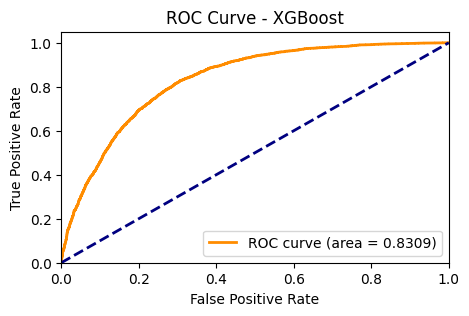

Split 4 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



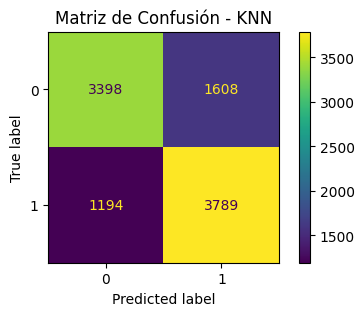

Puntuación F1 (Weighted): 0.7190
Precisión (Weighted): 0.7211
Recall (Weighted): 0.7195
AUC-ROC (Weighted): 0.7767



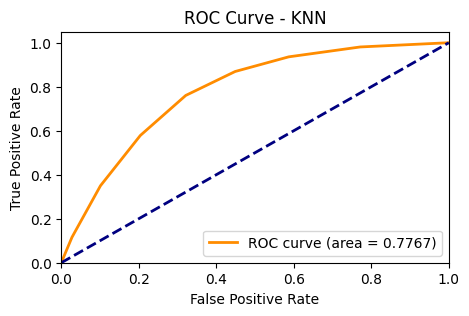

Split 4 - SVC:

SVC se entrenó con los parámetros predeterminados.
Matriz de Confusión - SVC:



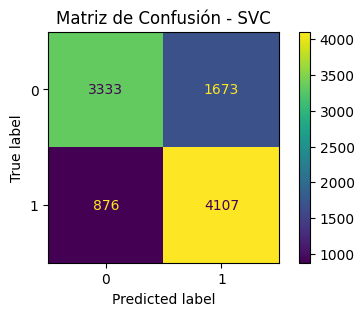

Puntuación F1 (Weighted): 0.7432
Precisión (Weighted): 0.7513
Recall (Weighted): 0.7448
AUC-ROC (Weighted): 0.8071



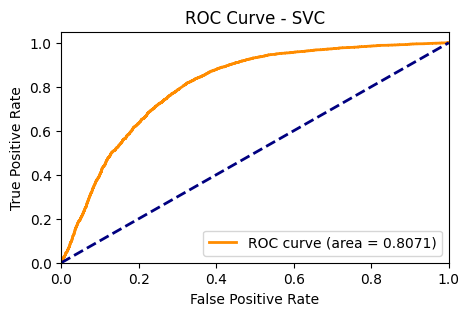

Split 5 - DecisionTree:

Mejores Hiperparámetros:  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Matriz de Confusión - DecisionTree:



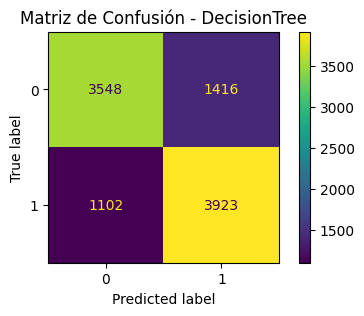

Puntuación F1 (Weighted): 0.7476
Precisión (Weighted): 0.7488
Recall (Weighted): 0.7479
AUC-ROC (Weighted): 0.8060



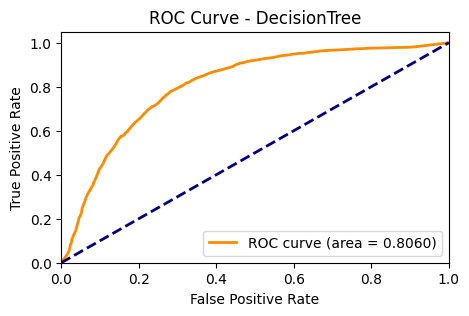

Split 5 - XGBoost:

Mejores Hiperparámetros:  {'xgbclassifier__colsample_bytree': 0.8, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__max_depth': 3, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__subsample': 1.0}
Matriz de Confusión - XGBoost:



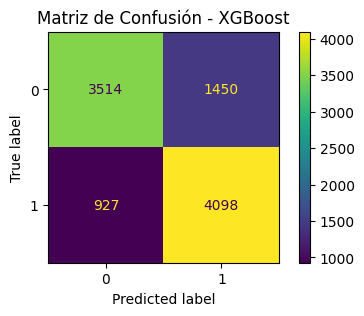

Puntuación F1 (Weighted): 0.7613
Precisión (Weighted): 0.7648
Recall (Weighted): 0.7620
AUC-ROC (Weighted): 0.8382



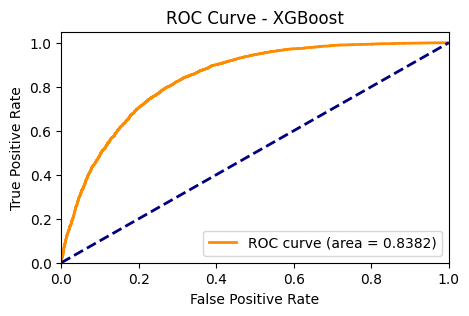

Split 5 - KNN:

Mejores Hiperparámetros:  {'kneighborsclassifier__metric': 'manhattan', 'kneighborsclassifier__n_neighbors': 7, 'kneighborsclassifier__weights': 'uniform'}
Matriz de Confusión - KNN:



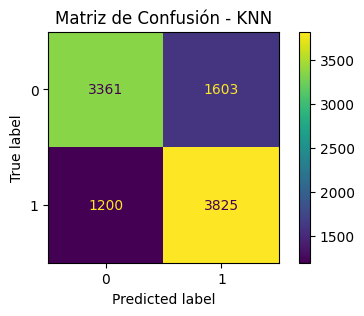

Puntuación F1 (Weighted): 0.7189
Precisión (Weighted): 0.7207
Recall (Weighted): 0.7194
AUC-ROC (Weighted): 0.7783



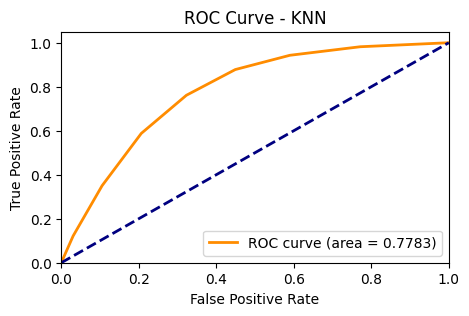

Split 5 - SVC:

SVC se entrenó con los parámetros predeterminados.
Matriz de Confusión - SVC:



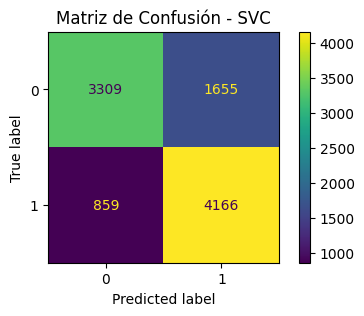

Puntuación F1 (Weighted): 0.7466
Precisión (Weighted): 0.7546
Recall (Weighted): 0.7483
AUC-ROC (Weighted): 0.8136



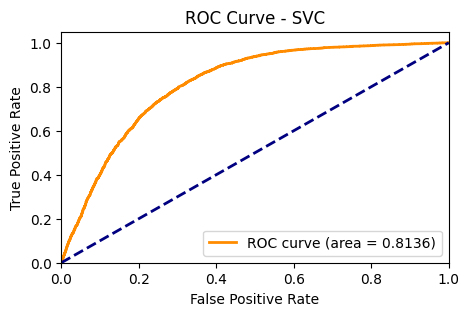

Resultados generales para DecisionTree:

Puntuación F1 Media: 0.7430
Desviación Estándar de F1: 0.0026
Precisión Media: 0.7451
Desviación Estándar de Precisión: 0.0026
Recall Medio: 0.7435
Desviación Estándar de Recall: 0.0026
AUC-ROC Medio: 0.8005
Desviación Estándar de AUC-ROC: 0.0042

Resultados generales para XGBoost:

Puntuación F1 Media: 0.7594
Desviación Estándar de F1: 0.0012
Precisión Media: 0.7623
Desviación Estándar de Precisión: 0.0016
Recall Medio: 0.7600
Desviación Estándar de Recall: 0.0013
AUC-ROC Medio: 0.8330
Desviación Estándar de AUC-ROC: 0.0030

Resultados generales para KNN:

Puntuación F1 Media: 0.7184
Desviación Estándar de F1: 0.0012
Precisión Media: 0.7203
Desviación Estándar de Precisión: 0.0015
Recall Medio: 0.7190
Desviación Estándar de Recall: 0.0012
AUC-ROC Medio: 0.7761
Desviación Estándar de AUC-ROC: 0.0017

Resultados generales para SVC:

Puntuación F1 Media: 0.7453
Desviación Estándar de F1: 0.0015
Precisión Media: 0.7535
Desviación Estándar de Precis

In [ ]:
dataset6_best_model = evaluate_models_no_svc_hyperparams(dataset6_undersampled, 'Heart_Disease', 5)

# Redes GANs

Los conjuntos de muestras de pacientes de CVDs implican un problema de desbalance entre una mayor cantidad de pacientes sin riesgo de sufrir infarto frente a una menor cantidad con riesgo de padecerlo. Es necesario abordar este problema de desbalance para que el modelo no presente sesgos a la hora de emitir sus predicciones, para ello se utilizarán redes generativas adversarias (GANs, por sus siglas en inglés Generative Adversarial Networks) para aumentar el número de muestras de pacientes con riesgo de infarto.

Esta arquitectura consiste en una red generativa cuyo objetivo es producir nuevas muestras de datos indistinguibles de las originales, acompañada de una red antagónica cuyo propósito es discernir entre los datos iniciales y los sintéticos, de este modo ambas redes se complementan en su entrenamiento hasta llegar a un punto en el que las muestras sintéticas sean prácticamente indistinguibles de las originales.

Dentro de todas las posibles implementaciones de la arquitectura GAN a elegir, se ha optado por emplear concretamente la técnica CTGAN, la cual está diseñada específicamente para manejar las peculiaridades de los datos tabulares, por tanto resulta especialmente interesante comprobar su efectividad en un caso como este en el que todas las muestras de datos son de naturaleza tabular.

Para llevar a cabo su uso en el notebook, en primer lugar se ha instalado la librería ctgan e importado la clase CTGAN y se ha definido la función balance_dataset_with_ctgan que toma como entrada un DataFrame, el nombre de la columna objetivo (target), las columnas discretas (discrete_columns), y el número de épocas (epochs) para el entrenamiento del modelo CTGAN.
La función evalúa el desbalance de clases contando cuántas muestras hay en cada clase. La clase mayoritaria se identifica, y se calcula cuántas muestras adicionales son necesarias para cada clase minoritaria con el fin de equilibrar el conjunto de datos.

Se inicializa y entrena el modelo CTGAN con las características (X) del conjunto de datos y para cada clase minoritaria se generan muestras sintéticas, estas muestras se almacenan en un DataFrame y se etiquetan con la clase correspondiente. Las muestras sintéticas generadas se combinan con el conjunto de datos original para formar un nuevo DataFrame.

Finalmente, la función devuelve el DataFrame balanceado, que ahora tiene un número equivalente de muestras para cada clase, lo que mejora la capacidad del modelo para aprender sin sesgos hacia la clase mayoritaria.

In [ ]:
def get_discrete_columns(dataframe, target, threshold_unique_values=10):
    discrete_columns = []
    for column in dataframe.columns:
        if column != target and dataframe[column].nunique() <= threshold_unique_values:
            discrete_columns.append(column)
    return discrete_columns

**CTGAN**

In [ ]:
!pip install ctgan

from ctgan import CTGAN
import pandas as pd

def balance_dataset_with_ctgan(dataframe, target, discrete_columns, epochs=300):
    # Verificar si el DataFrame contiene la columna objetivo
    if target not in dataframe.columns:
        raise ValueError(f"La columna objetivo '{target}' no se encuentra en el DataFrame")

    # Separar características y etiquetas
    X = dataframe.drop(columns=[target])
    y = dataframe[target]

    # Evaluar el desbalance
    class_counts = y.value_counts()
    max_class = class_counts.idxmax()
    max_count = class_counts.max()

    # Calcular el número de muestras necesarias para cada clase para balancear
    samples_to_generate = {cls: max_count - count for cls, count in class_counts.items() if cls != max_class}

    # Inicializar el modelo CTGan
    ctgan = CTGAN(epochs=epochs)
    ctgan.fit(X, discrete_columns)

    # Generar y recolectar muestras sintéticas para cada clase desbalanceada
    synthetic_samples_list = []
    for cls, n_samples in samples_to_generate.items():
        synthetic_samples = ctgan.sample(n_samples)
        synthetic_df = pd.DataFrame(synthetic_samples, columns=X.columns)
        synthetic_df[target] = cls
        synthetic_samples_list.append(synthetic_df)

    # Concatenar las muestras sintéticas con el conjunto original
    synthetic_data = pd.concat(synthetic_samples_list, ignore_index=True)
    balanced_dataframe = pd.concat([dataframe, synthetic_data], ignore_index=True)

    # Verificar el balance de clases
    print(balanced_dataframe[target].value_counts())

    # Devolver el DataFrame balanceado
    return balanced_dataframe

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

## Dataset 1

In [ ]:
dataset1_ctgan = balance_dataset_with_ctgan(dataset1_preprocessed, 'heart_disease', get_discrete_columns(dataset1_preprocessed, 'heart_disease'))

heart_disease
1    150
0    150
Name: count, dtype: int64


## Dataset 2

In [ ]:
dataset2_ctgan = balance_dataset_with_ctgan(dataset2_preprocessed, 'target', get_discrete_columns(dataset2_preprocessed, 'target'))

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


target
1    580
0    580
Name: count, dtype: int64


## Dataset 3

In [ ]:
dataset3_ctgan = balance_dataset_with_ctgan(dataset3_preprocessed, 'target', get_discrete_columns(dataset3_preprocessed, 'target'))

target
0    629
1    629
Name: count, dtype: int64


## Dataset 4

In [ ]:
dataset4_ctgan = balance_dataset_with_ctgan(dataset4_preprocessed, 'TenYearCHD', get_discrete_columns(dataset4_preprocessed, 'TenYearCHD'))

TenYearCHD
0.0    2674
1.0    2674
Name: count, dtype: int64


## Dataset 5

In [ ]:
dataset5_ctgan = balance_dataset_with_ctgan(dataset5_preprocessed, 'HeartDiseaseorAttack', get_discrete_columns(dataset5_preprocessed, 'HeartDiseaseorAttack'))

## Dataset 6

In [ ]:
dataset6_ctgan = balance_dataset_with_ctgan(dataset6_preprocessed, 'Heart_Disease', get_discrete_columns(dataset6_preprocessed, 'Heart_Disease'))

INFO:rdt.transformers.null:Guidance: There are no missing values in column Height_(cm). Extra column not created.
INFO:rdt.transformers.null:Guidance: There are no missing values in column Weight_(kg). Extra column not created.
INFO:rdt.transformers.null:Guidance: There are no missing values in column BMI. Extra column not created.
INFO:rdt.transformers.null:Guidance: There are no missing values in column Alcohol_Consumption. Extra column not created.
INFO:rdt.transformers.null:Guidance: There are no missing values in column Fruit_Consumption. Extra column not created.
INFO:rdt.transformers.null:Guidance: There are no missing values in column Green_Vegetables_Consumption. Extra column not created.
INFO:rdt.transformers.null:Guidance: There are no missing values in column FriedPotato_Consumption. Extra column not created.
INFO:rdt.transformers.null:Guidance: There are no missing values in column Age_Category. Extra column not created.


# Transformers

Los Transformers son algoritmos pertenecientes al campo de ML que utilizan un mecanismo llamado "atención autoconsciente", que permite al modelo evaluar la importancia de cada palabra en una oración respecto a las demás. Esto permite capturar dependencias a largo plazo de manera más efectiva que los modelos recurrentes (RNNs, por sus siglas en inglés Recurrent Neural Networks). Para el presente trabajo se utilizarán algoritmos basados en transformers adaptados para trabajar con fuentes de datos tabulares, concretamente se estudiará el uso del algoritmo TabPFN.

TabPFN (Tabular Pretrained Few-shot Network) es la implementación de la arquitectura transformers que ha sido seleccionada para este punto, combina la flexibilidad de los transformers con algoritmos de aprendizaje automáticos y al igual que CTGAN está diseñada específicamente para trabajar con datos tabulares, convirtiéndose en una excelente opción que explorar.

TabPFN funciona como un modelo de "few-shot learning" para datos tabulares, lo que significa que puede realizar predicciones de alta calidad con solo unas pocas muestras de datos. Este enfoque es muy útil en situaciones donde los datos disponibles son escasos, lo cual reduce la dependencia de datos sintéticos y la necesidad de obtener grandes conjuntos de datos médicos privados.

Respecto al desarrollo del código, en primer lugar es necesario instalar la librería tabpfn, tras lo cual se define la función test_model_tabpfn, que evalúa el desempeño del modelo TabPFN bajo las mismas métricas que los modelos tradicionales.

La principal dificultad reside en la función evaluate_models_tabpfn, que se encarga de crear la instancia del modelo TabPFNClassifier con sus respectivas configuraciones, la entrena con la información del DataFrame que recibe y la prueba con el método definido en el párrafo anterior. Por último devuelvo el modelo que ha sido desarrollado, para que pueda ser usado por los algoritmos definidos en el siguiente punto.

In [ ]:
!pip install tabpfn

import pandas as pd
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score, precision_score, recall_score, roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
import tabpfn
import numpy as np
import matplotlib.pyplot as plt

def test_model_tabpfn(name, model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]  # Obtener las probabilidades para la clase positiva

    cm = confusion_matrix(y_test, y_pred)

    # Imprimir la matriz de confusión
    print(f"Matriz de Confusión - {name}:\n")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot()
    plt.title(f"Matriz de Confusión - {name}")
    plt.gcf().set_size_inches(5, 3)
    plt.show()

    # Calcular e imprimir métricas adicionales
    f1 = f1_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    auc_roc = roc_auc_score(y_test, y_proba)
    print(f"Puntuación F1 (Weighted): {f1:.4f}")
    print(f"Precisión (Weighted): {precision:.4f}")
    print(f"Recall (Weighted): {recall:.4f}")
    print(f"AUC-ROC (Weighted): {auc_roc:.4f}\n")

    # Graficar la curva AUC-ROC
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {auc_roc:.4f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {name}')
    plt.legend(loc="lower right")
    plt.gcf().set_size_inches(5, 3)
    plt.show()

    return {'f1': f1, 'precision': precision, 'recall': recall, 'auc_roc': auc_roc}

def evaluate_models_tabpfn(dataframe, target, row_index):
    if target not in dataframe.columns:
        raise ValueError(f"La columna objetivo '{target}' no se encuentra en el DataFrame")

    print("Evaluación del Modelo TabPFN:\n")

    features = dataframe.drop(columns=[target])
    labels = dataframe[target]

    seed = 42
    n_splits = 5
    holdout_results = {'TabPFN': []}

    for split in range(n_splits):
        X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=seed + split)

        max_samples = 1024

        if len(X_train) > max_samples:
            X_train, y_train = resample(X_train, y_train, replace=False, n_samples=max_samples, stratify=y_train, random_state=seed + split)

        if len(X_test) > max_samples:
            X_test, y_test = resample(X_test, y_test, replace=False, n_samples=max_samples, stratify=y_test, random_state=seed + split)

        classifier = tabpfn.TabPFNClassifier(device='cpu', N_ensemble_configurations=32)
        classifier.fit(X_train, y_train, overwrite_warning=True)

        print(f"Split {split + 1} - TabPFN:\n")
        results = test_model_tabpfn('TabPFN', classifier, X_test, y_test)
        holdout_results['TabPFN'].append(results)

    print(f"Resultados generales para TabPFN:\n")
    f1_scores = [result['f1'] for result in holdout_results['TabPFN']]
    precision_scores = [result['precision'] for result in holdout_results['TabPFN']]
    recall_scores = [result['recall'] for result in holdout_results['TabPFN']]
    auc_roc_scores = [result['auc_roc'] for result in holdout_results['TabPFN']]

    summary_results = {
        'TabpfnF1': np.mean(f1_scores),
        'TabpfnPrecision': np.mean(precision_scores),
        'TabpfnRecall': np.mean(recall_scores),
        'TabpfnAucRoc': np.mean(auc_roc_scores)
    }

    print(f"Puntuación F1 Media: {summary_results['TabpfnF1']:.4f}")
    print(f"Desviación Estándar de F1: {np.std(f1_scores):.4f}")
    print(f"Precisión Media: {summary_results['TabpfnPrecision']:.4f}")
    print(f"Desviación Estándar de Precisión: {np.std(precision_scores):.4f}")
    print(f"Recall Medio: {summary_results['TabpfnRecall']:.4f}")
    print(f"Desviación Estándar de Recall: {np.std(recall_scores):.4f}")
    print(f"AUC-ROC Medio: {summary_results['TabpfnAucRoc']:.4f}")
    print(f"Desviación Estándar de AUC-ROC: {np.std(auc_roc_scores):.4f}\n")

    # Actualizar el DataFrame df_results con los nuevos resultados
    for key, value in summary_results.items():
        df_results.loc[row_index, key] = value

    # Mostrar el DataFrame actualizado
    print(df_results)

    return classifier

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.6/156.6 kB 3.3 MB/s eta 0:00:00


## Dataset 1

Evaluación del Modelo TabPFN:

We have to download the TabPFN, as there is no checkpoint at  /usr/local/lib/python3.10/dist-packages/tabpfn/models_diff/prior_diff_real_checkpoint_n_0_epoch_100.cpkt
It has about 100MB, so this might take a moment.
Split 1 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



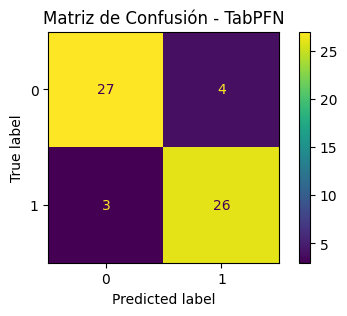

Puntuación F1 (Weighted): 0.8834
Precisión (Weighted): 0.8839
Recall (Weighted): 0.8833
AUC-ROC (Weighted): 0.9366



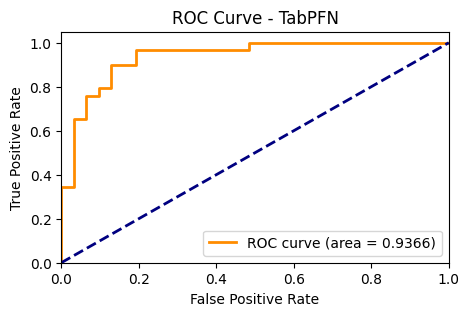

Split 2 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



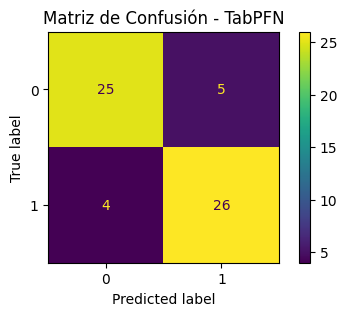

Puntuación F1 (Weighted): 0.8500
Precisión (Weighted): 0.8504
Recall (Weighted): 0.8500
AUC-ROC (Weighted): 0.9011



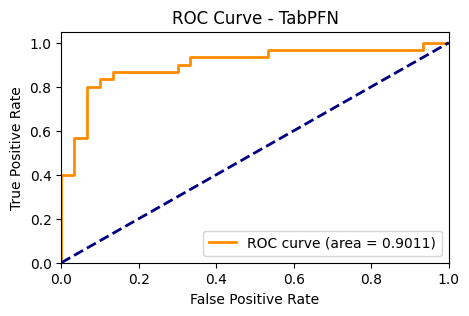

Split 3 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



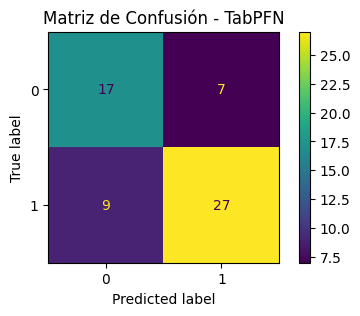

Puntuación F1 (Weighted): 0.7349
Precisión (Weighted): 0.7380
Recall (Weighted): 0.7333
AUC-ROC (Weighted): 0.8461



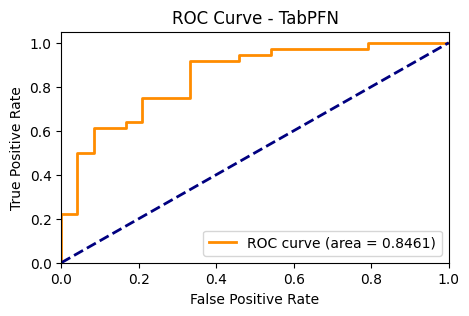

Split 4 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



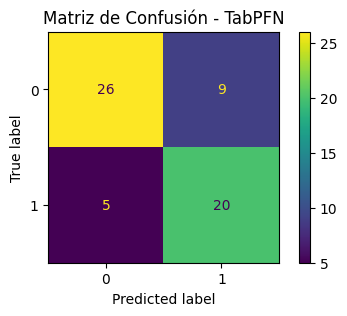

Puntuación F1 (Weighted): 0.7682
Precisión (Weighted): 0.7766
Recall (Weighted): 0.7667
AUC-ROC (Weighted): 0.8480



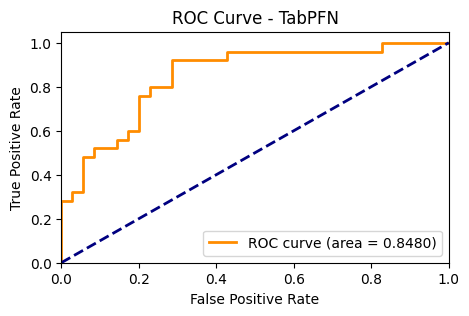

Split 5 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



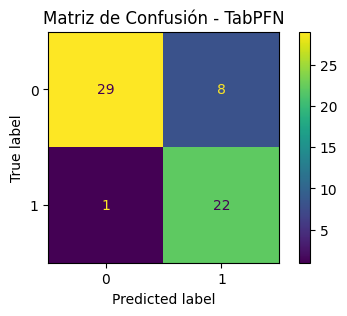

Puntuación F1 (Weighted): 0.8521
Precisión (Weighted): 0.8772
Recall (Weighted): 0.8500
AUC-ROC (Weighted): 0.9436



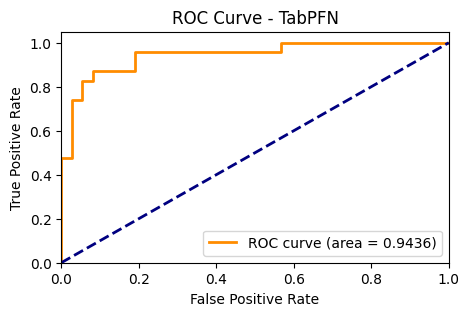

Resultados generales para TabPFN:

Puntuación F1 Media: 0.8177
Desviación Estándar de F1: 0.0563
Precisión Media: 0.8252
Desviación Estándar de Precisión: 0.0579
Recall Medio: 0.8167
Desviación Estándar de Recall: 0.0568
AUC-ROC Medio: 0.8951
Desviación Estándar de AUC-ROC: 0.0418

   DecisionTreeF1  DecisionTreePrecision  DecisionTreeRecall  \
0        0.749967               0.761157            0.750000   
1        0.960697               0.962375            0.960714   
2        0.869233               0.870644            0.869333   
3        0.519241               0.523305            0.521693   
4        0.000000               0.000000            0.000000   
5        0.000000               0.000000            0.000000   

   DecisionTreeAucRoc  XGBoostF1  XGBoostPrecision  XGBoostRecall  \
0            0.751362   0.816245          0.817859       0.816667   
1            0.961399   0.965456          0.966265       0.965476   
2            0.872665   0.908425          0.909284       0.90

<ipython-input-27-67cedd752e7b>:106: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.8176977977489848' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-27-67cedd752e7b>:106: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.8252226232040405' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-27-67cedd752e7b>:106: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.8166666666666667' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-27-67cedd752e7b>:106: FutureWarning: Setting an item of incompatible dtype i

In [ ]:
dataset1_tabpfn_ctgan = evaluate_models_tabpfn(dataset1_ctgan, 'heart_disease', 0)

## Dataset 2

Evaluación del Modelo TabPFN:

Split 1 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



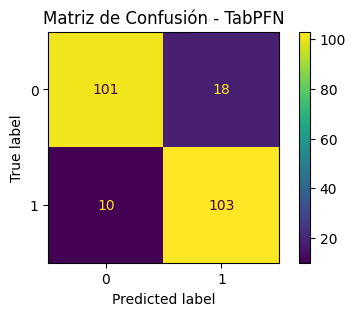

Puntuación F1 (Weighted): 0.8793
Precisión (Weighted): 0.8813
Recall (Weighted): 0.8793
AUC-ROC (Weighted): 0.9535



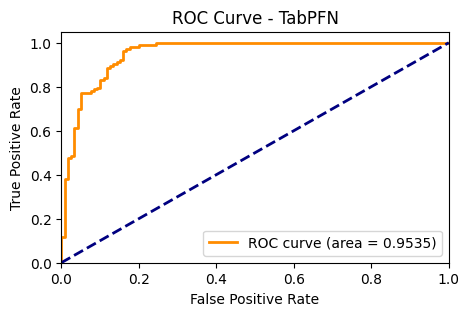

Split 2 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



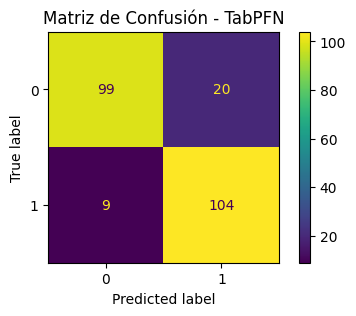

Puntuación F1 (Weighted): 0.8749
Precisión (Weighted): 0.8787
Recall (Weighted): 0.8750
AUC-ROC (Weighted): 0.9459



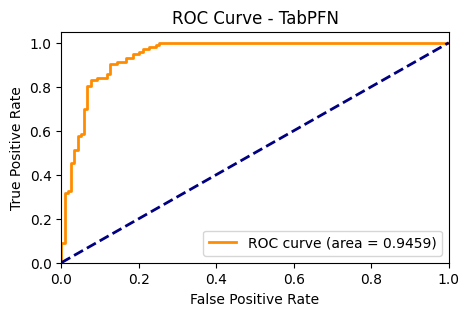

Split 3 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



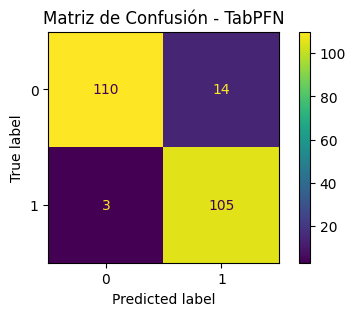

Puntuación F1 (Weighted): 0.9268
Precisión (Weighted): 0.9310
Recall (Weighted): 0.9267
AUC-ROC (Weighted): 0.9683



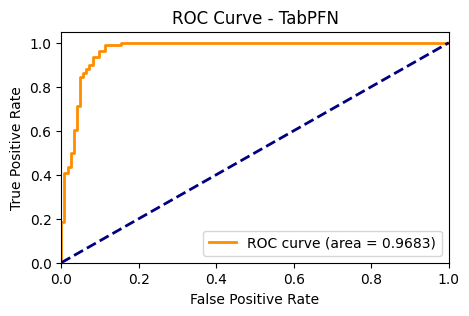

Split 4 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



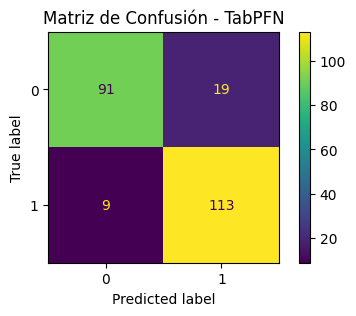

Puntuación F1 (Weighted): 0.8788
Precisión (Weighted): 0.8816
Recall (Weighted): 0.8793
AUC-ROC (Weighted): 0.9527



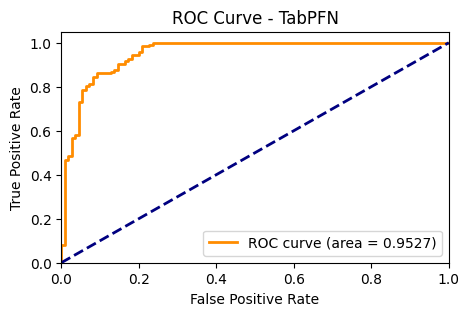

Split 5 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



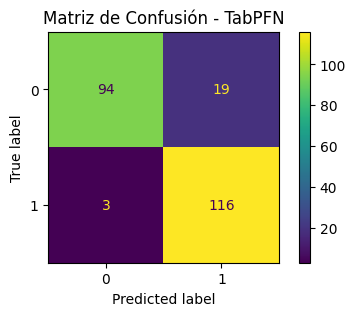

Puntuación F1 (Weighted): 0.9045
Precisión (Weighted): 0.9127
Recall (Weighted): 0.9052
AUC-ROC (Weighted): 0.9523



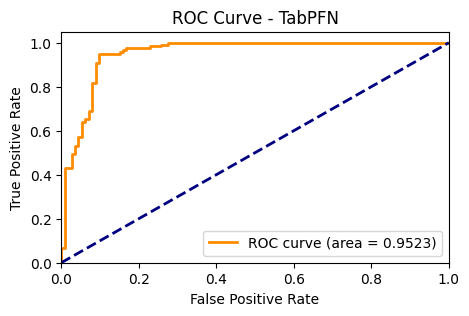

Resultados generales para TabPFN:

Puntuación F1 Media: 0.8929
Desviación Estándar de F1: 0.0200
Precisión Media: 0.8971
Desviación Estándar de Precisión: 0.0211
Recall Medio: 0.8931
Desviación Estándar de Recall: 0.0199
AUC-ROC Medio: 0.9545
Desviación Estándar de AUC-ROC: 0.0074

   DecisionTreeF1  DecisionTreePrecision  DecisionTreeRecall  \
0        0.749967               0.761157            0.750000   
1        0.960697               0.962375            0.960714   
2        0.869233               0.870644            0.869333   
3        0.519241               0.523305            0.521693   
4        0.000000               0.000000            0.000000   
5        0.000000               0.000000            0.000000   

   DecisionTreeAucRoc  XGBoostF1  XGBoostPrecision  XGBoostRecall  \
0            0.751362   0.816245          0.817859       0.816667   
1            0.961399   0.965456          0.966265       0.965476   
2            0.872665   0.908425          0.909284       0.90

In [ ]:
dataset2_tabpfn_ctgan = evaluate_models_tabpfn(dataset2_ctgan, 'target', 1)

## Dataset 3

Evaluación del Modelo TabPFN:

Split 1 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



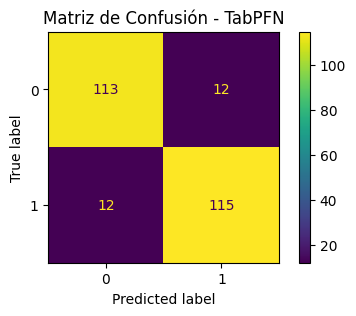

Puntuación F1 (Weighted): 0.9048
Precisión (Weighted): 0.9048
Recall (Weighted): 0.9048
AUC-ROC (Weighted): 0.9597



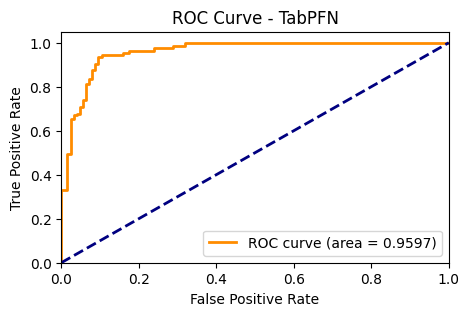

Split 2 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



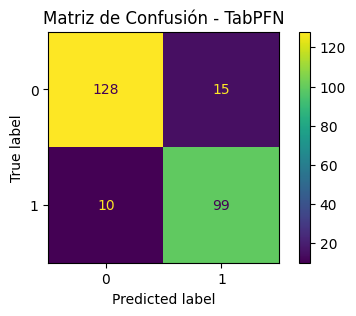

Puntuación F1 (Weighted): 0.9010
Precisión (Weighted): 0.9020
Recall (Weighted): 0.9008
AUC-ROC (Weighted): 0.9476



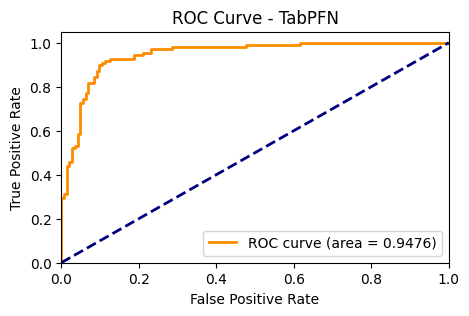

Split 3 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



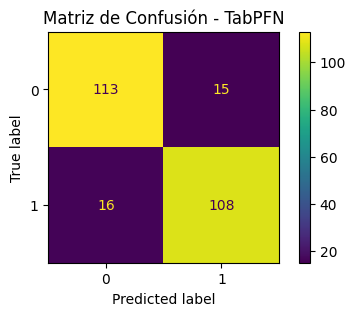

Puntuación F1 (Weighted): 0.8770
Precisión (Weighted): 0.8770
Recall (Weighted): 0.8770
AUC-ROC (Weighted): 0.9463



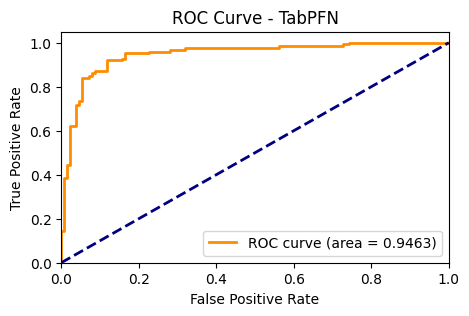

Split 4 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



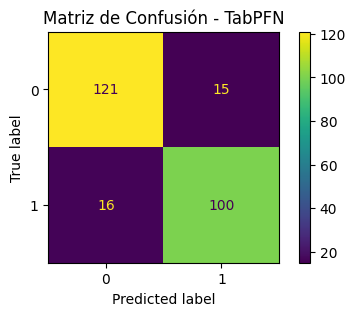

Puntuación F1 (Weighted): 0.8769
Precisión (Weighted): 0.8769
Recall (Weighted): 0.8770
AUC-ROC (Weighted): 0.9210



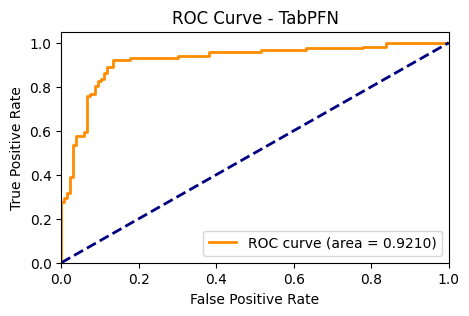

Split 5 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



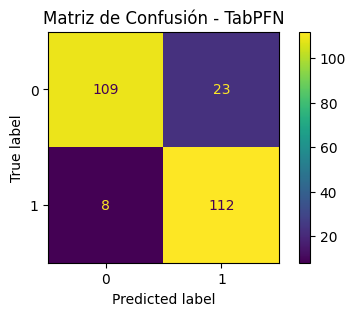

Puntuación F1 (Weighted): 0.8769
Precisión (Weighted): 0.8831
Recall (Weighted): 0.8770
AUC-ROC (Weighted): 0.9609



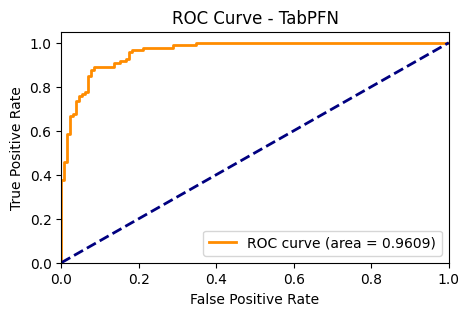

Resultados generales para TabPFN:

Puntuación F1 Media: 0.8873
Desviación Estándar de F1: 0.0128
Precisión Media: 0.8887
Desviación Estándar de Precisión: 0.0122
Recall Medio: 0.8873
Desviación Estándar de Recall: 0.0127
AUC-ROC Medio: 0.9471
Desviación Estándar de AUC-ROC: 0.0144

   DecisionTreeF1  DecisionTreePrecision  DecisionTreeRecall  \
0        0.749967               0.761157            0.750000   
1        0.960697               0.962375            0.960714   
2        0.869233               0.870644            0.869333   
3        0.519241               0.523305            0.521693   
4        0.000000               0.000000            0.000000   
5        0.000000               0.000000            0.000000   

   DecisionTreeAucRoc  XGBoostF1  XGBoostPrecision  XGBoostRecall  \
0            0.751362   0.816245          0.817859       0.816667   
1            0.961399   0.965456          0.966265       0.965476   
2            0.872665   0.908425          0.909284       0.90

In [ ]:
dataset3_tabpfn_ctgan = evaluate_models_tabpfn(dataset3_ctgan, 'target', 2)

## Dataset 4

Evaluación del Modelo TabPFN:

We have to download the TabPFN, as there is no checkpoint at  /usr/local/lib/python3.10/dist-packages/tabpfn/models_diff/prior_diff_real_checkpoint_n_0_epoch_100.cpkt
It has about 100MB, so this might take a moment.
Split 1 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


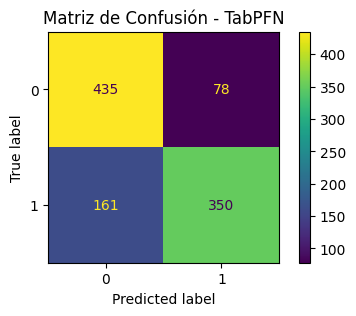

Puntuación F1 (Weighted): 0.7650
Precisión (Weighted): 0.7737
Recall (Weighted): 0.7666
AUC-ROC (Weighted): 0.8330



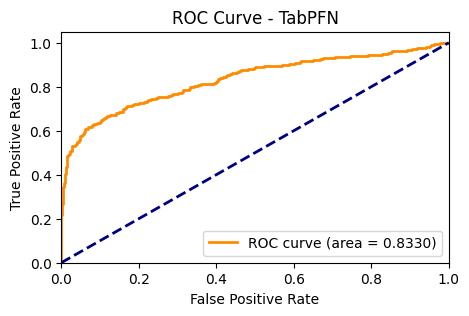

Split 2 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



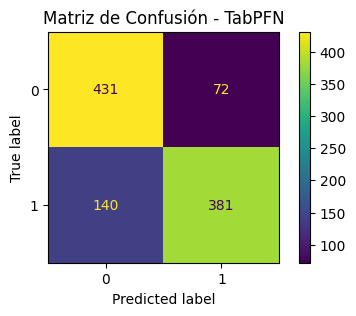

Puntuación F1 (Weighted): 0.7923
Precisión (Weighted): 0.7987
Recall (Weighted): 0.7930
AUC-ROC (Weighted): 0.8630



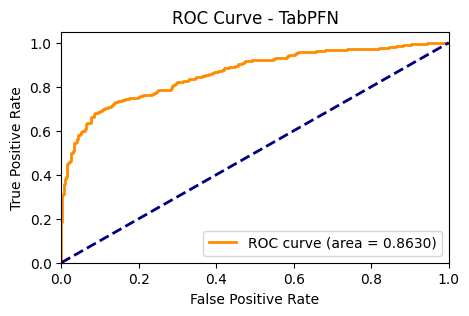

Split 3 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



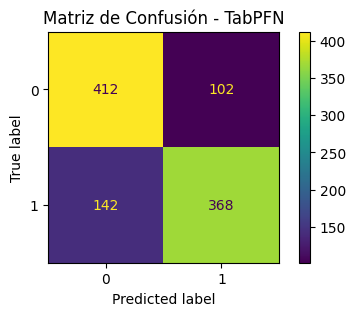

Puntuación F1 (Weighted): 0.7613
Precisión (Weighted): 0.7633
Recall (Weighted): 0.7617
AUC-ROC (Weighted): 0.8324



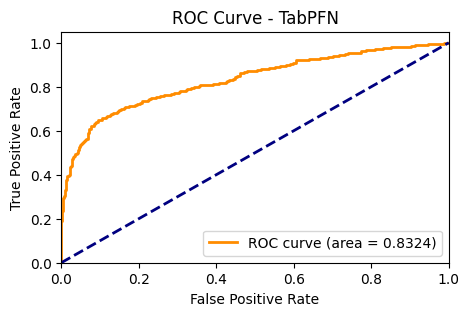

Split 4 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



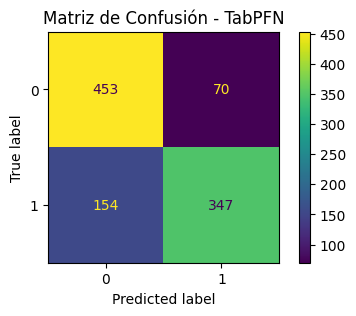

Puntuación F1 (Weighted): 0.7794
Precisión (Weighted): 0.7883
Recall (Weighted): 0.7812
AUC-ROC (Weighted): 0.8381



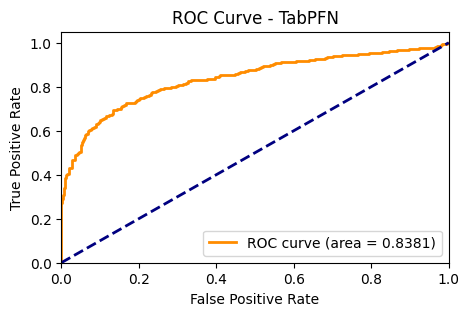

Split 5 - TabPFN:



/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Matriz de Confusión - TabPFN:



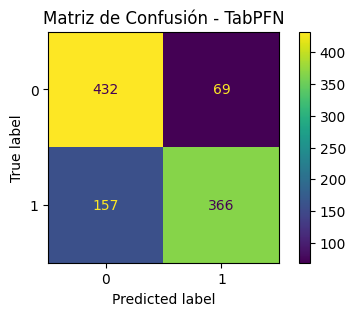

Puntuación F1 (Weighted): 0.7781
Precisión (Weighted): 0.7886
Recall (Weighted): 0.7793
AUC-ROC (Weighted): 0.8429



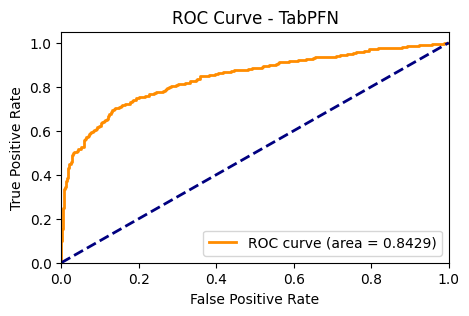

Resultados generales para TabPFN:

Puntuación F1 Media: 0.7752
Desviación Estándar de F1: 0.0111
Precisión Media: 0.7825
Desviación Estándar de Precisión: 0.0125
Recall Medio: 0.7764
Desviación Estándar de Recall: 0.0111
AUC-ROC Medio: 0.8419
Desviación Estándar de AUC-ROC: 0.0112

   DecisionTreeF1  DecisionTreePrecision  DecisionTreeRecall  \
0               0                      0                   0   
1               0                      0                   0   
2               0                      0                   0   
3               0                      0                   0   
4               0                      0                   0   
5               0                      0                   0   

   DecisionTreeAucRoc  XGBoostF1  XGBoostPrecision  XGBoostRecall  \
0                   0          0                 0              0   
1                   0          0                 0              0   
2                   0          0                 0           

<ipython-input-14-67cedd752e7b>:106: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.775215181765072' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-14-67cedd752e7b>:106: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.7825078359647246' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-14-67cedd752e7b>:106: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.7763671875' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_results.loc[row_index, key] = value
<ipython-input-14-67cedd752e7b>:106: FutureWarning: Setting an item of incompatible dtype is depre

In [ ]:
dataset4_tabpfn_ctgan = evaluate_models_tabpfn(dataset4_ctgan, 'TenYearCHD', 3)

## Dataset 5

In [ ]:
dataset5_tabpfn_ctgan = evaluate_models_tabpfn(dataset5_ctgan, 'HeartDiseaseorAttack', 4)

## Dataset 6

In [ ]:
dataset6_tabpfn_ctgan = evaluate_models_tabpfn(dataset6_ctgan, 'Heart_Disease', 5)

# Interpretabilidad

Una vez se hayan desarrollado los modelos de IA predictivos basados en transformers, se les aplicarán procesos de interpretabilidad para estudiar la manera en que el modelo evalúa los datos a la hora de emitir sus predicciones. De modo que además de predecir el riesgo de cardiopatía de un paciente sea posible explicar cuáles son las causas y variables que le han llevado a obtener dicha valoración de riesgo.

En este aspecto, se han decidido aplicar las siguientes técnicas de interpretabilidad al modelo impulsado por el algoritmo XGBoost obtenido en puntos anteriores:

* SHAP (SHapley Additive exPlanations) es una técnica que descompone la predicción de un modelo en contribuciones individuales de cada característica, proporcionando una explicación coherente y cuantitativa de cómo cada factor influyó en la predicción final.
* LIME (Local Interpretable Model-agnostic Explanations) es otra técnica que crea un modelo interpretable localmente en torno a una predicción específica para explicar el comportamiento de un modelo complejo. Para ello modifica los datos de entrada ligeramente para observar cómo cambian las predicciones, lo que permite identificar qué características fueron más influyentes para esa predicción en particular.

Respecto al código, requiere descargar de las librerías shap y lime, que serán usadas en la función interpret_model, la cual se encargada de realizar este análisis, comenzando por dividir los datos en conjuntos de entrenamiento y prueba, y luego tomando una muestra de estos datos para optimizar el uso de memoria. Con esta muestra, se puede proceder a la interpretación.

En primer lugar, se utiliza SHAP para desglosar las predicciones del modelo en contribuciones individuales de cada característica. Como el modelo es de tipo XGBoost, se emplea TreeExplainer para calcular los valores SHAP, que es una alternativa específica para modelos basados en árboles. Con estos valores se puede visualizar cómo cada característica influye en la predicción de manera global mediante un gráfico de resumen, permitiendo identificar fácilmente qué factores son más determinantes en las predicciones del modelo.

En segundo lugar, se implementa LIME para obtener una interpretación local del modelo. Esto se logra mediante la función LimeTabularExplainer, que genera una explicación detallada para una predicción específica, la cual se visualiza con un gráfico de barras que muestra la importancia de las características para esa instancia en particular.

En conjunto, estas técnicas proporcionan una comprensión tanto global como local del comportamiento del modelo, lo que es esencial para asegurar que las predicciones no solo sean precisas, sino también transparentes y justificables, algo particularmente importante en aplicaciones médicas donde es crucial entender por qué un modelo ha clasificado a un paciente con un cierto nivel de riesgo.

In [ ]:
!pip install interpret shap lime

from interpret.blackbox import ShapKernel, LimeTabular
from sklearn.model_selection import train_test_split
import shap
import lime.lime_tabular
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb  # Importar xgboost

def extract_model_from_pipeline(pipeline):
    """ Extrae el modelo del pipeline si es un Pipeline de scikit-learn """
    if isinstance(pipeline, Pipeline):
        # Imprimir los nombres de los pasos en el pipeline para depuración
        print("Pasos en el pipeline:")
        for name, step in pipeline.steps:
            print(f"{name}: {step}")
        # Intentar extraer el modelo basado en el nombre del último paso
        return pipeline.steps[-1][1]  # Suponemos que el último paso es el clasificador
    return pipeline

def interpret_model(classifier, dataframe, target, instance_index=0, sample_size=100):
    # Verificar si el DataFrame contiene la columna objetivo
    if target not in dataframe.columns:
        raise ValueError(f"La columna objetivo '{target}' no se encuentra en el DataFrame")

    # Separar las características y la variable objetivo
    X = dataframe.drop(columns=[target])
    y = dataframe[target]

    # Dividir el conjunto de datos en entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Tomar una muestra del conjunto de datos para evitar el uso excesivo de memoria
    X_train_sample = X_train.sample(n=min(sample_size, X_train.shape[0]), random_state=42)
    X_test_sample = X_test.sample(n=min(sample_size, X_test.shape[0]), random_state=42)

    # Configurar fondo blanco para las gráficas
    plt.rcParams['axes.facecolor'] = 'white'
    plt.rcParams['figure.facecolor'] = 'white'

    # Verificar el formato de los datos para SHAP y LIME
    X_train_sample = pd.DataFrame(X_train_sample, columns=X.columns)
    X_test_sample = pd.DataFrame(X_test_sample, columns=X.columns)

    # Extraer el modelo si está dentro de un pipeline
    model = extract_model_from_pipeline(classifier)

    # Explicar el modelo usando SHAP
    try:
        # Verificar si el modelo es de tipo XGBoost
        if isinstance(model, xgb.XGBClassifier):
            explainer = shap.TreeExplainer(model)
            shap_values = explainer.shap_values(X_test_sample)

            # Inicializar SHAP
            shap.initjs()

            # Crear el gráfico de resumen de SHAP
            plt.figure(figsize=(12, 8))
            shap.summary_plot(shap_values, X_test_sample, plot_type='bar', show=False)

            # Ajustar la visualización
            plt.title('Resumen de la Importancia de las Características (SHAP)', pad=30)
            plt.tight_layout()
            plt.show()
        elif isinstance(model, RandomForestClassifier):
            explainer = shap.TreeExplainer(model)
            shap_values = explainer.shap_values(X_test_sample)

            # Inicializar SHAP
            shap.initjs()

            # Crear el gráfico de resumen de SHAP
            plt.figure(figsize=(12, 8))
            shap.summary_plot(shap_values, X_test_sample, plot_type='bar', show=False)

            # Ajustar la visualización
            plt.title('Resumen de la Importancia de las Características (SHAP)', pad=30)
            plt.tight_layout()
            plt.show()
        else:
            # Si el modelo no es compatible con TreeExplainer, usar KernelExplainer
            print(f"Modelo de tipo {type(model)} no soportado por TreeExplainer. Usando KernelExplainer.")
            explainer = shap.KernelExplainer(model.predict_proba, X_train_sample)
            shap_values = explainer.shap_values(X_test_sample)

            # Inicializar SHAP
            shap.initjs()

            # Crear el gráfico de resumen de SHAP
            plt.figure(figsize=(12, 8))
            shap.summary_plot(shap_values, X_test_sample, plot_type='bar', show=False)

            # Ajustar la visualización
            plt.title('Resumen de la Importancia de las Características (SHAP)', pad=30)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f"Error con SHAP: {e}")

    # Explicar el modelo usando LIME
    try:
        lime_explainer = lime.lime_tabular.LimeTabularExplainer(
            X_train_sample.values,
            feature_names=X_train_sample.columns.tolist(),
            class_names=[str(i) for i in np.unique(y)],
            discretize_continuous=True
        )
        lime_explanation = lime_explainer.explain_instance(
            X_test_sample.iloc[instance_index].values,
            classifier.predict_proba,
            num_features=10
        )

        # Extraer características y sus importancias
        lime_explanation_list = lime_explanation.as_list()
        features, scores = zip(*lime_explanation_list)

        # Crear el gráfico de barras con matplotlib
        plt.figure(figsize=(10, 6))
        plt.barh(features, scores, color='skyblue')
        plt.xlabel('Importancia')
        plt.title('Explicación LIME para una Instancia Específica')
        plt.gca().invert_yaxis()  # Para que las características más importantes estén en la parte superior
        plt.show()

    except Exception as e:
        print(f"Error con LIME: {e}")

## Dataset 1

Pasos en el pipeline:
standardscaler: StandardScaler()
xgbclassifier: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.2, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


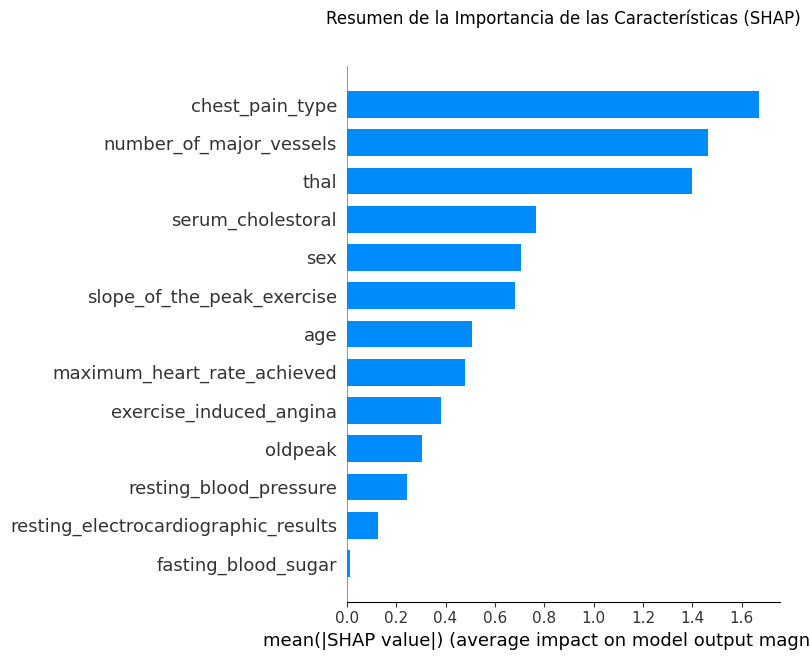

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


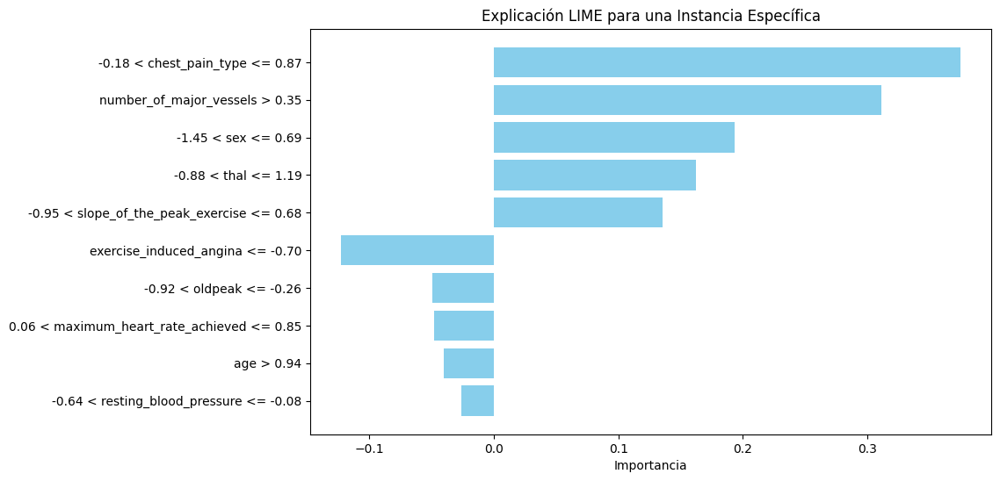

In [ ]:
interpret_model(dataset1_best_model, dataset1_undersampled, 'heart_disease')

## Dataset 2

Pasos en el pipeline:
standardscaler: StandardScaler()
xgbclassifier: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)


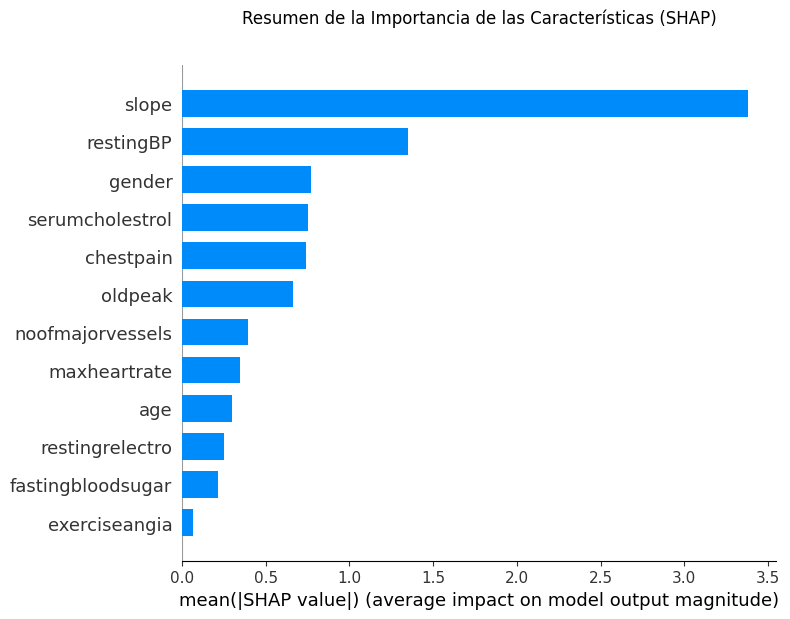

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


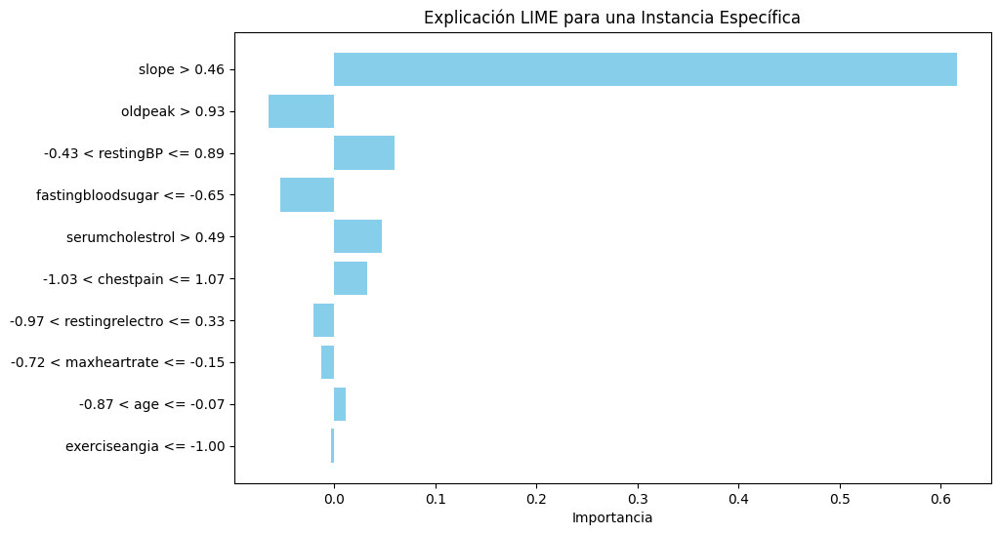

In [ ]:
interpret_model(dataset2_best_model, dataset2_undersampled, 'target')

## Dataset 3

Pasos en el pipeline:
standardscaler: StandardScaler()
xgbclassifier: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.2, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=9,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=50,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)


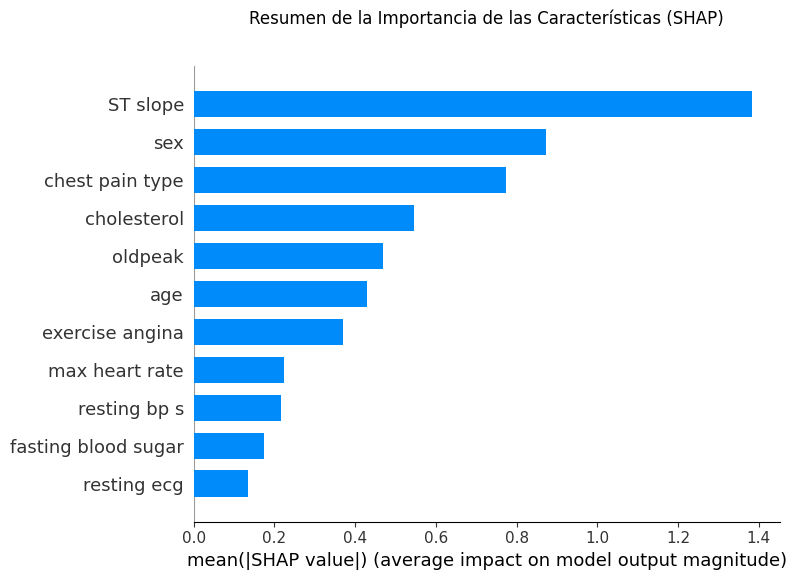

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


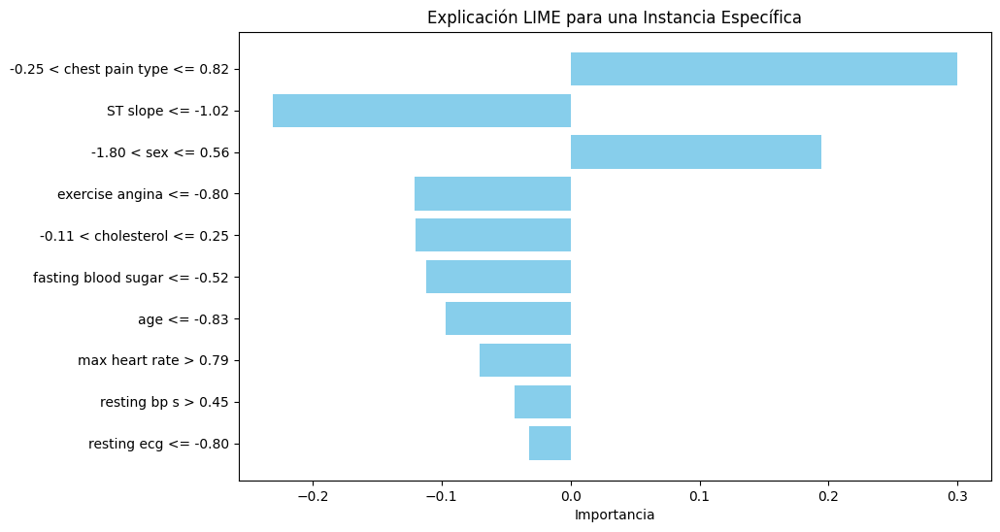

In [ ]:
interpret_model(dataset3_best_model, dataset3_undersampled, 'target')

## Dataset 4

Pasos en el pipeline:
standardscaler: StandardScaler()
xgbclassifier: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)


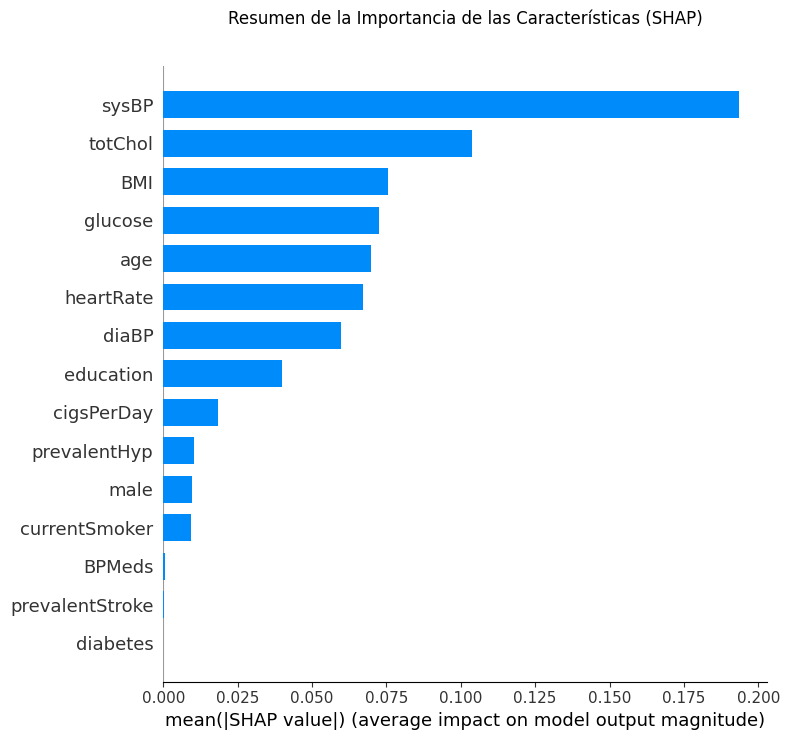

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


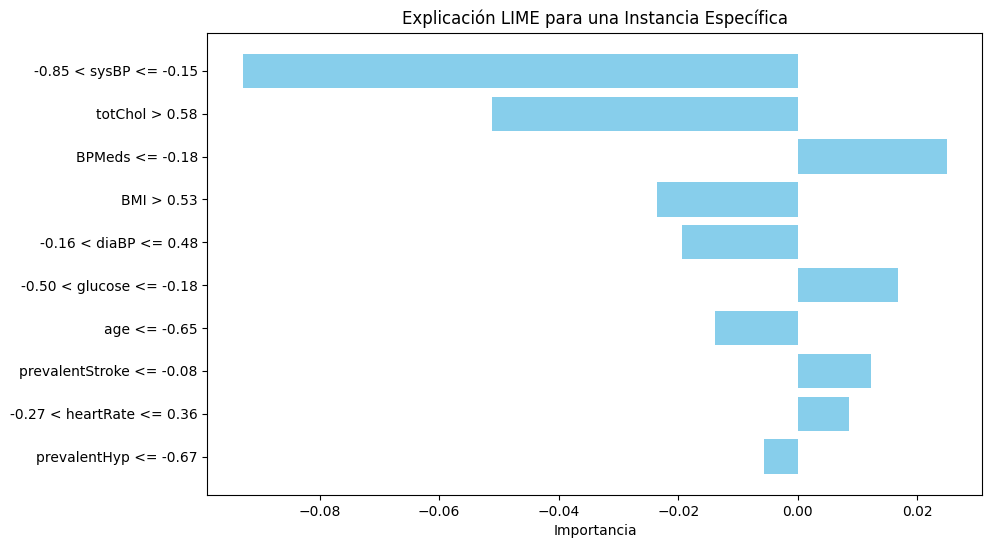

In [ ]:
interpret_model(dataset4_best_model, dataset4_undersampled, 'TenYearCHD')

## Dataset 5

Pasos en el pipeline:
standardscaler: StandardScaler()
xgbclassifier: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=50,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)


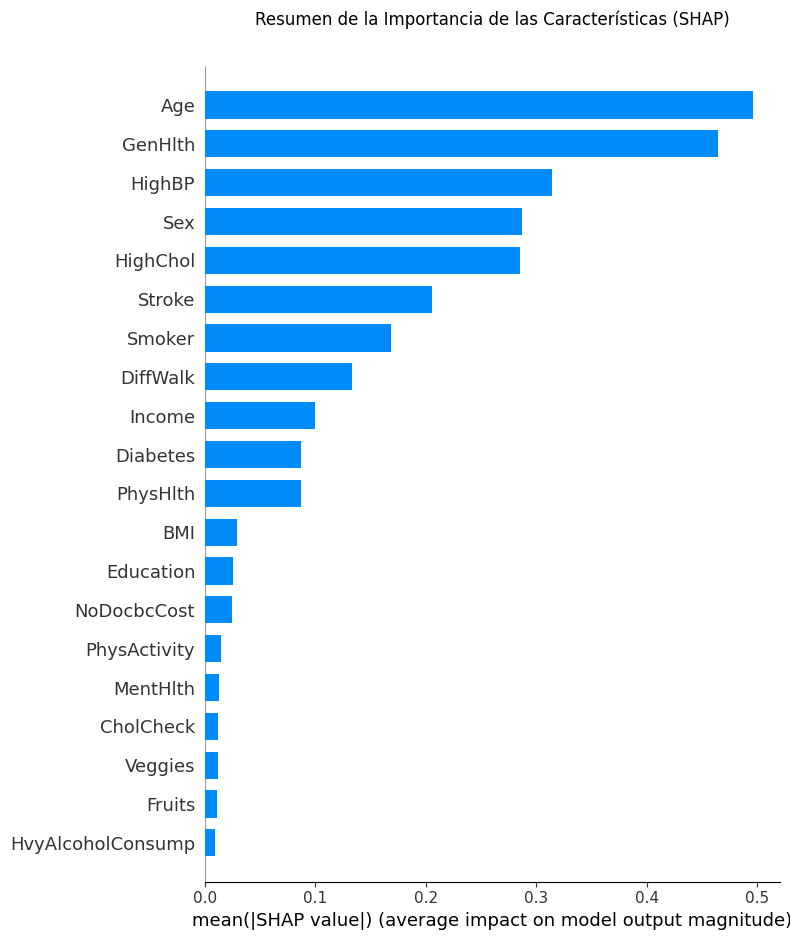

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


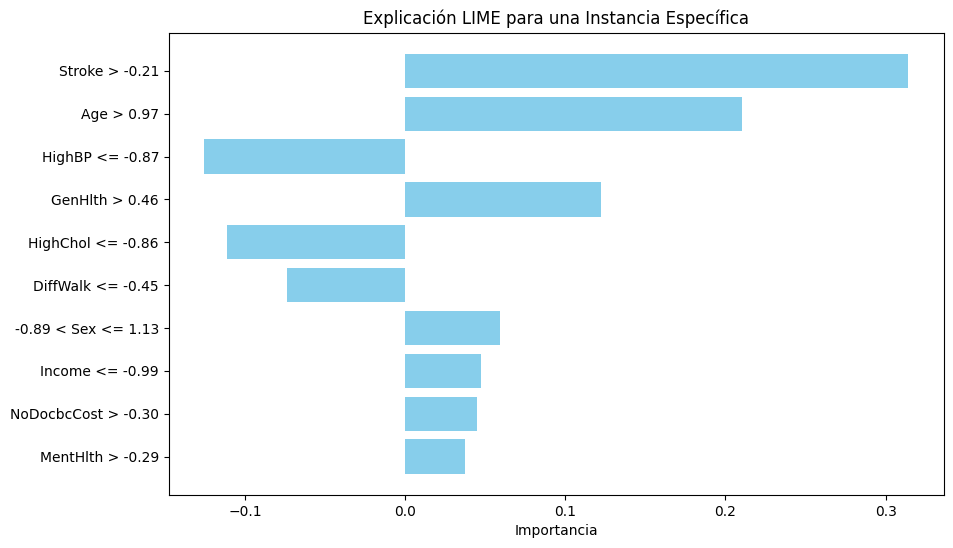

In [ ]:
interpret_model(dataset5_best_model, dataset5_undersampled, 'HeartDiseaseorAttack')

## Dataset 6

Pasos en el pipeline:
standardscaler: StandardScaler()
xgbclassifier: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.2, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=50,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)


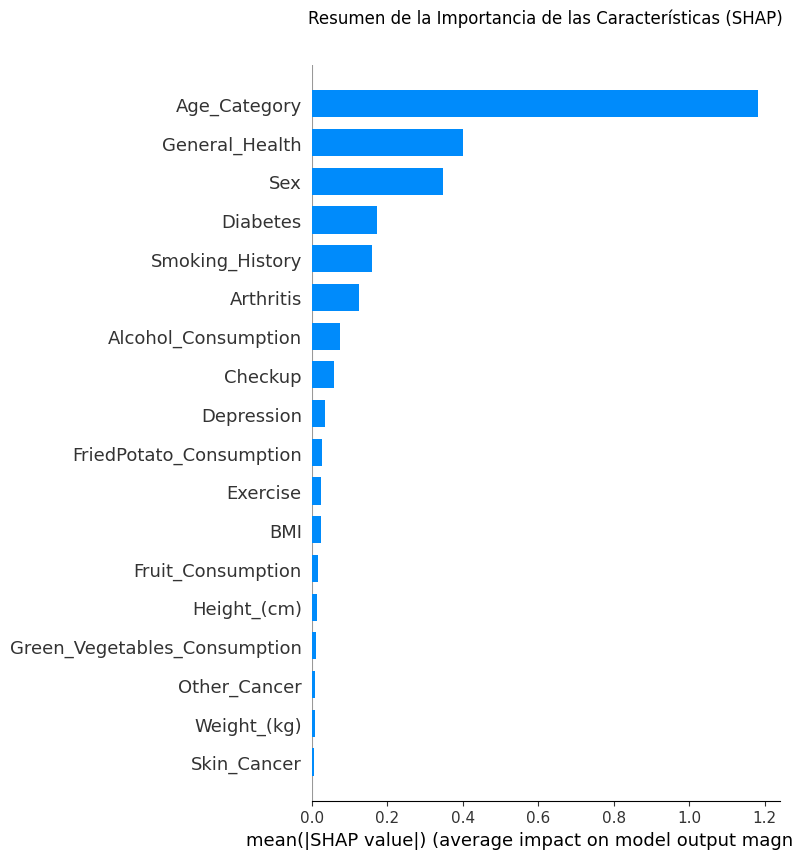

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


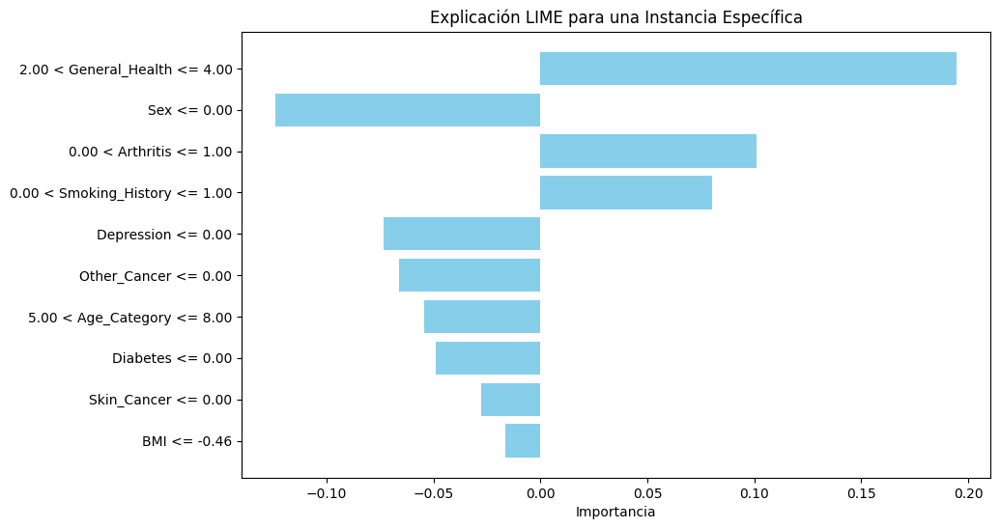

In [ ]:
interpret_model(dataset6_best_model, dataset6_undersampled, 'Heart_Disease')

# Resultados

En base a los valores recogidos en los puntos anteriores, se pueden emitir una serie de conclusiones que comparan el rendimiento de TabPFN frente a los distintos algoritmos tradicionales empleados:
* DecisionTree: TabPFN supera consistentemente a DecisionTree en todos los datasets, mostrando una capacidad superior para manejar tanto datasets pequeños como medianos.
* XGBoost: Aunque XGBoost tiene un rendimiento excelente en datasets pequeños y medianos, TabPFN logra mantenerse competitivo, especialmente en términos de AUC-ROC, lo que indica una separación de clases efectiva.
* KNN: KNN supera ligeramente a TabPFN en algunos datasets, pero TabPFN muestra una mayor capacidad de generalización y separación de clases en otros, destacando en AUC-ROC.
* SVC: SVC tiene un rendimiento fuerte, similar a KNN, pero TabPFN sigue siendo competitivo y en algunos casos, muestra un mejor rendimiento en la separación de clases.

En general, TabPFN demuestra ser un modelo robusto, obteniendo una buena separación de clases y ofreciendo un rendimiento equilibrado y consistente para los distintos conjuntos de datos probados. A pesar de que los transformers no sean arquitecturas diseñadas para el manejo de datos tabulares, la adaptación que ofrece TabPFN le permite competir cara a cara con los diversos algoritmos tradicionales que sí están pensados para trabajar con este tipo de datos, incluso llegando a superarles en algunas métricas y conjuntos de datos.


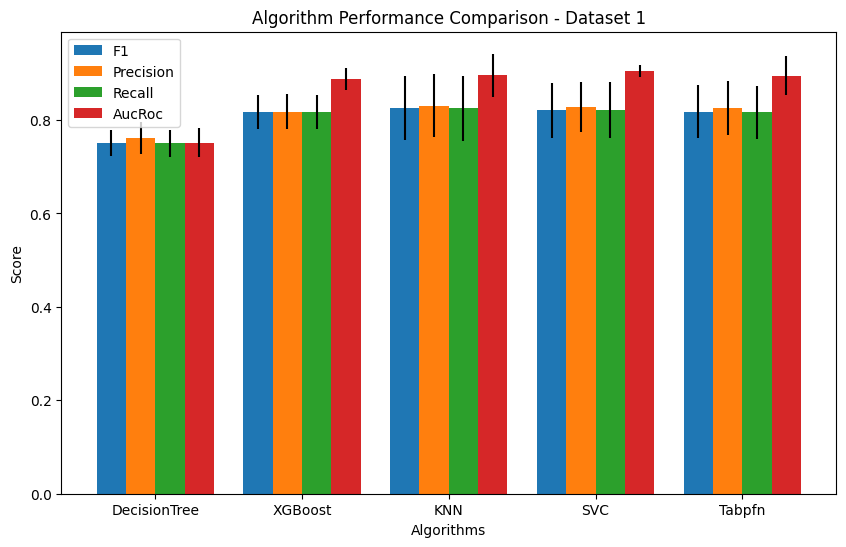

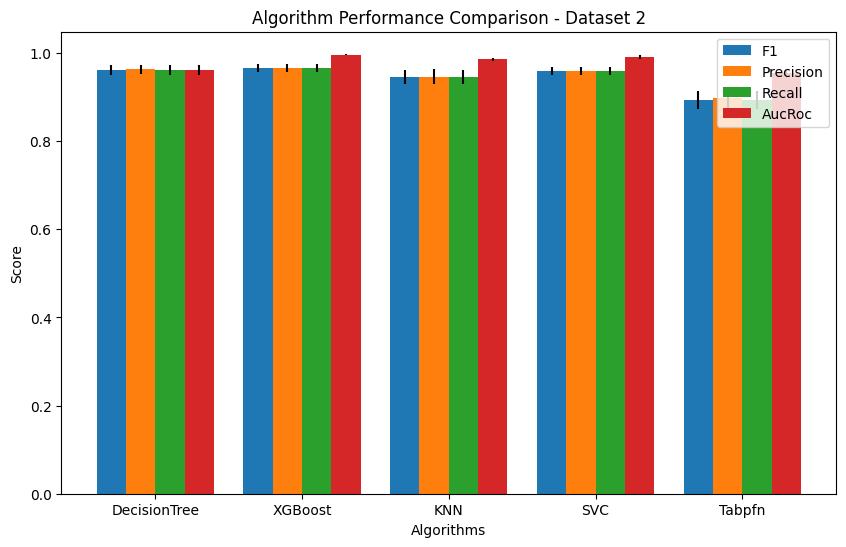

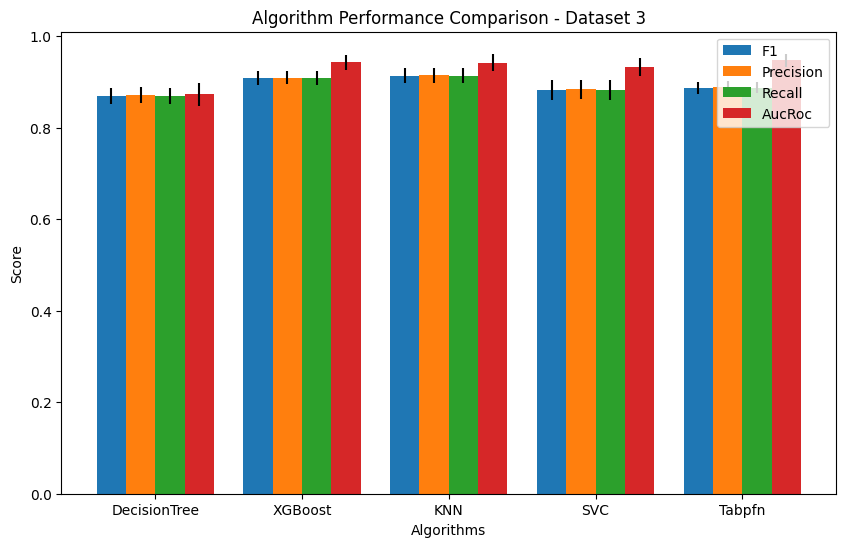

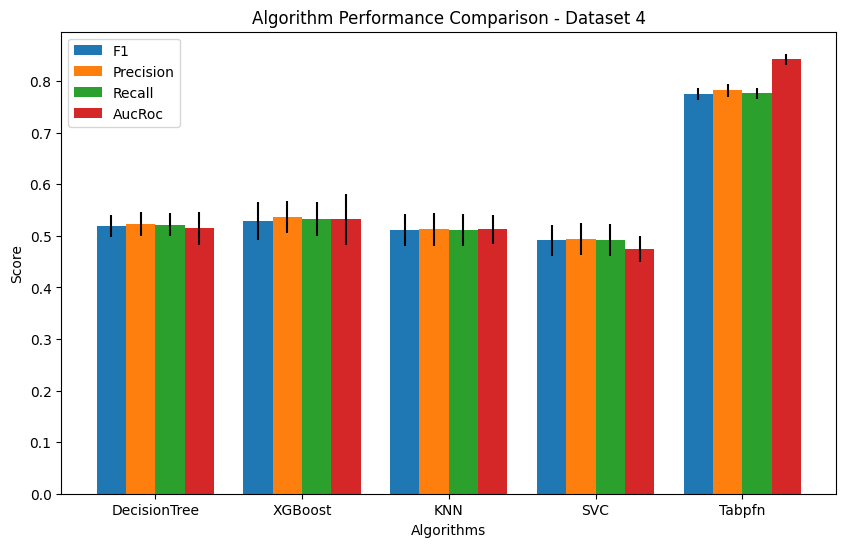

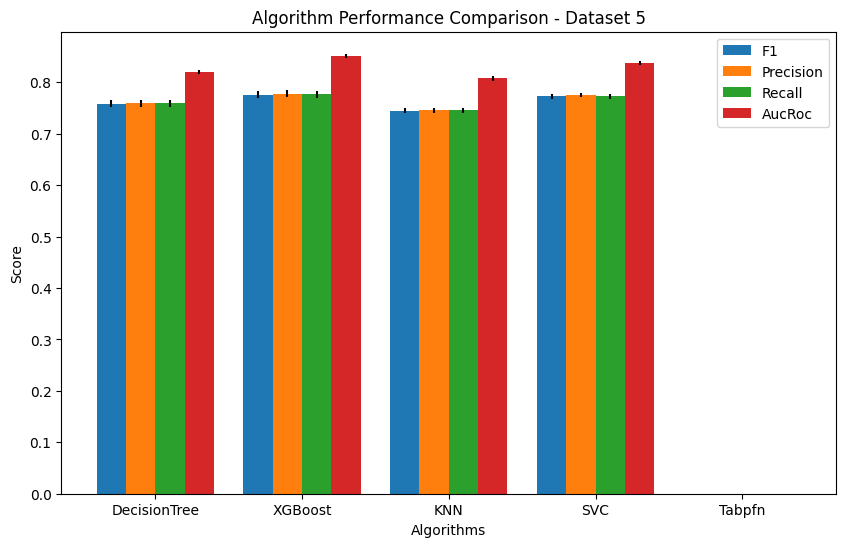

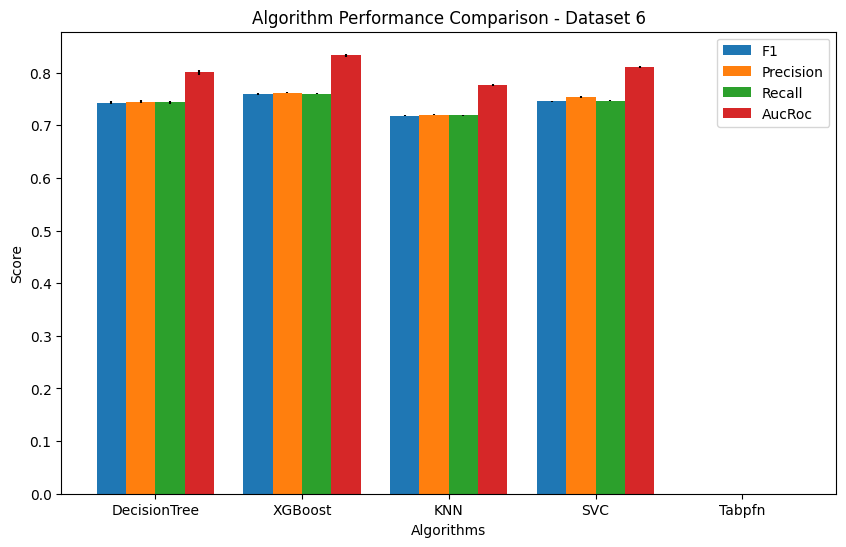

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Supongamos que df_results ya tiene valores reales y deviations contiene las desviaciones estándar
df_results = pd.DataFrame({
    'DecisionTreeF1': [0.749967, 0.960697, 0.869233, 0.519241, 0.7585, 0.7430],
    'DecisionTreePrecision': [0.761157, 0.962375, 0.870644, 0.523305, 0.7590, 0.7451],
    'DecisionTreeRecall': [0.750000, 0.960714, 0.869333, 0.521693, 0.7587, 0.7435],
    'DecisionTreeAucRoc': [0.751362, 0.961399, 0.872665, 0.514571, 0.8199, 0.8005],
    'XGBoostF1': [0.816245, 0.965456, 0.908425, 0.528811, 0.7760, 0.7594],
    'XGBoostPrecision': [0.817859, 0.966265, 0.909284, 0.535883, 0.7777, 0.7623],
    'XGBoostRecall': [0.816667, 0.965476, 0.908444, 0.533333, 0.7764, 0.7600],
    'XGBoostAucRoc': [0.888145, 0.996134, 0.943089, 0.532138, 0.8509, 0.8330],
    'KNNF1': [0.825503, 0.945246, 0.913776, 0.510829, 0.7448, 0.7184],
    'KNNPrecision': [0.830478, 0.946135, 0.914024, 0.512309, 0.7454, 0.7203],
    'KNNRecall': [0.825000, 0.945238, 0.913778, 0.511111, 0.7450, 0.7190],
    'KNNAucRoc': [0.895859, 0.985111, 0.941564, 0.512391, 0.8073, 0.7761],
    'SVCF1': [0.820259, 0.959506, 0.882598, 0.491153, 0.7723, 0.7453],
    'SVCPrecision': [0.828411, 0.959973, 0.883461, 0.493742, 0.7750, 0.7535],
    'SVCRecall': [0.820833, 0.959524, 0.882667, 0.492063, 0.7729, 0.7470],
    'SVCAucRoc': [0.905159, 0.990805, 0.931799, 0.475022, 0.8367, 0.8108],
    'TabpfnF1': [0.817698, 0.892861, 0.887320, 0.775215, 0, 0],
    'TabpfnPrecision': [0.825223, 0.897091, 0.888741, 0.782508, 0, 0],
    'TabpfnRecall': [0.816667, 0.893103, 0.887302, 0.776367, 0, 0],
    'TabpfnAucRoc': [0.895074, 0.954532, 0.947119, 0.841893, 0, 0]
})

deviations = pd.DataFrame({
    'DecisionTreeF1': [0.0275, 0.0117, 0.0178, 0.0207, 0.0068, 0.0026],
    'DecisionTreePrecision': [0.0334, 0.0106, 0.0172, 0.0235, 0.0067, 0.0026],
    'DecisionTreeRecall': [0.0283, 0.0117, 0.0177, 0.0228, 0.0068, 0.0026],
    'DecisionTreeAucRoc': [0.0311, 0.0122, 0.0251, 0.0318, 0.0046, 0.0042],
    'XGBoostF1': [0.0361, 0.0095, 0.0145, 0.0377, 0.0066, 0.0012],
    'XGBoostPrecision': [0.0371, 0.0086, 0.0142, 0.0310, 0.0063, 0.0016],
    'XGBoostRecall': [0.0358, 0.0095, 0.0145, 0.0330, 0.0065, 0.0013],
    'XGBoostAucRoc': [0.0235, 0.0020, 0.0165, 0.0494, 0.0044, 0.0030],
    'KNNF1': [0.0686, 0.0166, 0.0161, 0.0314, 0.0045, 0.0012],
    'KNNPrecision': [0.0669, 0.0163, 0.0159, 0.0314, 0.0044, 0.0015],
    'KNNRecall': [0.0692, 0.0166, 0.0160, 0.0311, 0.0045, 0.0012],
    'KNNAucRoc': [0.0459, 0.0041, 0.0188, 0.0282, 0.0043, 0.0017],
    'SVCF1': [0.0593, 0.0095, 0.0218, 0.0301, 0.0048, 0.0015],
    'SVCPrecision': [0.0535, 0.0091, 0.0210, 0.0312, 0.0047, 0.0016],
    'SVCRecall': [0.0598, 0.0095, 0.0217, 0.0316, 0.0048, 0.0015],
    'SVCAucRoc': [0.0124, 0.0051, 0.0195, 0.0252, 0.0041, 0.0024],
    'TabpfnF1': [0.0563, 0.0200, 0.0128, 0.0111, 0, 0],
    'TabpfnPrecision': [0.0579, 0.0211, 0.0122, 0.0125, 0, 0],
    'TabpfnRecall': [0.0568, 0.0199, 0.0127, 0.0111, 0, 0],
    'TabpfnAucRoc': [0.0418, 0.0074, 0.0144, 0.0112, 0, 0]
})

algorithms = ['DecisionTree', 'XGBoost', 'KNN', 'SVC', 'Tabpfn']
metrics = ['F1', 'Precision', 'Recall', 'AucRoc']

# Iterar sobre cada fila y generar un gráfico
for idx, row in df_results.iterrows():
    # Preparar el gráfico
    fig, ax = plt.subplots(figsize=(10, 6))

    x = np.arange(len(algorithms))  # la ubicación de los grupos en el eje x
    width = 0.2  # el ancho de las barras

    for i, metric in enumerate(metrics):
        # Graficar las barras
        ax.bar(x + i*width, row[[f'{algo}{metric}' for algo in algorithms]], width,
               yerr=deviations.iloc[idx][[f'{algo}{metric}' for algo in algorithms]],
               label=metric)

    # Añadir etiquetas y formato al gráfico
    ax.set_xlabel('Algorithms')
    ax.set_ylabel('Score')
    ax.set_title(f'Algorithm Performance Comparison - Dataset {idx+1}')
    ax.set_xticks(x + width * 1.5)
    ax.set_xticklabels(algorithms)
    ax.legend()

    # Mostrar el gráfico
    plt.show()

#Conclusión

El objetivo que ha motivado a realizar este proyecto ha sido el de poder ayudar a las personas a comprender el riesgo de su estilo de vida, ofreciéndoles una valoración mediante inteligencia artificial del riesgo que tienen de padecer un infarto debido a sus hábitos de vida junto a sus variables biológicas. Con el propósito, en última instancia, de que tomen en consideración dicho riesgo y mejoren sus hábitos de salud.

A nivel científico, se espera que este trabajo contribuya al conocimiento en el campo de la prevención y previsión de factores de riesgo en enfermedades cardiovasculares, y sea capaz de brindar información relevante para la predicción de posibles infartos en un periodo cercano en base a los datos clínicos y hábitos de vida del paciente.

Para la creación del modelo de inteligencia artificial se ha seguido un riguroso proceso en el que se han tenido en cuenta todas las etapas habituales que se dan en este tipo de desarrollos, desde la ingesta de los datos, pasando por su análisis exploratorio y el preprocesamiento de los mismos, hasta finalizar con el entrenamiento y evaluación del propio modelo.

Por último, considero que ha sido relevante experimentar con tecnologías como redes GAN, algoritmos transformers y técnicas explicabilidad para obtener, puesto que han permitido ofrecer un enfoque innovador a la hora de resolver el problema y obtenido excelentes resultados capaces de rivalizar con las técnicas convencionales.

In [ ]:
# Mostrar los resultados obtenidos en los distintos modelos
print(df_results)

   DecisionTreeF1  DecisionTreePrecision  DecisionTreeRecall  \
0        0.757800               0.765103            0.758333   
1        0.955928               0.957726            0.955952   
2        0.000000               0.000000            0.000000   
3        0.000000               0.000000            0.000000   
4        0.000000               0.000000            0.000000   
5        0.000000               0.000000            0.000000   

   DecisionTreeAucRoc  XGBoostF1  XGBoostPrecision  XGBoostRecall  \
0            0.756029   0.816245          0.817859       0.816667   
1            0.956635   0.965456          0.966265       0.965476   
2            0.000000   0.000000          0.000000       0.000000   
3            0.000000   0.000000          0.000000       0.000000   
4            0.000000   0.000000          0.000000       0.000000   
5            0.000000   0.000000          0.000000       0.000000   

   XGBoostAucRoc  TabpfnF1  TabpfnPrecision  TabpfnRecall  TabpfnAu